In [2]:
import pickle as pkl
import pandas as pd
import lightgbm as lgb
from scipy import stats
from scipy.stats import ttest_ind
from pandas.plotting import parallel_coordinates
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import sys
sys.path.append("msc_thesis/hbac scripts")
import hbac_kmeans
from sklearn import metrics
import shap
from statistics import mean

# Loading in data
X_test_data = pd.read_pickle('data/X_test_data')
Y_test_data = pd.read_pickle('data/Y_test_data')
loaded_model = pkl.load(open('data/erv_model_beleggers_version_2022-02-18.pkl', 'rb'))
predictions = loaded_model.predict(X_test_data)


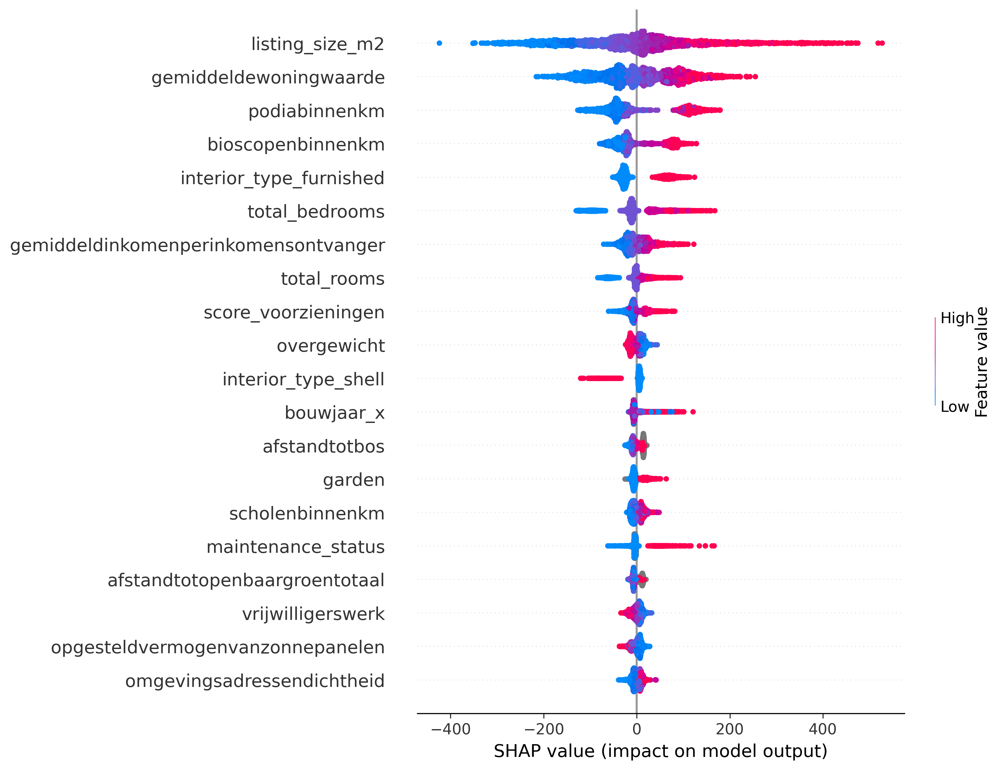

In [34]:
### SHAP on ERV model
shap.initjs()
explainer = shap.TreeExplainer(loaded_model)
shap_values = explainer.shap_values(X_test_data)

shap.summary_plot(shap_values, features=X_test_data, feature_names=X_test_data.columns)
sorted_features = list(df.columns[np.argsort(np.abs(shap_values).mean(0))])[::-1]
pkl.dump(sorted_features, open('sorted_features.pkl', 'wb'))

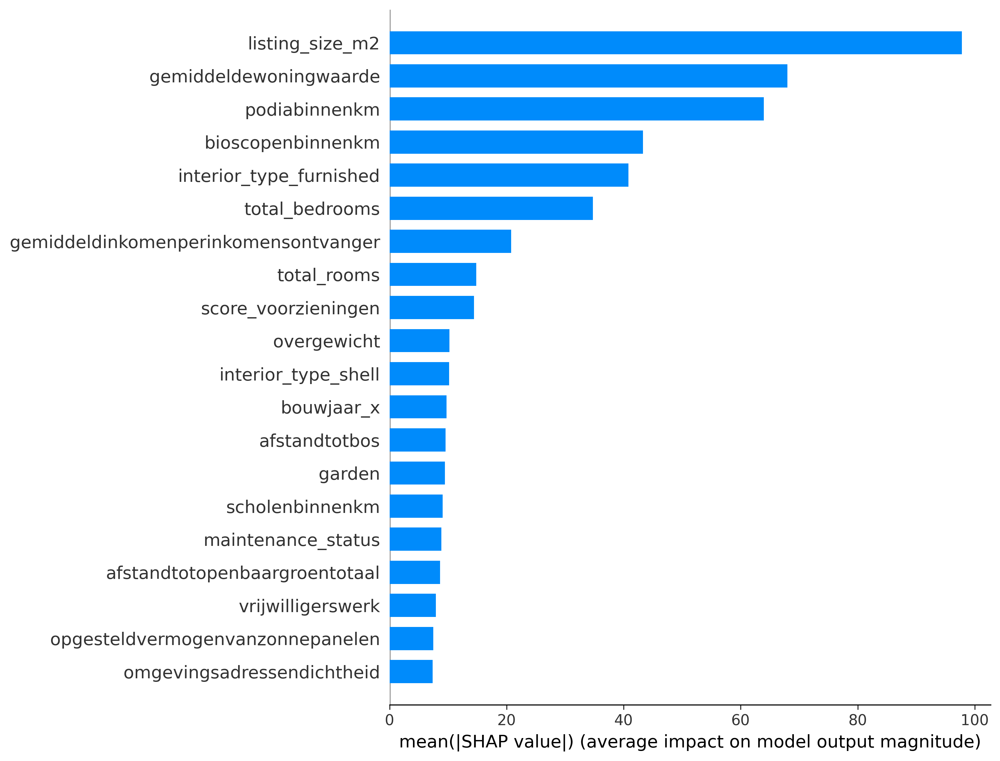

In [35]:
shap.summary_plot(shap_values, features=X_test_data, feature_names=X_test_data.columns, plot_type='bar')


In [2]:
# Preprocessing dataFrame
df = X_test_data.copy()

df['predicted_class'] = predictions.copy()
df['true_class'] = Y_test_data.copy()
df['errors'] = df['predicted_class'] - df['true_class']
df['errors'] = df['errors'] / df['true_class']
print(len(df.columns),'Feature',len(df),'Instances')
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(df.isnull().sum())

105 Feature 2882 Instances
leefbaarheid_score                          0
score_wonen                                 0
score_veiligheid                            0
score_voorzieningen                         0
westerstotaal                              58
nietwesterstotaal                          58
leeftijdscategorie_0_15                    58
leeftijdscategorie_15_25                   58
leeftijdscategorie_25_45                   58
leeftijdscategorie_45_65                   58
leeftijdscategorie_65_plus                 58
bouwjaar_x                               1835
listing_residential_type_apartment          0
listing_residential_type_house              0
maintenance_status                       2215
parking_type_betaald                        0
parking_type_garage                         0
parking_type_onbekend                       0
parking_type_openbaar                       0
parking_type_parkeerplaats                  0
parking_type_vergunning                     0
garden 

In [3]:
## HANDLE MISSING VALUES

### Using miceforest for multiple imputation https://pypi.org/project/miceforest/
import miceforest as mf



# Create kernel. 
kds = mf.ImputationKernel(
  df,
  datasets=5,
  save_all_iterations=True,
  random_state=66
)

# Run the MICE algorithm for 2 iterations on each of the datasets
kds.mice(2)


completed_dataset = kds.complete_data(dataset=0, inplace=False)
print(completed_dataset.isnull().sum(0))

### Save completed dataset
pd.to_pickle(completed_dataset, "completed_dataset.pkl")


# # Fill missing values with column median
# for col in df.select_dtypes(include=np.number):
#     df[col] = df[col].fillna(df[col].median())  

leefbaarheid_score              0
score_wonen                     0
score_veiligheid                0
score_voorzieningen             0
westerstotaal                   0
                               ..
percentagebewoond               0
personenautosnaaroppervlakte    0
predicted_class                 0
true_class                      0
errors                          0
Length: 105, dtype: int64


In [11]:
#### Load completed dataset
df = pd.read_pickle('completed_dataset.pkl')

In [12]:
relevant_features = [
    'listing_size_m2',
    'podiabinnenkm',
    'gemiddeldewoningwaarde',
    'interior_type_furnished',
    'bioscopenbinnenkm',
    'total_bedrooms',
    
    # lon*
    'interior_type_shell',
    # gemeente_totaal_aantal_banen*
    # lat??
    'total_rooms',
    # gemeente_bedrijfvestigingen*
    # score_voorzieningen
    # overgewicht
    'garden',
    # gemiddeldinkomenperinkomensontvanger
    'bouwjaar_x',
    # omgevingsadressendichtheid
    'maintenance_status', # deze heeft heel veel missing values
    # storage

    # extra added, not in top importance features:
    'listing_residential_type_house',

    
    
    # Targets
    'predicted_class',
    'true_class',
    'errors']

##  * are not included in current dataset 

In [13]:
# Pick features to include; SHAP Feature importance

##df = df[['listing_size_m2','total_bedrooms', 'garden']]

df = df[relevant_features].copy()

In [14]:
#### Error scaling factor optimization

from statistics import mean

biases = []
std = []
sillh_list = []
std_sillh = []
# DB_list = []
# CH_list = []
scaling_factors = np.arange(0,10,0.5)

for error_scaling_factor in scaling_factors:
    avg_bias = []
    avg_sillh = []
    for i in range(10):
        results = hbac_kmeans.hbac_kmeans(df, error_scaling_factor, show_plot=False)
        c, max_neg_bias = hbac_kmeans.get_max_bias_cluster(results)
        avg_bias.append(max_neg_bias)
        
        avg_sillh.append(metrics.silhouette_score( results.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class', 'errors'], axis=1),
                                              results['clusters']))
        
#         DB_score = metrics.davies_bouldin_score(results.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class', 'errors'], axis=1),
#                                         results['clusters'])
#         CH_index = metrics.calinski_harabasz_score(results.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class', 'errors'], axis=1),
#                                         results['clusters'])
        
    biases.append(mean(avg_bias))
    std.append(np.std(avg_bias))
    sillh_list.append(mean(avg_sillh))
    std_sillh.append(np.std(avg_sillh))


r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.0621988614690554
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.0931491163879099
--> Cluster with the highest 

max discriminating bias is: -0.052745598248193803
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 1
MAX_ITER
Variance list  [0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038

max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.05252500555010342
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.0524301477597785
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we hav

max discriminating bias is: -0.05271219709086883
This is the random cluster we have picked: 2
max discriminating bias is: -0.09723345013395901
This is the random cluster we have picked: 2
max discriminating bias is: -0.09723345013395901
This is the random cluster we have picked: 2
max discriminating bias is: -0.11609629018086354
This is the random cluster we have picked: 1
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 1
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 1
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 2
max discriminating bias is: -0.09723345013395901
This is the random cluster we have picked: 1
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09723345013395901
This is the random cluster we have picked: 2
max discriminat

max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random clus

max discriminating bias is: -0.0621988614690554
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.052559

max discriminating bias is: -0.0621988614690554
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 1
max discriminating bias is: -0.08498484051774424
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -0.10386670604278214
This is the random cluster we have picked: 2
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 2
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 1
max discriminating bias is: -0.10386670604278214
This is the random cluster we have picked: 1
max discriminating bias is: -0.117455

max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.0038686983680467444, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226]
1 has bias 0.0621988614690554
0 has bias -0.11540903101370048
2 has bias -0.08498484051774424
3 has bias -0.006240398081801768
cluster with the highest discriminating bias: 0
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.06418453981807448
-->

max discriminating bias is: -0.10646897719281223
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 2
This is the random cluster we have picked: 3
max discriminating bias is: -0.36493219109583963
This is the random cluster we have picked: 3
max discriminating bias is: -0.36493219109583963
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
max discriminating bias is: -0.050462458303612845
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
max discriminating bias is: -0.36493219109583963
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.28400375870

max discriminating bias is: -0.050462458303612845
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.050462458303612845
This is the random cluster we have picked: 1
max discriminating bias is: -0.050462458303612845
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random 

max discriminating bias is: -0.06421573472316433
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.050462458303612845
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.050462458303612845
This is the random cluster we have picked: 1
max discriminating bias is: -0.241058

This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 1
max discriminating bias is: -0.10008821206520879
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.004618946213056237, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271]
0 has bias 0.06796282964279987
1 has bias -0.03333758804152531
2 has bias -0.2805920182704137
cluster with the highest discriminating bias: 2
r_squared of

max discriminating bias is: -0.04593000039065198
This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 0
max discriminating bias is: -0.09956930886379844
This is the random cluster we have picked: 0
max discriminating bias is: -0.09956930886379844
This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 1
max discriminating bias is: -0.04593000039065198
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cl

max discriminating bias is: -0.06596973969455566
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -0.2804983366737288
--> Cluster with the highest variance: 0
max discriminating bias is: -0.04790764262180092
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09269732930455632
This is the random cluster we have picked: 1
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 0
max discriminating bias is: -0.04790764262180092
This is the random cluster we have picked: 0
max discriminating bias is: -0.04790764262180092
This is the random cluster we have picked: 0
max discriminating bias is: -0.04790764262180092
This is the random cluster we have picked: 0
max discriminating bias is: -0.047

max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.004352006555367433, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449]
1 has bias 0.06596973969455566
2 has bias -0.03420168158295889
0 has bias -0.27194226544511624
cluster with the highest discriminating bias: 0
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.06596973969455566
--> Cluster with the highest variance: 0
--> Cluster wi

This is the random cluster we have picked: 0
max discriminating bias is: -0.048448207019119005
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
max discriminating bias is: -0.048448207019119005
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.004446184523765125, 0.019865339636917747, 0.019865339636917747, 0.019865339636917747, 0.

max discriminating bias is: -0.048448207019119005
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 1
max discriminating bias is: -0.5419046471773081
--> Cluster with the highest variance: 0
max discriminating bias is: -0.048448207019119005
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 1
max discriminating bias is: 0.11705420055253724
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.11694775537987856
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random clust

max discriminating bias is: -0.048448207019119005
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.004446184523765125, 0.019865339636917747, 0.019865339636917747, 0.019865339636917747, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893]
1 has bias 0.06667971598443656
3 has bias 0.1416285476192407
2 has bias -0.2694436902996188
0 has bias -0.5170080971408249
cluster with the highest discriminating bias: 0
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.06667971598443656
--> Cluster with the h

max discriminating bias is: -0.04932407441464248
This is the random cluster we have picked: 1
max discriminating bias is: -0.04932407441464248
This is the random cluster we have picked: 3
max discriminating bias is: 0.11738096693527855
This is the random cluster we have picked: 0
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.04932407441464248
This is the random cluster we have picked: 0
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.04932407441464248
This is the random cluster we have picked: 3
max discriminating bias is: 0.1172751734797054
This is the random cluster we have picked: 1
max discriminating bias is: -0.04932407441464248
This is the random cluster we have picked: 3
max discriminating bias is: 0.11738096693527855
This is the random 

max discriminating bias is: -0.27644707051868034
This is the random cluster we have picked: 0
max discriminating bias is: -1.0560784093516735
This is the random cluster we have picked: 1
MAX_ITER
Variance list  [0.01714877477716305, 0.013419032776175925, 0.013419032776175925, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307]
2 has bias -0.01227742918021435
1 has bias 0.13095333053100655
0 has bias -0.0708245292752201
3 has bias -1.0466929022769063
cluster with the highest discriminating bias: 3
r_squared of all data is:

max discriminating bias is: -0.2888835313760587
This is the random cluster we have picked: 0
max discriminating bias is: -0.0669536463591035
This is the random cluster we have picked: 0
max discriminating bias is: -0.0669536463591035
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -1.0574889378572339
This is the random cluster we have picked: 1
max discriminating bias is: -0.2888835313760587
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
max discriminating bias is: -1.6278722670618029
This is the random cluster we have picked: 0
max discriminating bias is: -0.0669536463591035
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
max discriminating bias is: -1.6066689719365927
This is the random cluster we have picked: 2
max discriminating bias is: -1.0574889378572339
This is the random cluster w

max discriminating bias is: -0.06606756625805843
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -1.026689606520753
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -1.1952137595531234
This is the random cluster we have picked: 1
max discriminating bias is: -1.6148669846169155
This is the random cluster we have picked: 1
max discriminating bias is: -1.7301132520316498
This is the random cluster we have picked: 1
max discriminating bias is: -1.7301132520316498
This is the random cluster we have picked: 1
max discriminating bias is: -1.7301132520316498
This is the random cluster we have picked: 3
max discriminating bias is: -0.28074259904441556
This is the random cluster we have picked: 1
max discriminating bias is: -1.7301132520316498
This is the random cluster we have pick

max discriminating bias is: -0.9892926268478618
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -1.0319152472094602
This is the random cluster we have picked: 0
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 1
max discriminating bias is: -0.1732410799265709
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.11056797942718766
This is the random cluster we have picked: 0
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 2
max discriminating bias is: -1.0319152472094602
This is the random cluster we have picked: 1
max discriminating bias is: -0.11056797942718766
This is the random cluster we have picked: 1
max discriminating bias is: -0.11056797942718766
This is the random cluster we have picked: 1
max discriminating bias is: -0.1105

max discriminating bias is: -1.0252680546278343
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -1.0252680546278343
This is the random cluster we have picked: 2
max discriminating bias is: -1.0252680546278343
This is the random cluster we have picked: 1
max discriminating bias is: 0.007830087135099473
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.01552477672429593, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.252736181

max discriminating bias is: -0.0994555342628094
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -1.0319152472094602
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 0
max discriminating bias is: -0.10800738726024717
This is the random cluster we have picked: 1
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 2
max discriminating bias is: -1.0319152472094602
This is the random cluster we have picked: 0
max discriminating bias is: -0.10983977585190619
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 2
max discriminating bias is

max discriminating bias is: -1.0395509059095944
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -1.0395509059095944
This is the random cluster we have picked: 2
max discriminating bias is: -1.0395509059095944
This is the random cluster we have picked: 0
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.1732410799265709
This is the random cluster we have picked: 2
max discriminating bias is: -1.0395509059095944
This is the random cluster we have picked: 0
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 2
max discriminating bias is: -1.0395509059095944
This is the random cluster we have picked: 1
max discriminating bias is: -0.11056797942718766
This is the random cluster we have picked: 2
max discriminating bias is: -1.0395509059095944
This is the random clu

max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 1
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018103852024413454, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456]
2 has bias 0.021736169745606437
1 has bias 0.13455055564513085
0 has bia

max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.007361410916876809
This is the random cluster we have picked: 0
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 1
max discriminating bias is: 0.007633417027105627
This is the random cluster we have picked: 1
max discriminating bias is: 0.007361410916876809
This is the random cluster we have picked: 1
max discriminating bias is: 0.007633417027105627
This is the random cluster we have picked: 0
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is:

max discriminating bias is: -0.13455055564513085
--> Cluster with the highest variance: 1
max discriminating bias is: -1.0350614010826935
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 0
max discriminating bias is: -0.1751981974695398
This is the random cluster we have picked: 2
max discriminating bias is: 0.007633417027105627
This is the random cluster we have picked: 2
max discriminating bias is: 0.007633417027105627
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 0
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked:

max discriminating bias is: 0.007361410916876809
This is the random cluster we have picked: 1
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.018103852024413454, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.27762793544007

max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 2
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 2
max discriminating bias is: -2.531948474368013
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is:

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.13695026862424242
--> Cluster with the highest variance: 1
max discriminating bias is: -1.089999209247868
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 2
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 1
max discriminating bias is: -2.531948474368013
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367

max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 2
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 2
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 1
max discriminating bias is: 0.008623143905345909
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018755376076252158, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.

max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.531948474368013
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster 

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.13695026862424242
--> Cluster with the highest variance: 1
max discriminating bias is: -1.0879530456458477
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23569801282552727
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23457684227343745
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 0
max discriminating bias is: -0.23569801282552727
Th

This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -2.5083522681816515
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: 0.009796490344219477
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.018732495474513236, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164]
2 has bias 0.0217676296337711
1 has bias 0.136

max discriminating bias is: 0.010059201269048135
This is the random cluster we have picked: 2
max discriminating bias is: -2.5083522681816515
This is the random cluster we have picked: 0
max discriminating bias is: 0.012561383074786825
This is the random cluster we have picked: 0
max discriminating bias is: 0.010059201269048135
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 2
max discriminating bias is: -2.531948474368013
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: 0.010059201269048135
This is the random cluster we have picked: 1
max discriminating bias is: -0.23569801282552727
This is the random cluster we have picked: 1
max discriminating bias is: -0.23569801282552727
This is the random cluster we have picked: 2
max discriminating bias is: -2.531948474368013
This is the random clu

max discriminating bias is: -0.13696679434325487
--> Cluster with the highest variance: 0
max discriminating bias is: -1.0856016746329051
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -2.5083522681816515
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: 0.010320409569132605
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -2.5083522681816515
This is the random cluster we have picked: 2
max discriminating bias is: 0.009807373597386926
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 1
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 1
max discriminating bias is: -0.23491036134

max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 1
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018736981639112065, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133]
2

max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 1
max discriminating bias is: 0.013898489176826345
This is the random cluster we have picked: 0
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 1
max discriminating bias is: 0.012729681888893896
This is the random cluster we have picked: 1
max discriminating bias is: 0.009814894104802518
This is the random cluster we have picked: 0
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 0
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 0
max discriminating bias is: -0.23712956832101129
This is the random c

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.1368830947893569
--> Cluster with the highest variance: 1
max discriminating bias is: -1.0856016746329051
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: 0.009814894104802518
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 0

max discriminating bias is: -0.23361572221879878
This is the random cluster we have picked: 0
max discriminating bias is: 0.016926819225852485
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018403755234608125, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027]
0 has bias 0.024011819819329427
1 has bias 0.13566044093474017
2 has bias -1.071367418135231
cluster with the highest discriminating bias: 2
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.1374742

max discriminating bias is: -0.23361572221879878
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23361572221879878
This is the random cluster we have picked: 1
max discriminating bias is: -0.23399246012578168
This is the random cluster we have picked: 2
max discriminating bias is: 0.01582579080409441
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: 0.01582579080409441
This is the random cluster we have picked: 2
max discriminating bias is: 0.016887943348035783
This is the random cluster we have picked: 3
This is the random cluster w

max discriminating bias is: -1.071367418135231
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: 0.013073863753917392
This is the random cluster we have picked: 1
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 0
max discriminating bias is: -0.23361572221879878
This is the random cluster we have picked: 0
max discriminating bias is: -0.23361572221879878
This is the random cluster we have picked: 2
max discriminating bias is: 0.016926819225852485
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: 0.016926819225852485
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724

max discriminating bias is: -0.23361572221879878
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23399246012578168
This is the random cluster we have picked: 0
max discriminating bias is: 0.016926819225852485
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 0
max discriminating bias is: 0.01582579080409441
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.018403755234608125, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.

max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 2
max discriminating bias is: -0.08367508904414134
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 2
max discriminating bias is: -0.09260074320500744
This is the random cluster we have picked: 0
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 2
max discriminating bias is: -0.09260074320500744
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cl

max discriminating bias is: -0.13502309530243062
--> Cluster with the highest variance: 0
max discriminating bias is: -1.071367418135231
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: -0.09260074320500744
This is the random cluster we have picked: 2
max discriminating bias is: -0.08584769416883842
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.08584769416883

max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.08367508904414134
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.01823123626504926, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758]
1 has bias 0.024579728197989925
0 has bias 0.13502309530243062
2 has bias -1.071367418135231
cluster with the highest discriminating bia

max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.09260074320500744
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 0
max discriminating bias is: -0.08367508904414134
This is the random cluster we have picked: 0
max discriminating bias is: -0.08584769416883842
This is the random cluster we have picked: 0
max discriminating bias is: -0.08584769416883842
This is the random cluster we have picked: 1
max discriminating bi

max discriminating bias is: -0.13502309530243062
--> Cluster with the highest variance: 1
max discriminating bias is: -1.074239495975592
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 0
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 2
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 2
max discriminating bias is: -0.09368185205322366
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have pick

max discriminating bias is: -0.09328210631646339
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 0
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 2
max discriminating bias is: -0.09368185205322366
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.01823123626504926, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.2978613146965840

max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.09447380408932171
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -0.09447380408932171
This is the random cluster we have picked: 1
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.01823123626504926, 0.29786131469658406, 0.29786

max discriminating bias is: -0.13535884738568882
--> Cluster with the highest variance: 1
max discriminating bias is: -1.074239495975592
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 0
max discriminating bias is: -0.23398967525105752

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.13535884738568882
--> Cluster with the highest variance: 0
max discriminating bias is: -1.074239495975592
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09857723206172064
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 2
max discriminating bias is: -0.09447380408932171
This is the random cluster we have picked: 1
max discriminating bias is: -0.2339896752510575

This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 2
max discriminating bias is: -0.10111015461869877
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.01901671787864257, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966]
2 has bias 0.02042487509217683
0 has bias 0.13790111630673108
1 has bias -1.0760065507329126
c

max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 2
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 

max discriminating bias is: -1.0783754604401086
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -0.10009344840584833
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 3
This is the random cluster we have picked

max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 0
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 0
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 0
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.018322017565582195, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 

max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 1
max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 0
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.09606684841916979
This is the random cluster we have picked: 0
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bia

max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 2
max discriminating bias is: -0.10009344840584833
This is the random cluster we have picked: 2
max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018322017565582195, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156]
2 has bias 0.022950667333849095
0 has bias 0.13535884738568882
1 has bias -1.0783754604401086
cluster wi

max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 0
max discriminating bias is: -0.23326326613031445
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 1
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23326326613031445
This is the random cluster we have picked: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 0
max discriminating bias is: -0.23326326613031445
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random 

2 has bias -1.0760065507329126
cluster with the highest discriminating bias: 2
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.13576394318504792
--> Cluster with the highest variance: 1
max discriminating bias is: -1.0783754604401086
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724555131
This is 

max discriminating bias is: -0.23326326613031445
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 0
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 2
max discriminating bias is: -0.10012340098224781
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.01843184826915292, 0.2998971179240797, 0.2998971179240797, 0.2998971179240797, 0.2998971179240797, 0.2998971179240797, 0.2998971179240

max discriminating bias is: -0.13576394318504792
--> Cluster with the highest variance: 0
max discriminating bias is: -1.0783754604401086
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 0
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picke

max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 2
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.018443173462875818, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.29858

max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 2
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the rando

max discriminating bias is: -0.13694714410419984
--> Cluster with the highest variance: 1
max discriminating bias is: -1.0760065507329126
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.23326326613031445
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picke

max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 0
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018443173462875818, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.29858482841499

max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -2.503132062670457
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 3
This is the random clus

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.13580564591678734
--> Cluster with the highest variance: 0
max discriminating bias is: -1.0760065507329126
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 3
This is the random cluster we have picke

max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018443173462875818, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.298584828414

max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 2
max discriminating bias is: -2.503132062670457
This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 1
max discriminating bi

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.13580564591678734
--> Cluster with the highest variance: 1
max discriminating bias is: -1.0760065507329126
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 2
max discriminating bias is: -2.47981863892

This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.018443173462875818, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.298584828

This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we hav

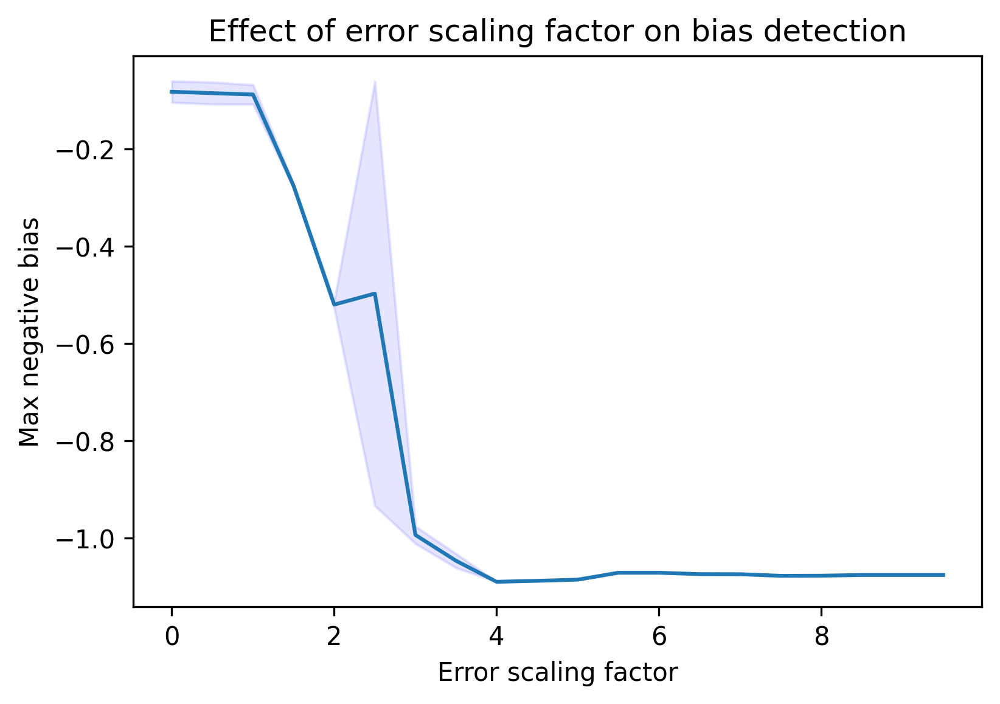

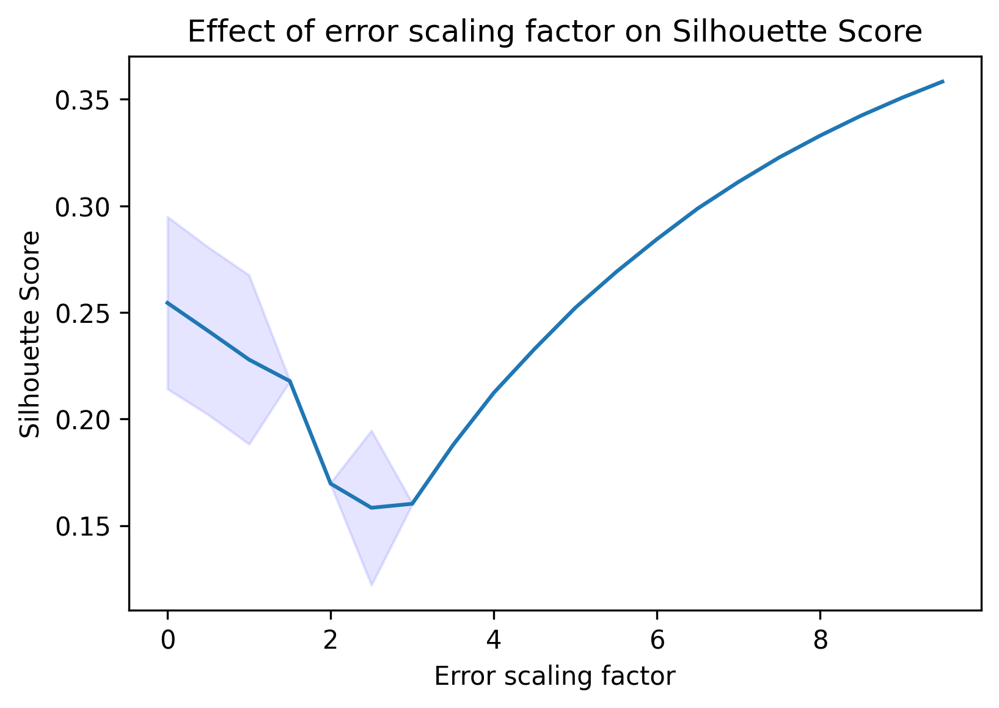

In [15]:
#### plot error scaling optimization

upper_std = (np.array(biases)+np.array(std))
lower_std = (np.array(biases)-np.array(std))
plt.fill_between(scaling_factors,lower_std, upper_std, color='b', alpha=.1)
plt.plot(scaling_factors, biases)
plt.ylabel('Max negative bias')
plt.xlabel('Error scaling factor')
plt.title('Effect of error scaling factor on bias detection')
plt.show()

upper_std = (np.array(sillh_list)+np.array(std_sillh))
lower_std = (np.array(sillh_list)-np.array(std_sillh))
plt.fill_between(scaling_factors,lower_std, upper_std, color='b', alpha=.1)
plt.plot(scaling_factors, sillh_list)
plt.ylabel('Silhouette Score')
plt.xlabel('Error scaling factor')
plt.title('Effect of error scaling factor on Silhouette Score')
plt.show()


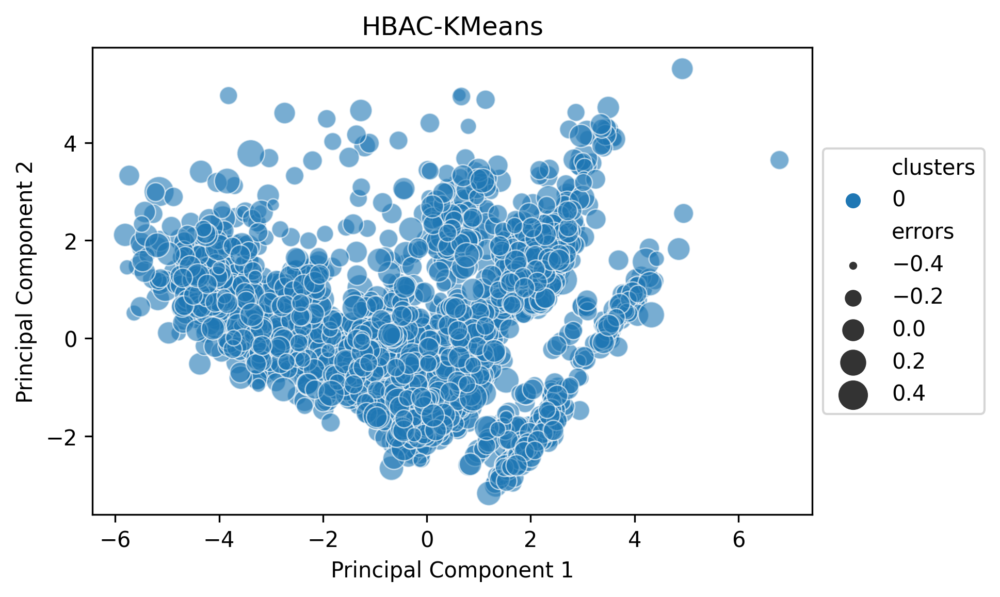

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.0621988614690554


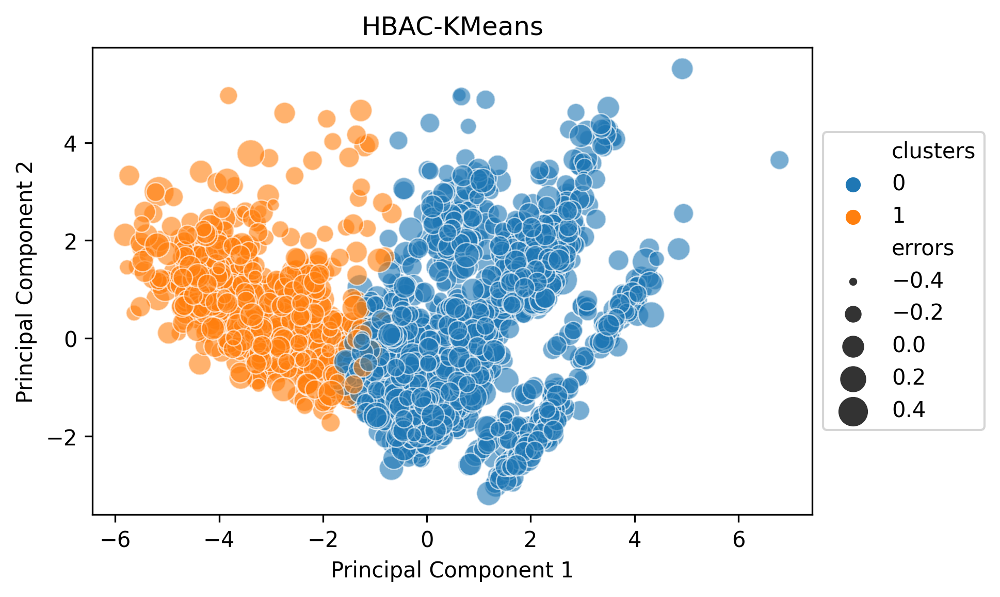

CLUSTER QUALITY
Silhouetter Score: 0.282
DB index: 1.426
CH index: 828.770
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 2


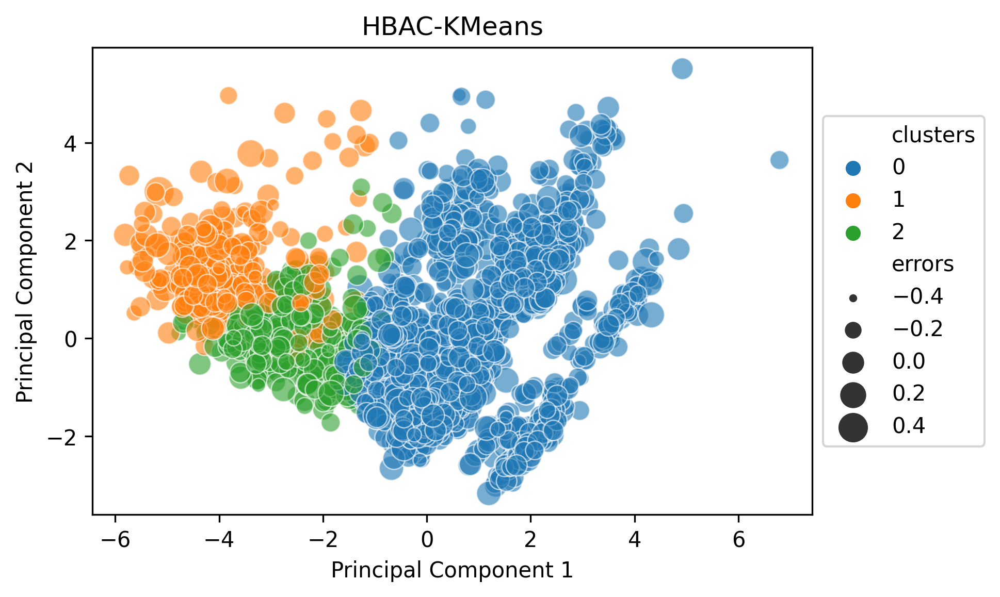

CLUSTER QUALITY
Silhouetter Score: 0.207
DB index: 2.126
CH index: 465.636
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -0.09886581624984458
This is the random cluster we have picked: 2
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 2
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 1
max discriminating bias is: -0.09886581624984458
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444,

In [16]:
results = hbac_kmeans.hbac_kmeans(df, error_scaling_factor = 0.8 , show_plot=True)

In [17]:
c, max_neg_bias = hbac_kmeans.get_max_bias_cluster(results)

print('Cluster ', c,'Bias ', max_neg_bias,'\n')

r2_full_data = hbac_kmeans.accuracy(results)
highest_biased_cluster = results[results['clusters']==c]
r2_highest_biased_cluster = hbac_kmeans.accuracy(highest_biased_cluster)

print('R2 this dataset:', r2_full_data)
print('R2 of discriminated cluster:', r2_highest_biased_cluster)

discriminated_cluster = results[results['clusters']==c]

print('Number of instances in discriminated cluster:', len(discriminated_cluster))

# print('Dataframe of found discriminated cluster:')
#with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#display(discriminated_cluster)

0 has bias 0.0621988614690554
1 has bias -0.0723277665305685
2 has bias -0.08310997835982326
cluster with the highest discriminating bias: 2
Cluster  2 Bias  -0.08310997835982326 

R2 this dataset: 0.8437148874263389
R2 of discriminated cluster: 0.7652122696024561
Number of instances in discriminated cluster: 315


In [18]:
# unscaling the clusters
unscaled_discriminated = df.loc[discriminated_cluster.index, :]
# unscaled other data
unscaled_remaining = df.drop(discriminated_cluster.index)

# Welch's test for differences discrimninated vs remaining data
significant_features = []
welch_T = []
p_values = []
for i in unscaled_remaining:
    welch_i = stats.ttest_ind(unscaled_discriminated[i], unscaled_remaining[i], equal_var=False)
    welch_T.append(welch_i.statistic)
    p_values.append(welch_i.pvalue)
    if welch_i.pvalue <= 0.05:
        significant_features.append(i)
print('Number of significant difference in features of discriminated vs remaining data: ', len(significant_features))

Number of significant difference in features of discriminated vs remaining data:  14


In [19]:
mean_clusters = pd.DataFrame()
mean_clusters['unscaled_discriminated'] = unscaled_discriminated.mean()
mean_clusters['unscaled_remaining'] = unscaled_remaining.mean()
mean_clusters['difference'] = unscaled_discriminated.mean() - unscaled_remaining.mean()

mean_clusters['relative_mean_difference'] = abs(mean_clusters['difference'])
mean_clusters['relative_mean_difference'] = mean_clusters['relative_mean_difference']/mean_clusters['unscaled_remaining']
mean_clusters['Welch T-statistic'] = welch_T
mean_clusters['p-value'] = p_values

# SORT ON: absolute relative mean difference between means
mean_clusters = mean_clusters.sort_values(by='relative_mean_difference',ascending=False)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(mean_clusters)

,unscaled_discriminated,unscaled_remaining,difference,relative_mean_difference,Welch T-statistic,p-value
listing_residential_type_house,0.847619,0.104402,0.743217,7.118799,35.122342,3.856852e-120
garden,0.825397,0.209973,0.615424,2.930972,26.894731,2.295787e-92
interior_type_shell,0.165079,0.053370,0.111710,2.093129,5.216253,3.166807e-07
podiabinnenkm,5.959048,20.029334,-14.070286,0.702484,-28.287201,8.090206e-129
bioscopenbinnenkm,2.912381,7.211063,-4.298683,0.596123,-24.189745,9.203233e-94
interior_type_furnished,0.190476,0.324893,-0.134417,0.413726,-5.598046,3.863292e-08
errors,0.008731,0.013605,-0.004874,0.358268,-0.712561,4.765457e-01
listing_size_m2,98.314286,75.830931,22.483355,0.296493,19.773331,1.234808e-63
total_bedrooms,2.873016,2.234515,0.638501,0.285745,22.342590,1.549710e-81
total_rooms,4.028571,3.309310,0.719261,0.217345,21.314616,1.168236e-74


In [20]:
# Only SIGNIFICANT feautures top list
df_sorted_sig = mean_clusters.copy()
df_sorted_sig = df_sorted_sig.loc[significant_features]
df_sorted_sig = df_sorted_sig.sort_values(by='relative_mean_difference',ascending=False)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(df_sorted_sig.iloc[:])


,unscaled_discriminated,unscaled_remaining,difference,relative_mean_difference,Welch T-statistic,p-value
listing_residential_type_house,0.847619,0.104402,0.743217,7.118799,35.122342,3.856852e-120
garden,0.825397,0.209973,0.615424,2.930972,26.894731,2.295787e-92
interior_type_shell,0.165079,0.053370,0.111710,2.093129,5.216253,3.166807e-07
podiabinnenkm,5.959048,20.029334,-14.070286,0.702484,-28.287201,8.090206e-129
bioscopenbinnenkm,2.912381,7.211063,-4.298683,0.596123,-24.189745,9.203233e-94
interior_type_furnished,0.190476,0.324893,-0.134417,0.413726,-5.598046,3.863292e-08
listing_size_m2,98.314286,75.830931,22.483355,0.296493,19.773331,1.234808e-63
total_bedrooms,2.873016,2.234515,0.638501,0.285745,22.342590,1.549710e-81
total_rooms,4.028571,3.309310,0.719261,0.217345,21.314616,1.168236e-74
gemiddeldewoningwaarde,238.114286,300.298792,-62.184507,0.207075,-10.161720,2.337671e-22


,listing_residential_type_house,garden,interior_type_shell,podiabinnenkm,bioscopenbinnenkm,interior_type_furnished,listing_size_m2,total_bedrooms,total_rooms,gemiddeldewoningwaarde,maintenance_status,predicted_class,true_class,bouwjaar_x,index
relative_mean_difference,7.118799,2.930972,2.093129,0.702484,0.596123,0.413726,0.296493,0.285745,0.217345,0.207075,0.116384,0.094937,0.087211,0.00758,relative_mean_difference


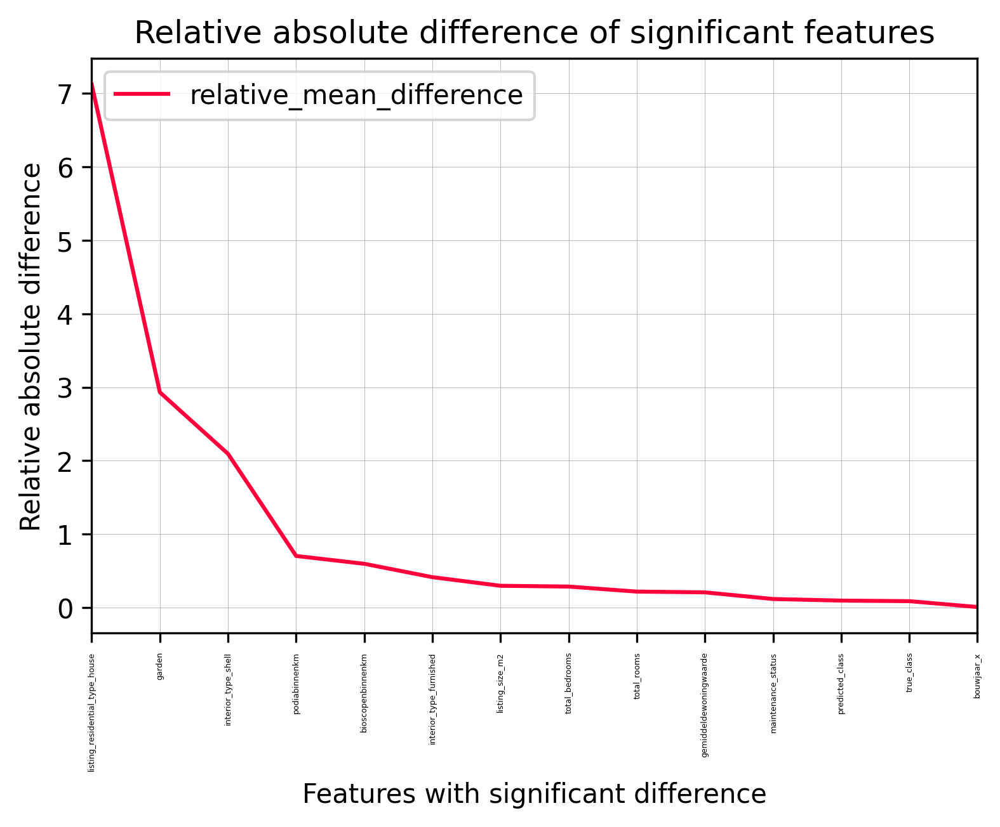

In [21]:
### ONLY FOR SIGNIFICANT DIFF FEATURES

df_parallel = df_sorted_sig.copy()
df_parallel.drop(['unscaled_discriminated','unscaled_remaining','difference','Welch T-statistic','p-value'],axis=1,inplace=True)

df_parallel_transpose = df_parallel.T
df_parallel_transpose['index'] = df_parallel_transpose.index
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(df_parallel_transpose.head())

# create parallel coordinate plot
def create_parallel_coord_plot(copy_research_transpose, title):
    disc_plot = parallel_coordinates(copy_research_transpose, 'index',color=('#ff003c'),axvlines=False)
    plt.xticks(rotation=90,fontsize=3)
    plt.legend(loc="upper left")
    plt.xlabel("Features with significant difference")
    plt.ylabel("Relative absolute difference")
    plt.grid(linewidth=0.2)
    plt.title(title)
    plt.show()

create_parallel_coord_plot(df_parallel_transpose, "Relative absolute difference of significant features")


,listing_residential_type_house,garden,interior_type_shell,podiabinnenkm,bioscopenbinnenkm,interior_type_furnished,errors,listing_size_m2,total_bedrooms,total_rooms,gemiddeldewoningwaarde,maintenance_status,predicted_class,true_class,bouwjaar_x,index
relative_mean_difference,7.118799,2.930972,2.093129,0.702484,0.596123,0.413726,0.358268,0.296493,0.285745,0.217345,0.207075,0.116384,0.094937,0.087211,0.00758,relative_mean_difference


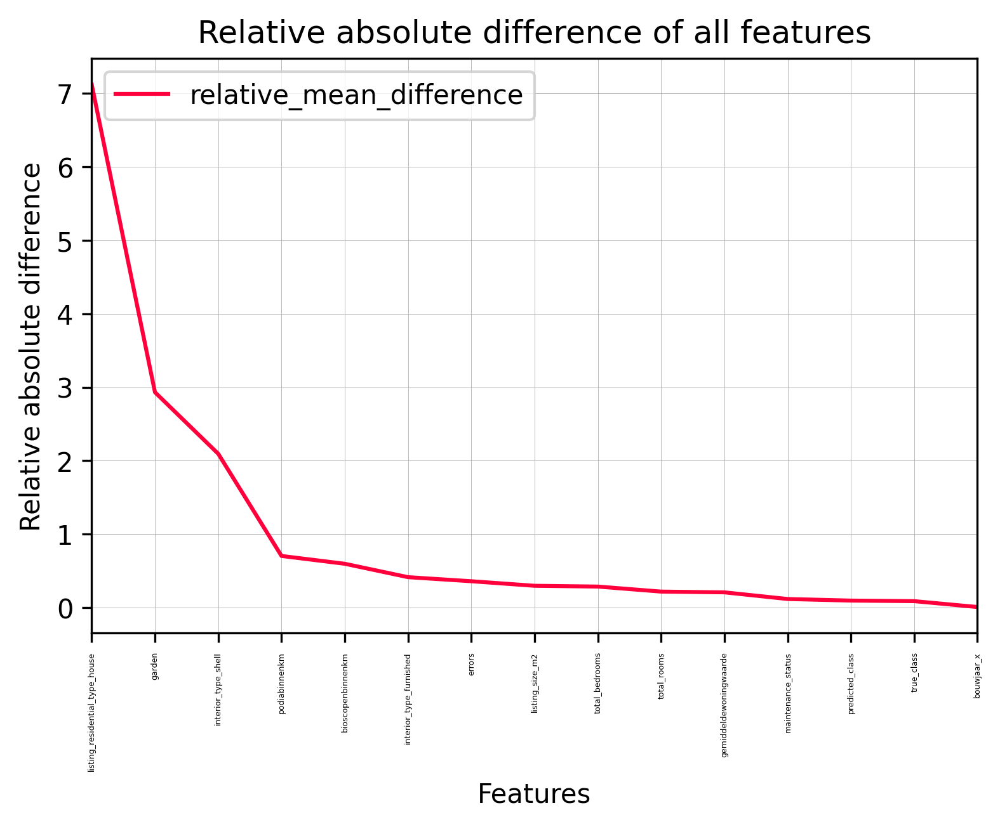

In [22]:
# creating df for parallel coordinate plot
df_parallel = mean_clusters.copy()
df_parallel.drop(['unscaled_discriminated','unscaled_remaining','difference','Welch T-statistic','p-value'],axis=1,inplace=True)

df_parallel_transpose = df_parallel.T
df_parallel_transpose['index'] = df_parallel_transpose.index
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(df_parallel_transpose.head())

# create parallel coordinate plot
def create_parallel_coord_plot(copy_research_transpose, title):
    disc_plot = parallel_coordinates(copy_research_transpose, 'index',color=('#ff003c'),axvlines=False)
    plt.xticks(rotation=90,fontsize=3)
    plt.legend(loc="upper left")
    plt.xlabel("Features")
    plt.ylabel("Relative absolute difference")
    plt.grid(linewidth=0.2)
    plt.title(title)
    plt.show()

create_parallel_coord_plot(df_parallel_transpose, "Relative absolute difference of all features")

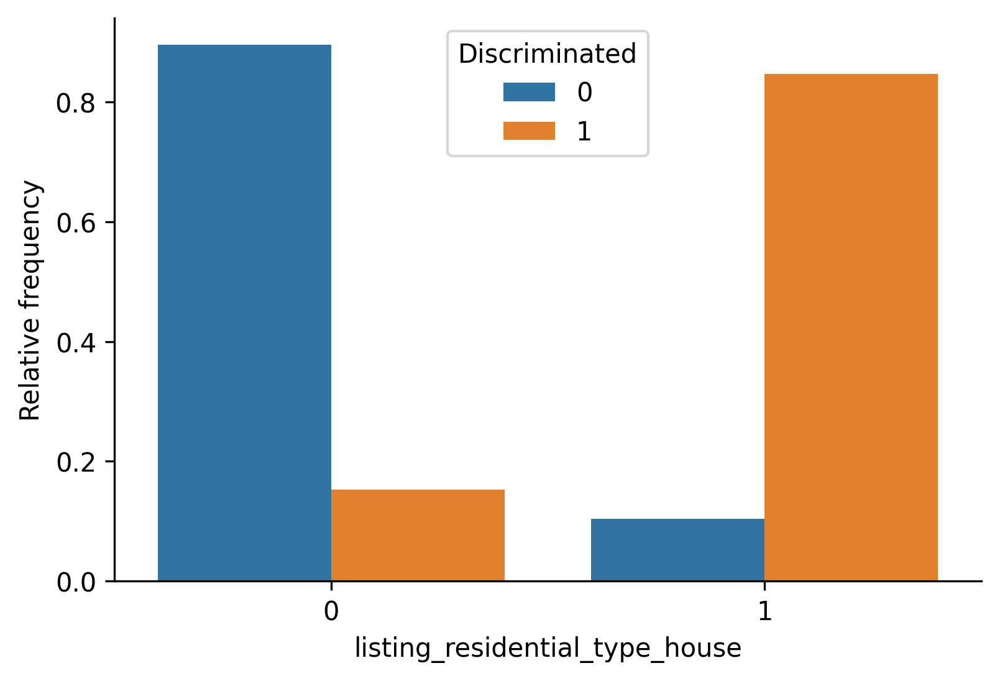

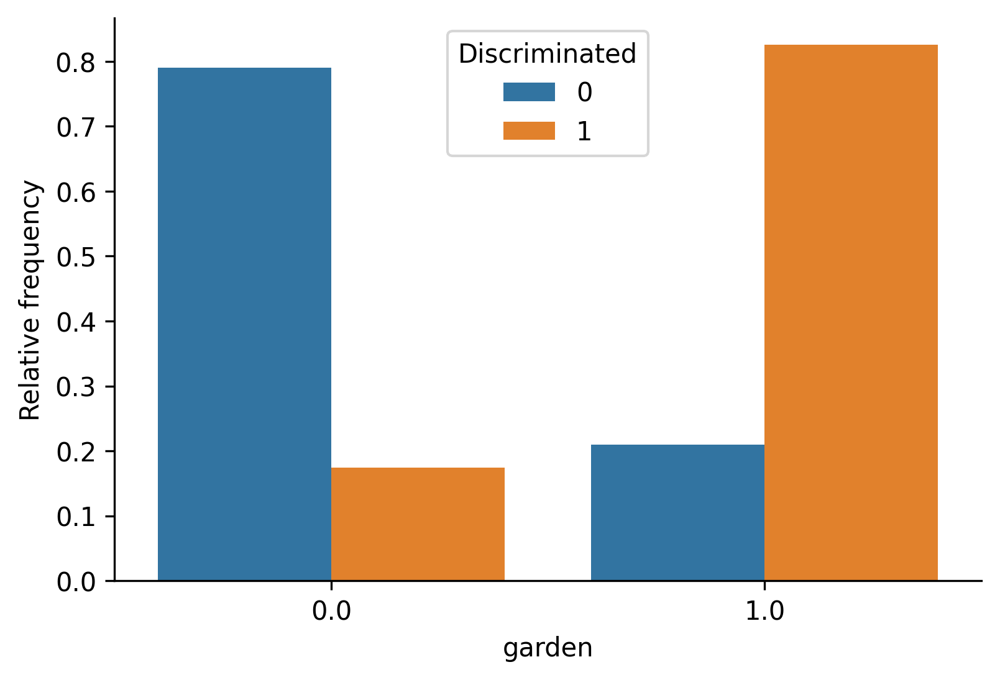

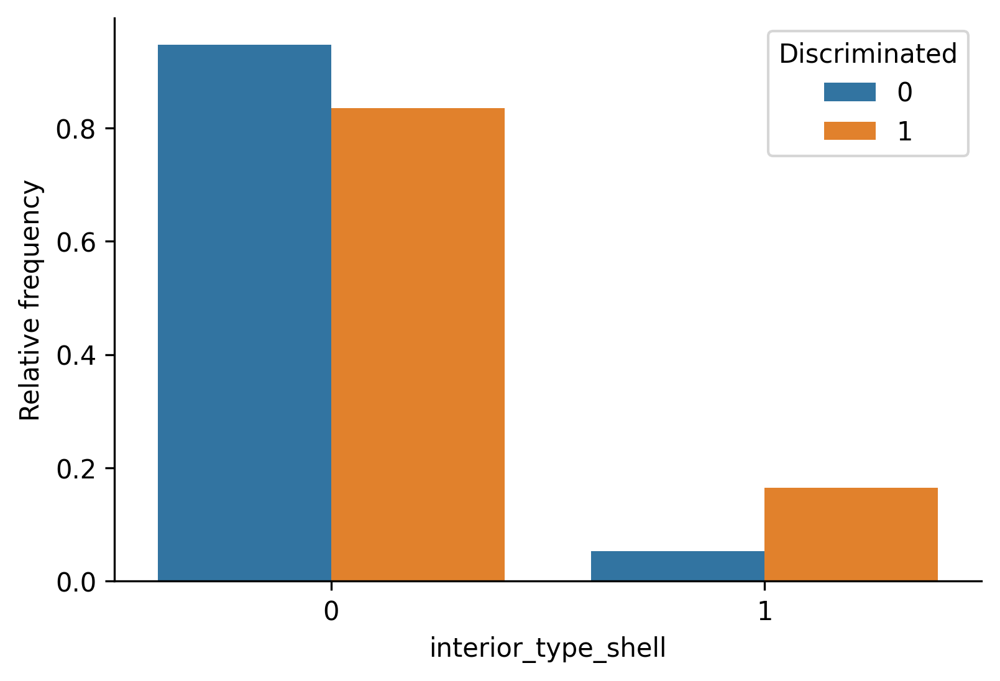

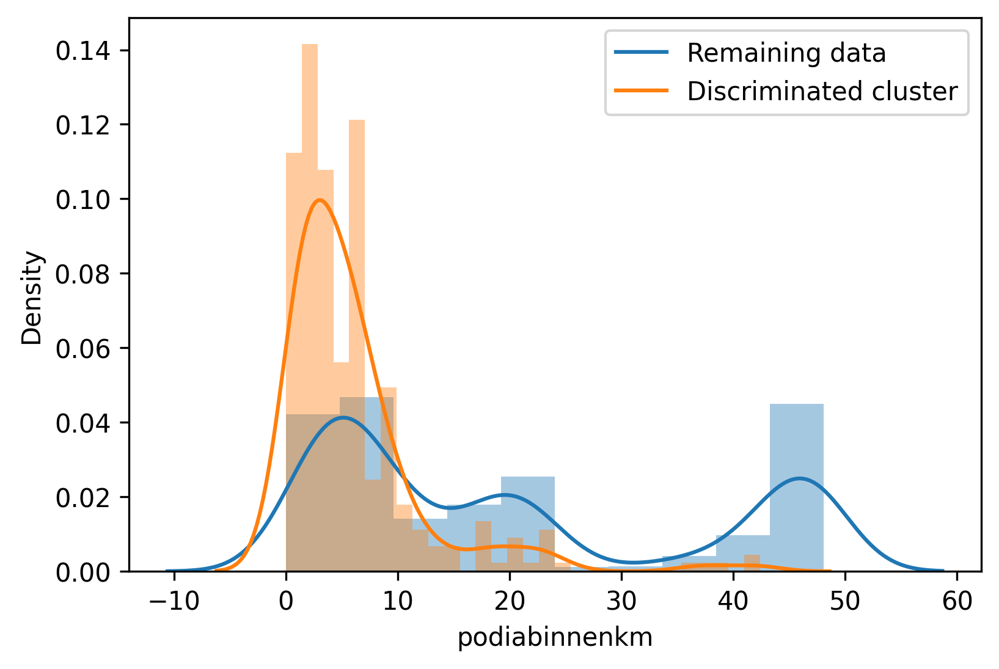

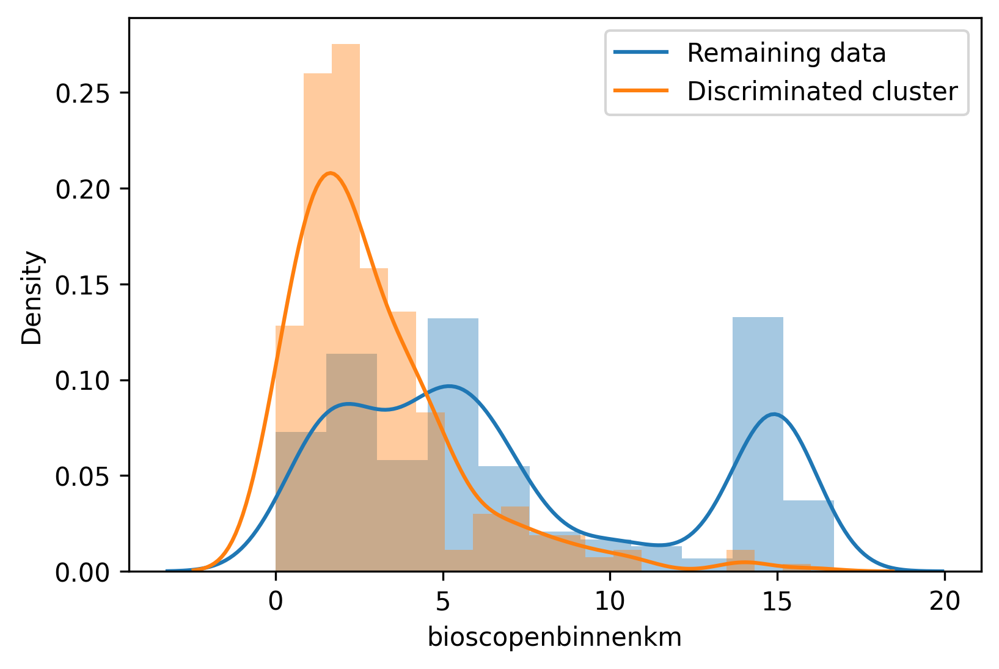

...

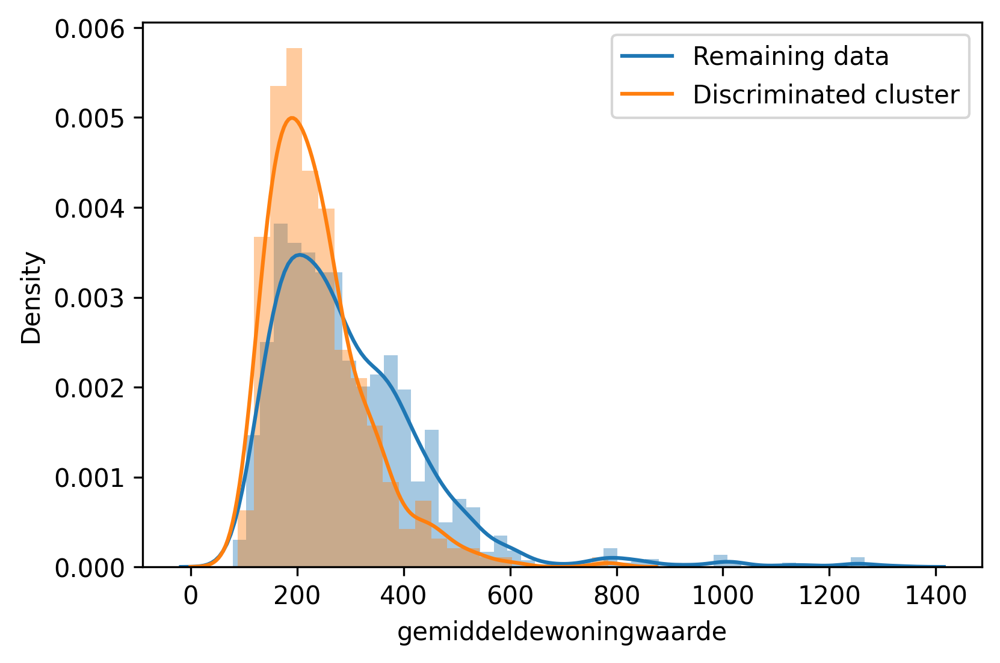

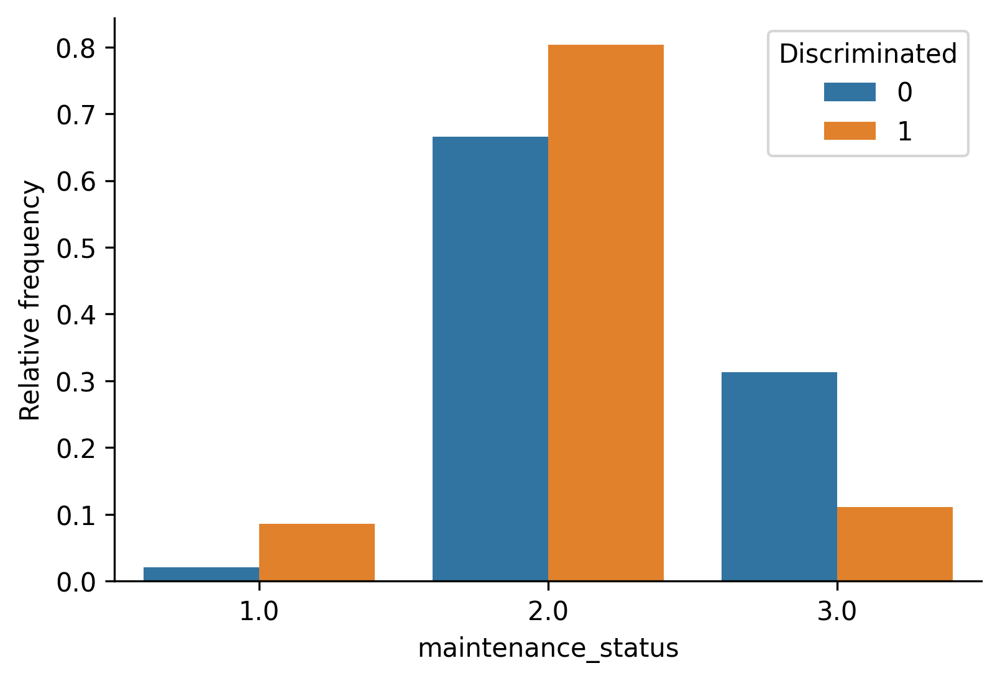

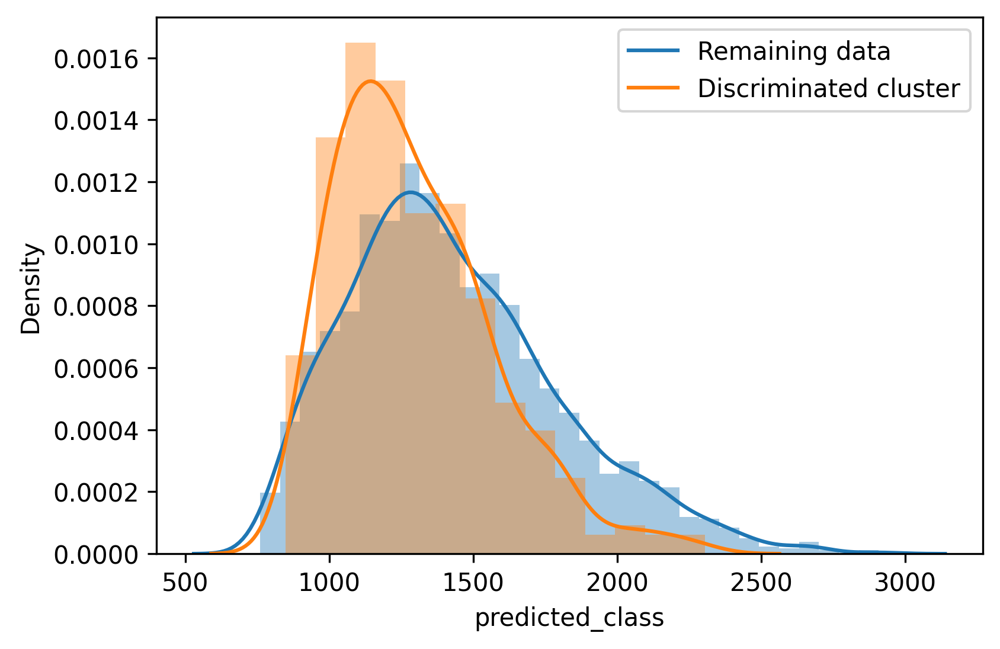

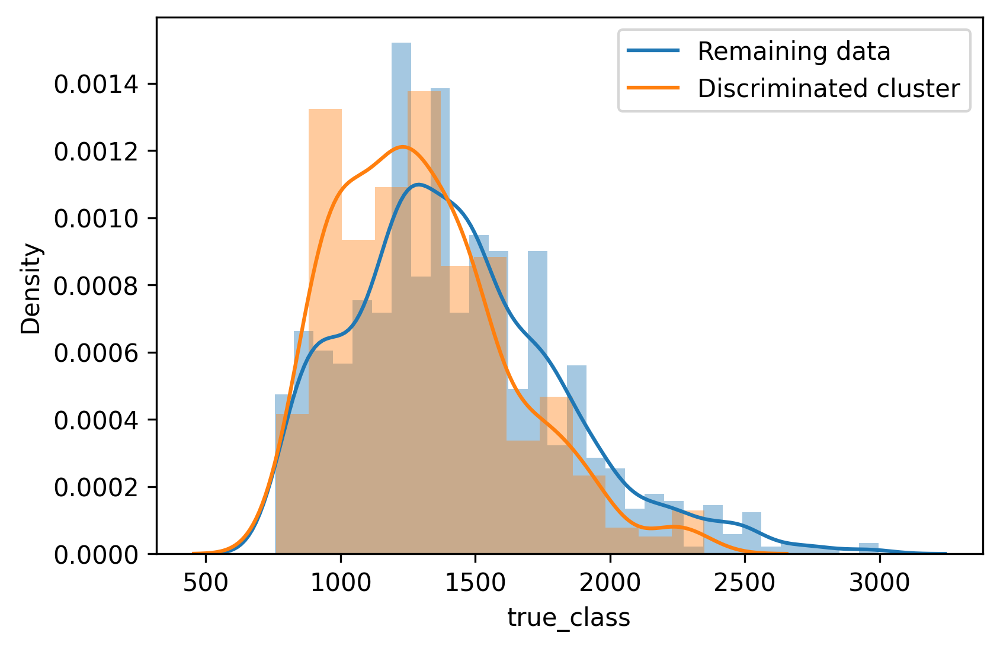

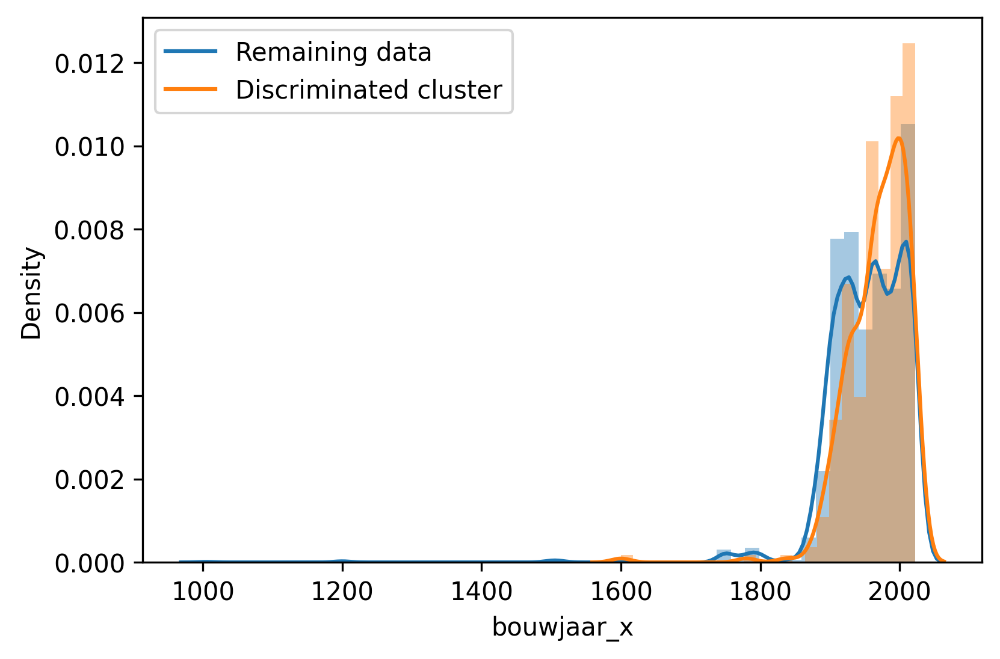

In [23]:
##### Plot distribution discriminated cluster vs remaining data

unscaled_discriminated['Discriminated'] = 1
unscaled_remaining['Discriminated'] = 0
unscaled_combined = pd.concat([unscaled_discriminated,unscaled_remaining])

pd.to_pickle(unscaled_combined, "unscaled_combined.pkl")

for col in mean_clusters.T.columns:
    if len(unscaled_remaining[col].unique()) > 15:
        fig, ax = plt.subplots()
        for a in [unscaled_remaining[col], unscaled_discriminated[col]]:
            sns.distplot(a, ax=ax)
            plt.legend(labels=["Remaining data","Discriminated cluster"])
        plt.show()
            
    # Quick fix to enter categorical
    if len(unscaled_remaining[col].unique())<= 15 and col !='Discriminated':
    
#######         For percentage of Discriminated data per category
#         fig, ax = plt.subplots()
#         sns.barplot(x=col,y='Discriminated',  data=unscaled_combined, ax=ax,color='#3b75af')
#         sns.despine(fig)
#         plt.show()

####### Difference in relative count, #Used plot https://stackoverflow.com/questions/57024583/countplot-with-relative-frequencies-or-density-curves
        fig, ax = plt.subplots()
        relative_count = (unscaled_combined.groupby(['Discriminated',col]).size() / 
                          unscaled_combined.groupby(['Discriminated']).size()).reset_index().rename({0:'Relative frequency'}, axis=1)
        sns.barplot(x=col, hue='Discriminated', y='Relative frequency', data=relative_count, ax=ax)
        sns.despine(fig)
#         plt.legend()
        plt.show()

        


In [24]:
# Rounded mean discriminated cluster
mean_dp = mean_clusters.drop(['predicted_class','true_class','errors'])
mean_dp['discriminated_median'] = unscaled_discriminated.median()
mean_dp['remaining_median'] = unscaled_remaining.median()
mean_dp = mean_dp.rename({'unscaled_discriminated': 'mean_discriminated', 'unscaled_remaining': 'mean_remaining'}, axis='columns')
mean_dp = mean_dp.drop(['difference','relative_mean_difference','Welch T-statistic','p-value'],axis=1).round()

display(mean_dp)

,mean_discriminated,mean_remaining,discriminated_median,remaining_median
listing_residential_type_house,1.0,0.0,1.0,0.0
garden,1.0,0.0,1.0,0.0
interior_type_shell,0.0,0.0,0.0,0.0
podiabinnenkm,6.0,20.0,4.0,14.0
bioscopenbinnenkm,3.0,7.0,2.0,6.0
interior_type_furnished,0.0,0.0,0.0,0.0
listing_size_m2,98.0,76.0,100.0,75.0
total_bedrooms,3.0,2.0,3.0,2.0
total_rooms,4.0,3.0,4.0,3.0
gemiddeldewoningwaarde,238.0,300.0,217.0,269.0


In [25]:
display(mean_dp[['mean_discriminated']].T)

,listing_residential_type_house,garden,interior_type_shell,podiabinnenkm,bioscopenbinnenkm,interior_type_furnished,listing_size_m2,total_bedrooms,total_rooms,gemiddeldewoningwaarde,maintenance_status,bouwjaar_x
mean_discriminated,1.0,1.0,0.0,6.0,3.0,0.0,98.0,3.0,4.0,238.0,2.0,1969.0


# XGB binary classifier

In [6]:
### Get train and test set

### Get from saved df
data_xgb = pd.read_pickle("unscaled_combined.pkl")
# data_xgb = unscaled_combined

data_xgb = data_xgb.drop(['predicted_class','true_class','errors'],axis=1)
data_xgb = data_xgb.sample(frac=1)

display(data_xgb)

,listing_size_m2,podiabinnenkm,gemiddeldewoningwaarde,interior_type_furnished,bioscopenbinnenkm,total_bedrooms,interior_type_shell,total_rooms,garden,bouwjaar_x,maintenance_status,listing_residential_type_house,Discriminated
3111,70.0,5.0,1067.0,0,5.0,2.0,0,3.0,0.0,1905.0,3.0,0,0
2843,85.0,11.7,164.0,0,10.0,2.0,0,3.0,0.0,2008.0,2.0,0,0
12426,111.0,48.0,395.0,1,15.0,3.0,0,4.0,0.0,1883.0,3.0,0,0
2741,69.0,48.0,408.0,1,15.0,2.0,0,3.0,0.0,1906.0,3.0,0,0
2212,80.0,24.0,305.0,1,6.0,2.0,0,3.0,0.0,1954.0,2.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7096,40.0,47.1,446.0,0,14.3,1.0,0,3.0,0.0,1890.0,2.0,0,0
6125,73.0,10.0,178.0,1,8.5,2.0,0,3.0,1.0,1984.0,2.0,0,0
12387,140.0,9.0,285.0,1,4.0,4.0,0,5.0,0.0,1931.0,2.0,1,0
2400,40.0,23.0,143.0,0,7.0,1.0,0,2.0,0.0,1880.0,2.0,0,0


In [7]:
############# Binary classification on clustering results

import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve


x = data_xgb.drop('Discriminated',axis=1)   
y = data_xgb['Discriminated']
X_xgb_train, X_xgb_test, y_xgb_train, y_xgb_test = train_test_split(x.to_numpy(), y.to_numpy(),test_size=0.1)
X_xgb_train, X_xgb_val, y_xgb_train, y_xgb_val = train_test_split(X_xgb_train, y_xgb_train,test_size=0.1)


dtrain = xgb.DMatrix(X_xgb_train, label=y_xgb_train)
dtest = xgb.DMatrix(X_xgb_test, label=y_xgb_test)
dval = xgb.DMatrix(X_xgb_val, label=y_xgb_val)


# print(len(X_xgb_train),len(X_xgb_val),len(X_xgb_test))

In [8]:
param = {'max_depth': 2, 'eta': 1, 'objective': 'binary:logistic'}
# param['nthread'] = 4
param['eval_metric'] = 'auc'
evallist = [(dval, 'eval'), (dtrain, 'train')]

num_round = 5
bst = xgb.train(param, dtrain, num_round, evallist, early_stopping_rounds=10)

#bst.save_model('test_01.model')
pkl.dump(bst, open('test_01.pkl', 'wb'))


[15:14:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6 extra nodes, 0 pruned nodes, max_depth=2
[0]	eval-auc:0.961143	train-auc:0.950956
Multiple eval metrics have been passed: 'train-auc' will be used for early stopping.

Will train until train-auc hasn't improved in 10 rounds.
[15:14:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 4 extra nodes, 0 pruned nodes, max_depth=2
[1]	eval-auc:0.977248	train-auc:0.978621
[15:14:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6 extra nodes, 0 pruned nodes, max_depth=2
[2]	eval-auc:0.990954	train-auc:0.989491
[15:14:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6 extra nodes, 0 pruned nodes, max_depth=2
[3]	eval-auc:0.992599	train-auc:0.993677
[15:14:06] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 6 extra nodes, 0 pruned nodes, max_depth=2
[4]	eval-auc:0.996299	train-auc:0.995072


In [9]:
##### LOAD MODEL
# bst = xgb.Booster({'nthread': 4})  # init model
# bst.load_model('test_01.model')  # load data
bst = pkl.load(open('test_01.pkl', 'rb'))


In [10]:
ypred = bst.predict(dtest)
bin_predictions = np.around(ypred, decimals=0)
f1 = metrics.f1_score(y_xgb_test, bin_predictions, average='binary')
acc = metrics.accuracy_score(y_xgb_test, bin_predictions)
print('Accuracy of {}'.format(round(acc,3)))
print('F1 score of {}'.format(round(f1,3)))

Accuracy of 0.952
F1 score of 0.774


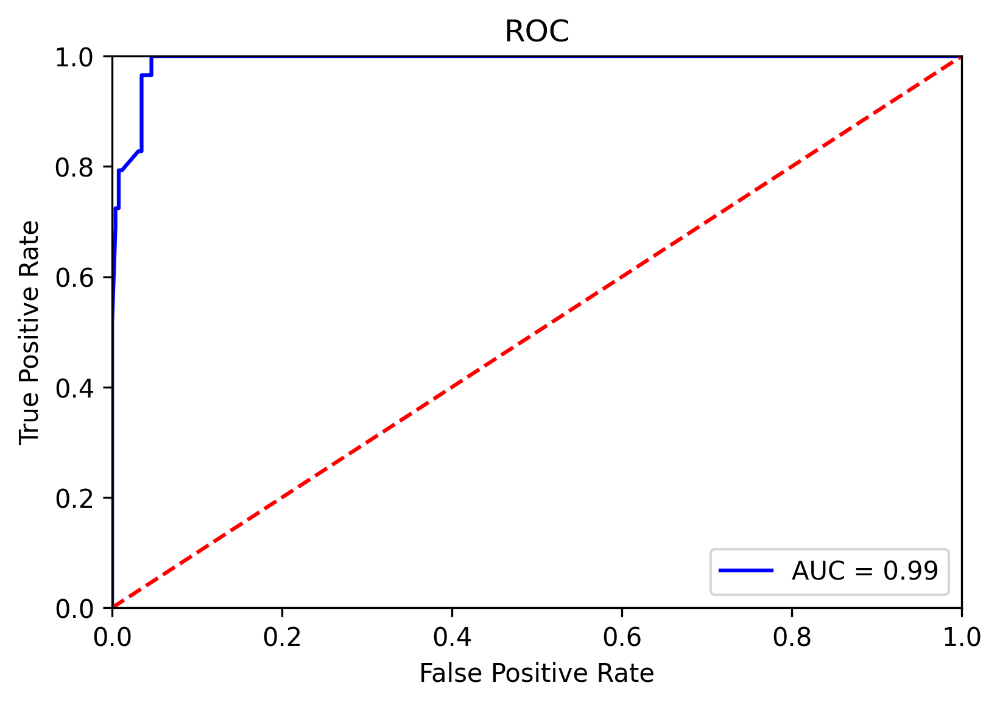

In [11]:
##### Plot ROC of XGBoost model

fpr, tpr, threshold = metrics.roc_curve(y_xgb_test, ypred)
roc_auc = metrics.auc(fpr, tpr)
plt.title('ROC')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

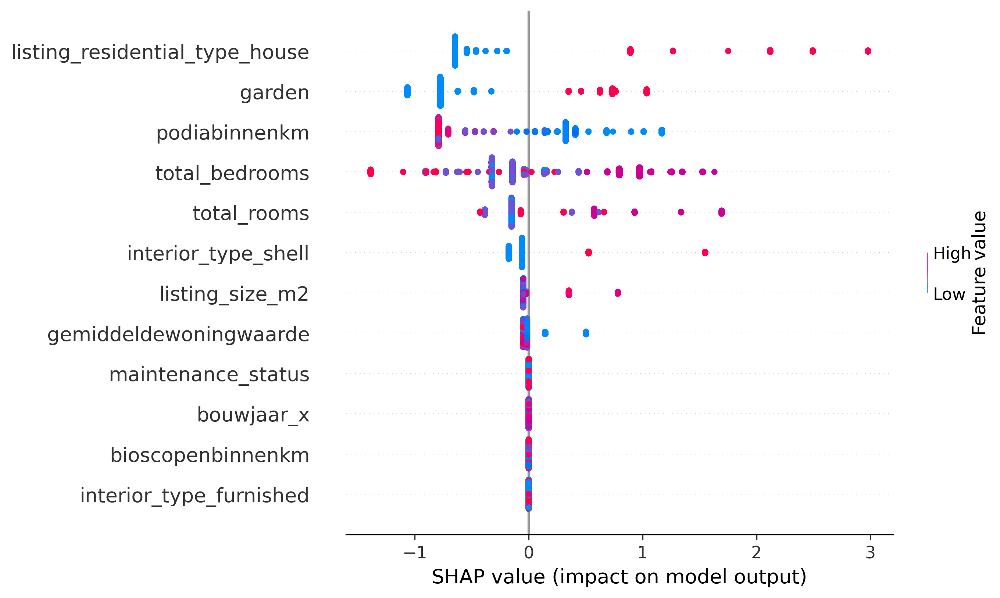

In [13]:
### SHAP on XGBoost segment predictor

shap.initjs()

explainer = shap.TreeExplainer(bst)
shap_values = explainer.shap_values(x)
pkl.dump(shap_values, open('shap_values.pkl', 'wb'))

shap.summary_plot(shap_values, features=x, feature_names=x.columns)
#shap.summary_plot(shap_values, features=x, feature_names=x.columns, plot_type='bar')

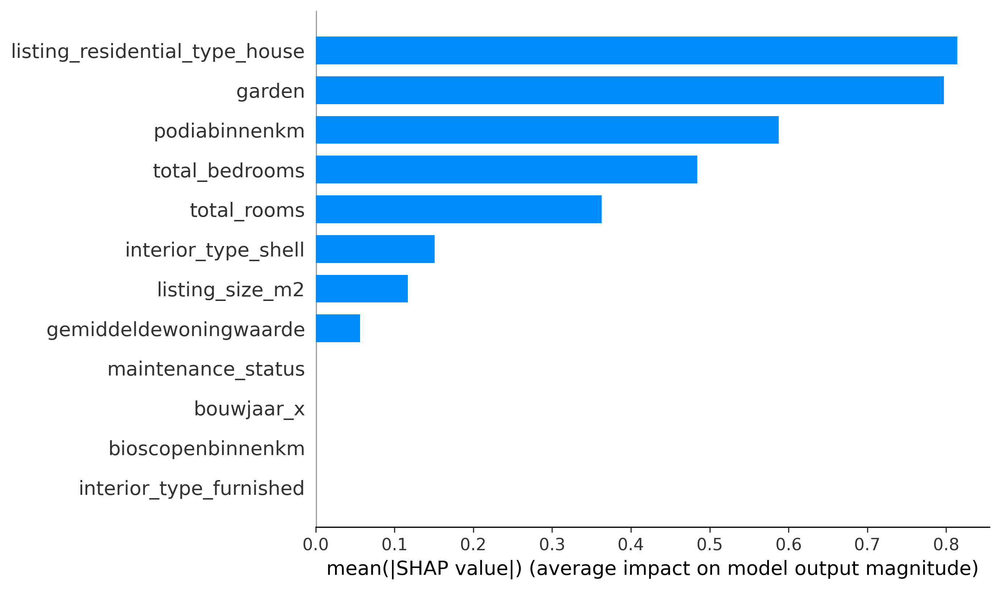

In [14]:
shap.summary_plot(shap_values, features=x, feature_names=x.columns, plot_type='bar')

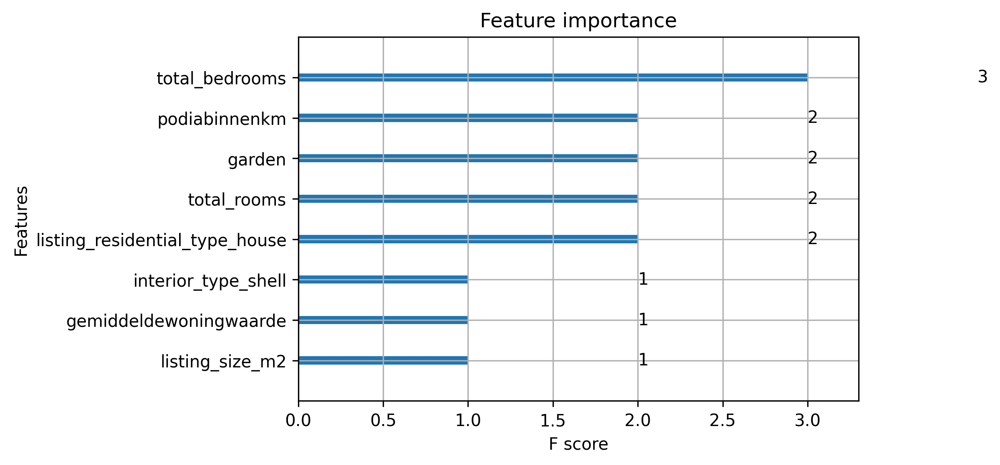

In [15]:
##### Plot feature importance of XGBoost model for discrimination prediction

dict_features = dict(enumerate(data_xgb.columns))
axsub = xgb.plot_importance(bst,max_num_features=None)
Text_yticklabels = list(axsub.get_yticklabels())
lst_yticklabels = [ Text_yticklabels[i].get_text().lstrip('f') for i in range(len(Text_yticklabels))]
lst_yticklabels = [ dict_features[int(i)] for i in lst_yticklabels]
axsub.set_yticklabels(lst_yticklabels)
plt.show()

In [16]:
###### Ter vergelijking de volgorde van features op basis van grootste verschil van HBAC uitkomst:
for col in mean_clusters.T:
    print(col)

NameError: name 'mean_clusters' is not defined

# Manual error analyis



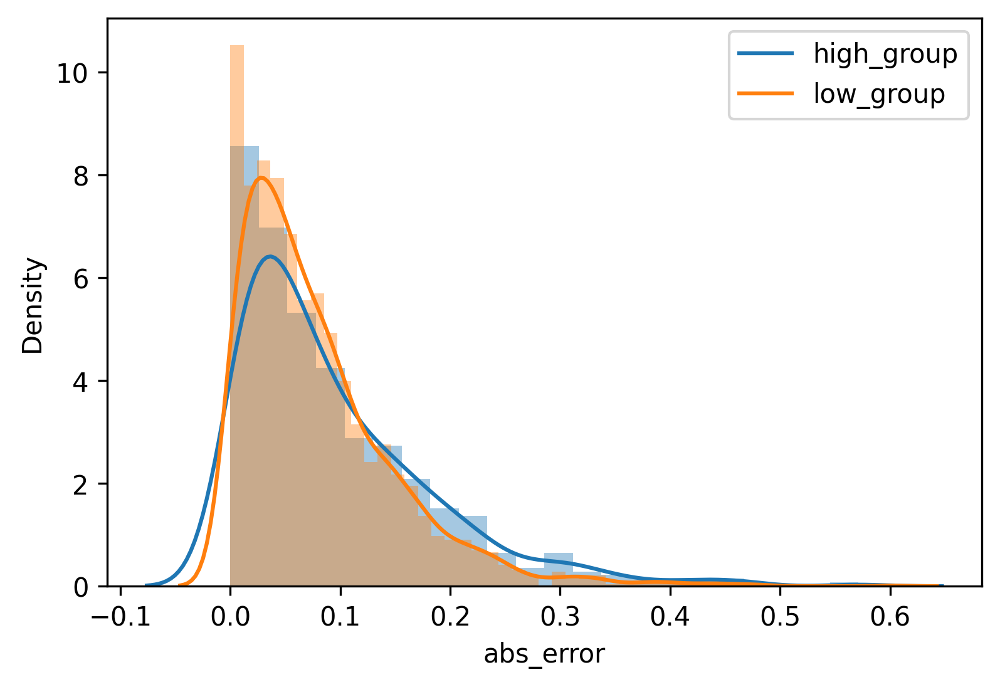

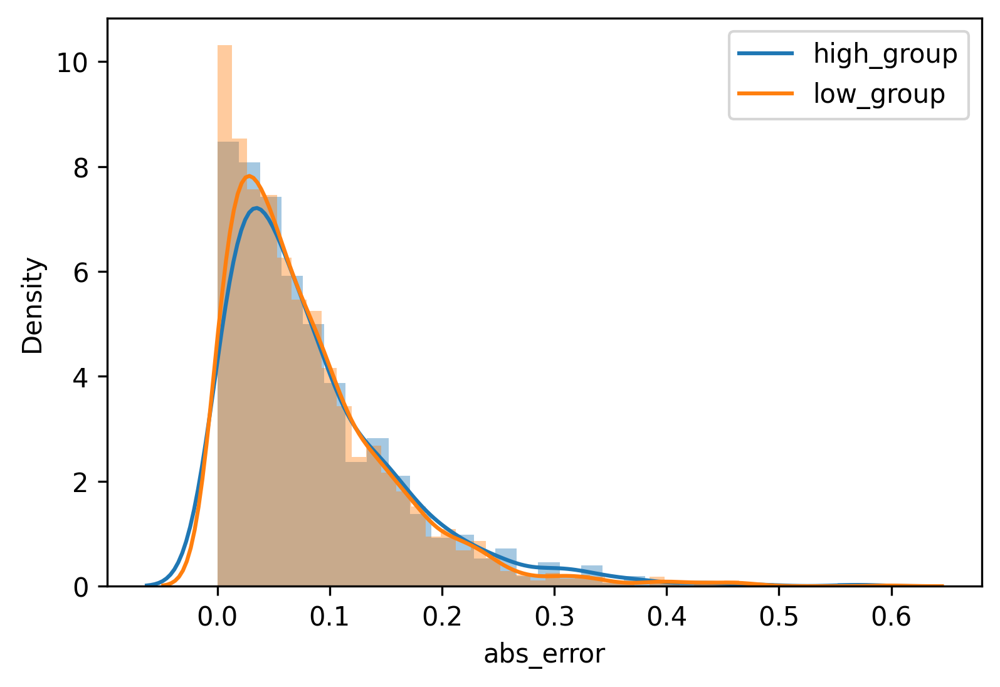

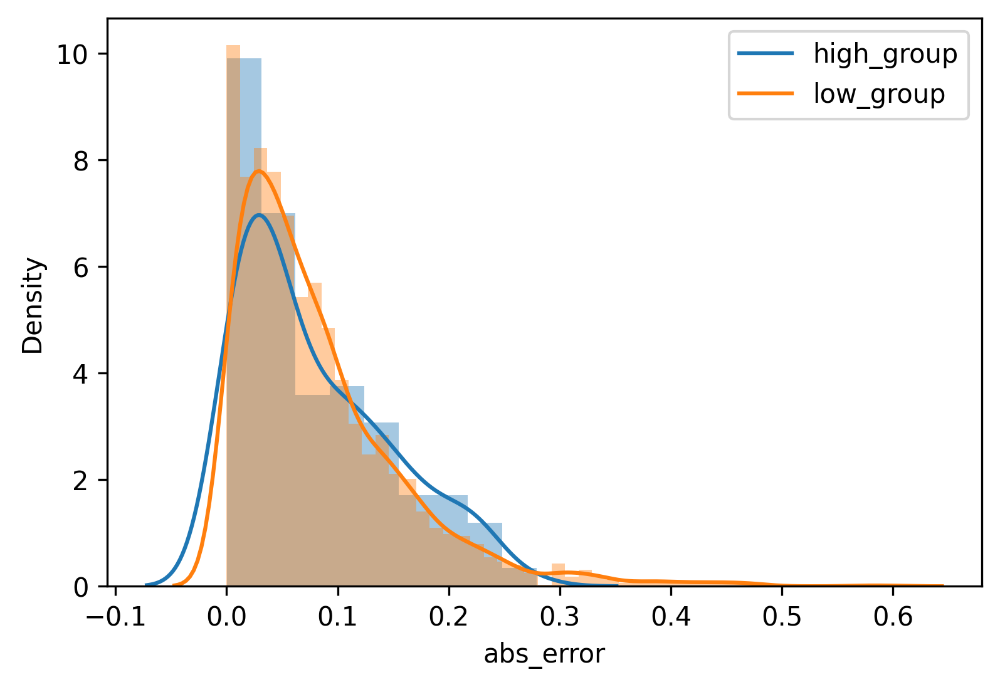

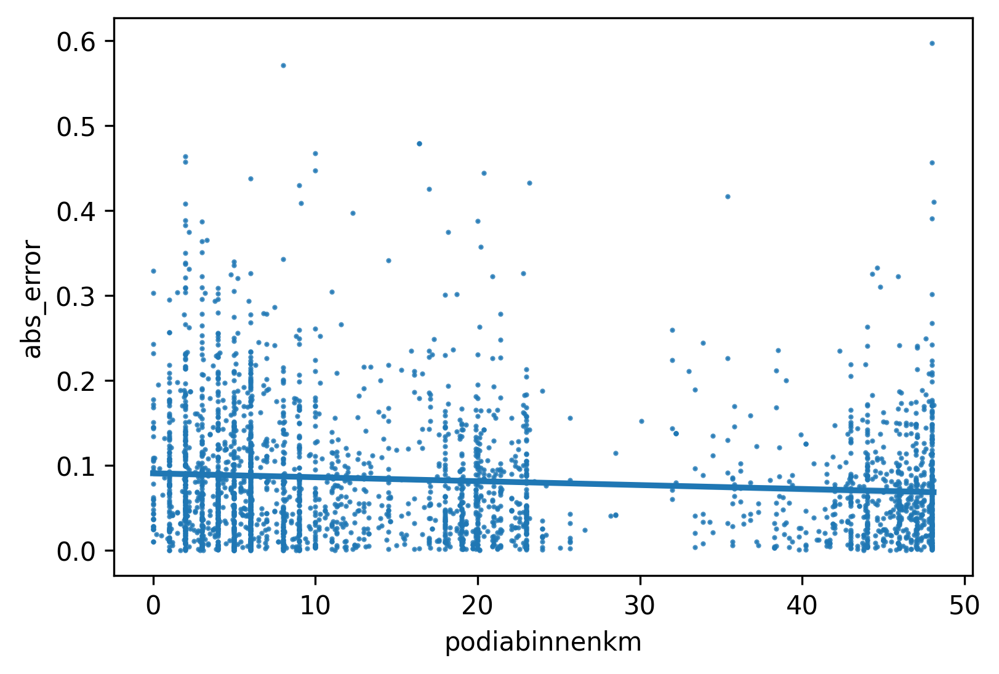

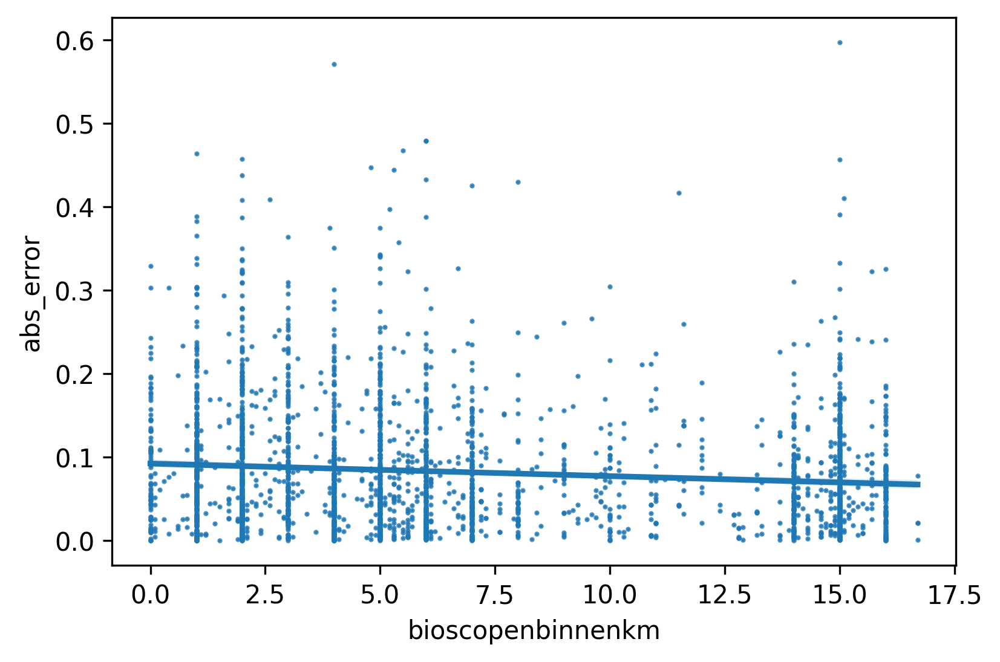

...

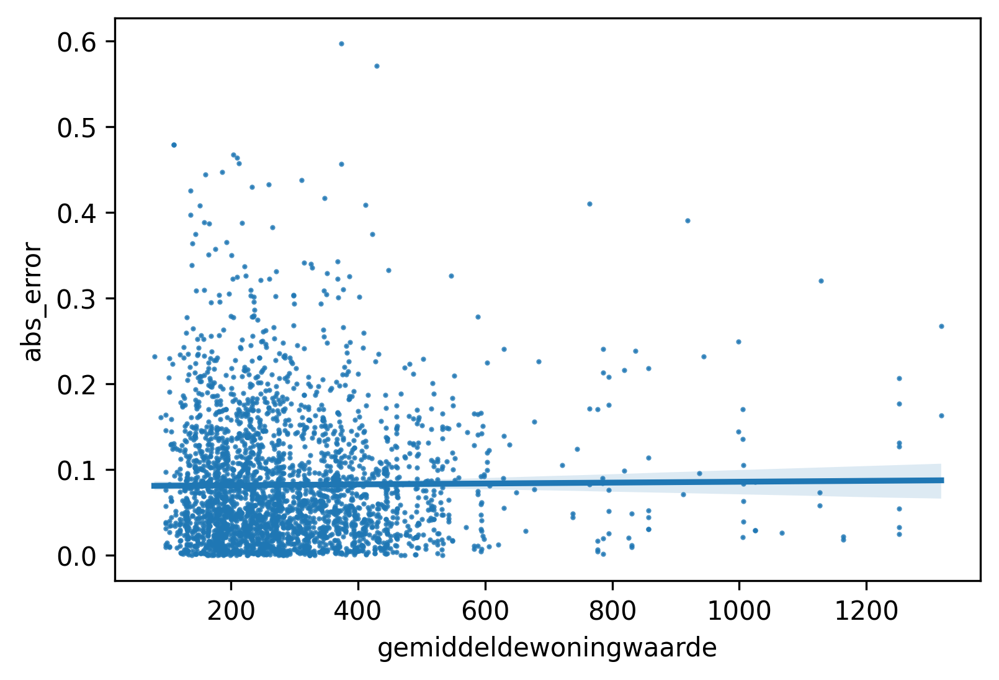

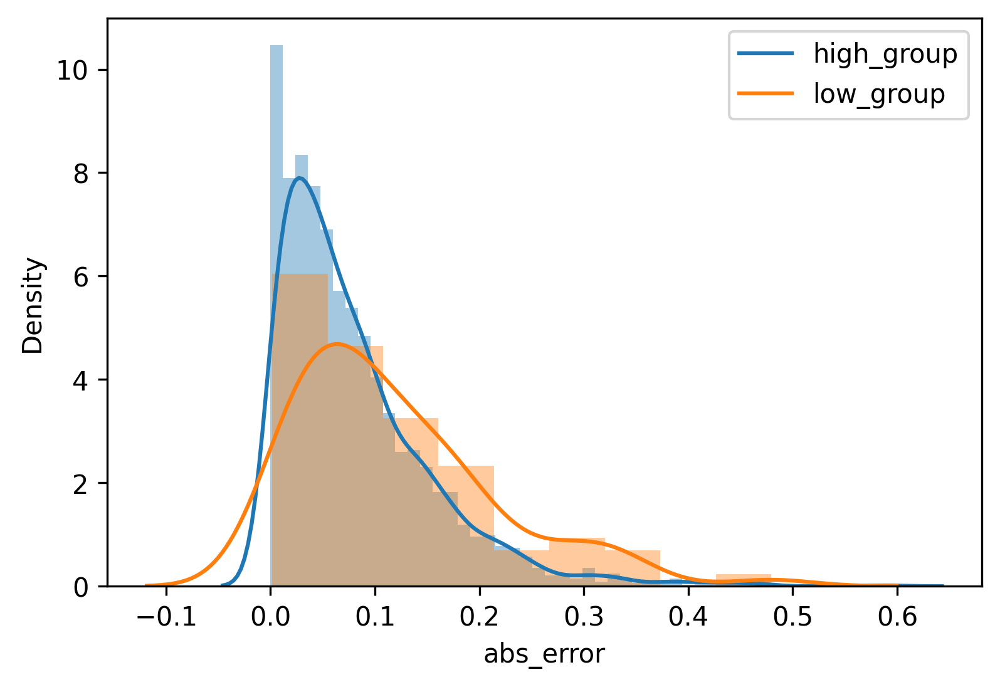

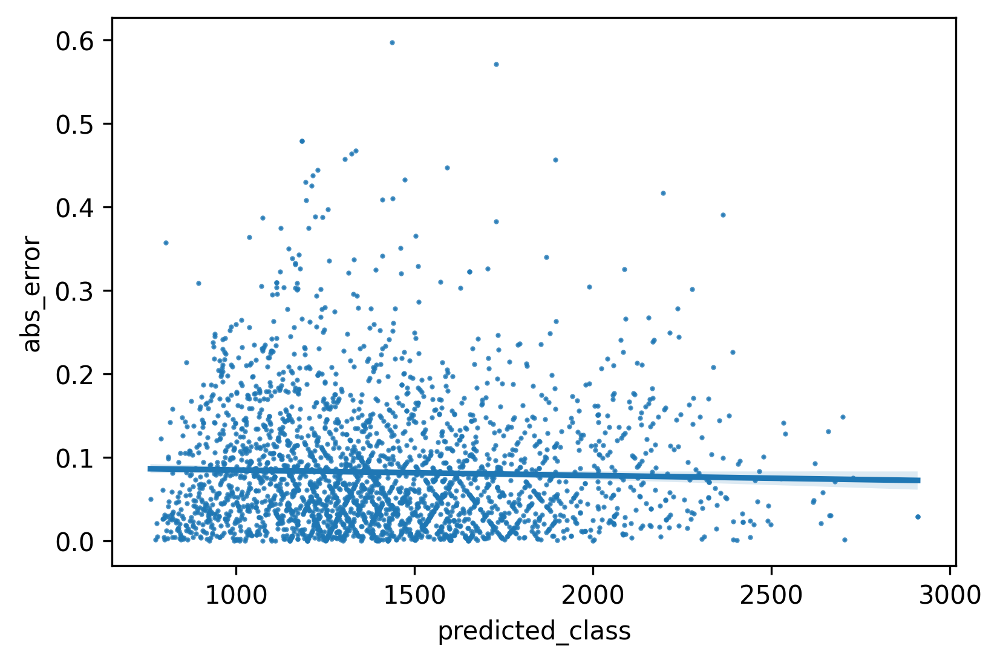

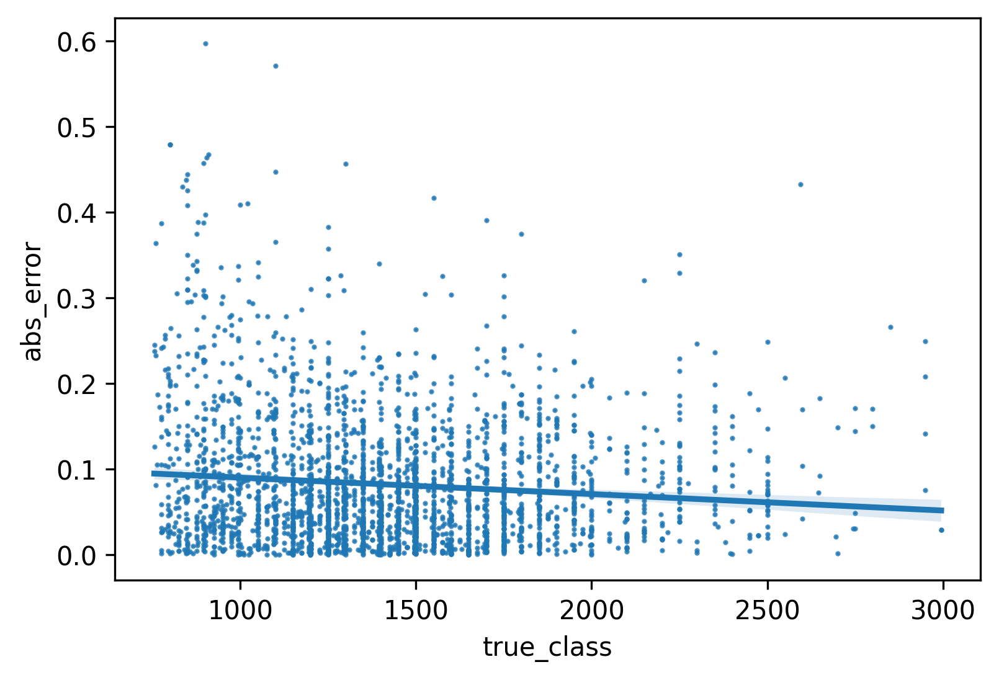

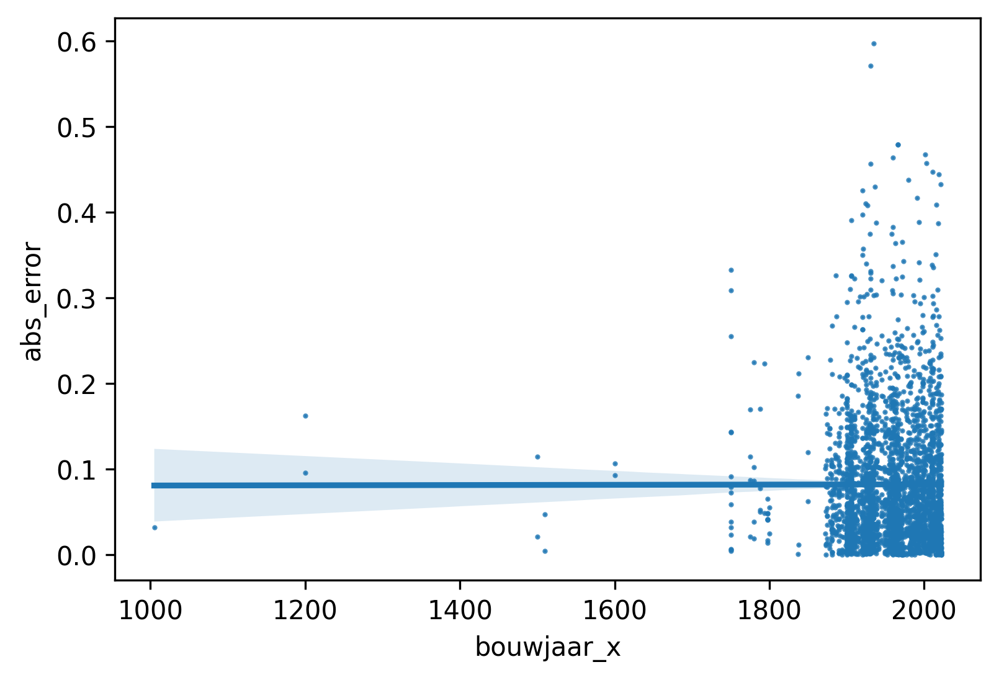

In [115]:
### Initial dataframe   
unscaled_combined = pd.read_pickle('unscaled_combined.pkl')
unscaled_combined['abs_error'] = abs(unscaled_combined['errors'])
manual_analysis = pd.DataFrame()
statistic = []
p = []
features = []
means_high = []
means_low = []

for col in mean_clusters.T.columns:
    
    ######## Continuous features: Regressie plot en Pearson's r correlation

    if len(unscaled_combined[col].unique()) > 15 and col !='errors':

        pearson_corr = stats.pearsonr(unscaled_combined[col], unscaled_combined['abs_error'])
        #print('Correlation between {} and abs relative error (r, p): {}'.format(col, pearson_corr,3),'\n')
        statistic.append(pearson_corr[0])
        p.append(pearson_corr[1])
        features.append(col)
        means_high.append(None)
        means_low.append(None)
        fig, ax = plt.subplots()
        sns.regplot(unscaled_combined[col], unscaled_combined['abs_error'], ax=ax,scatter_kws={'s':1})
    
    ####### Categorical features: Vergelijken van abs error, r2 en mse van 2 groepen. + Boxplots.
    
    if len(unscaled_remaining[col].unique())<= 15 and col !='Discriminated':
        
        ###### Devide into 2 groups, eg 4+ bedrooms vs 4- bedrooms, total_rooms 3.0+ vs total_rooms 3.0-
        
        half = round(len(unscaled_combined[col].unique())/2 , 0)        
        high_group = '{} {}+'.format(col, half)
        low_group = '{} {}-'.format(col, half)
        unscaled_combined[high_group] = unscaled_combined[col] >= half
        unscaled_combined[low_group] = unscaled_combined[col] < half                             
        welch_test = stats.ttest_ind(unscaled_combined[unscaled_combined[high_group]==True]['abs_error'], 
                                     unscaled_combined[unscaled_combined[low_group]==True]['abs_error'], 
                                     equal_var=False)
        means_high.append(np.mean(unscaled_combined[unscaled_combined[high_group]==True]['abs_error']))
        means_low.append(np.mean(unscaled_combined[unscaled_combined[low_group]==True]['abs_error']))
               
        fig, ax = plt.subplots()
        for group in [high_group, low_group]:         
            mse = metrics.mean_squared_error(unscaled_combined[unscaled_combined[group]==True][['true_class']],
                              unscaled_combined[unscaled_combined[group]==True][['predicted_class']])
            r2 = hbac_kmeans.accuracy(unscaled_combined[unscaled_combined[group]==True])                        
#             print('For {}'.format(group) ) 
#             print('Mean abs relative error: ', np.mean(unscaled_combined[unscaled_combined[group]==True]['abs_error']))
#             print('R2: ', round(r2,3))
#             print('MSE: ', round(mse,3))
            if group == high_group:
                statistic.append(welch_test[0])
                p.append(welch_test[1])
                features.append('{} vs {}'.format(high_group, low_group))
#         print('Welch T test for difference in abs relative error distribution', welch_test)
#         print('\n')


###### FOR boxplots
#         fig, ax = plt.subplots()
#         sns.boxplot(x=high_group, y="abs_error", hue=high_group, data=unscaled_combined,ax=ax)#, palette="PRGn")


##### For dist plots
            sns.distplot(unscaled_combined[unscaled_combined[group]==True]['abs_error'], ax=ax)
            plt.legend(labels=["high_group","low_group"])
        plt.show()

        
manual_analysis['statistic'] = statistic
manual_analysis['p-value'] = p
manual_analysis['feature'] = features
manual_analysis['mean abs relative error group high'] = means_high
manual_analysis['mean abs relative error group low'] = means_low
manual_analysis['difference'] = manual_analysis['mean abs relative error group high'] - manual_analysis['mean abs relative error group low']


In [128]:
display(manual_analysis.sort_values(by='difference',ascending=False))

,statistic,p-value,feature,mean abs relative error group high,mean abs relative error group low,difference
0,3.898148,1.062378e-04,listing_residential_type_house 1.0+ vs listing...,0.095179,0.079130,0.016048
7,1.569697,1.173291e-01,total_bedrooms 2.0+ vs total_bedrooms 2.0-,0.082771,0.076149,0.006622
8,1.462328,1.445058e-01,total_rooms 3.0+ vs total_rooms 3.0-,0.082723,0.076495,0.006228
1,1.690907,9.108453e-02,garden 1.0+ vs garden 1.0-,0.086075,0.080588,0.005487
5,-0.492853,6.221763e-01,interior_type_furnished 1.0+ vs interior_type_...,0.081099,0.082564,-0.001466
2,-0.431275,6.666876e-01,interior_type_shell 1.0+ vs interior_type_shel...,0.080019,0.082256,-0.002237
10,-3.491978,7.718642e-04,maintenance_status 2.0+ vs maintenance_status ...,0.081051,0.118732,-0.037682
3,-0.102308,3.704293e-08,podiabinnenkm,NaN,NaN,NaN
4,-0.102540,3.449157e-08,bioscopenbinnenkm,NaN,NaN,NaN
6,0.089237,1.601668e-06,listing_size_m2,NaN,NaN,NaN


# Effect of amount of features

In [3]:
# Get completed dataset with all features, no missing values
df = pd.read_pickle('completed_dataset.pkl')

In [4]:
## Get list of most important features according to SHAP

sorted_features = pkl.load(open('sorted_features.pkl', 'rb'))


In [5]:
# ## Select only features that are in dataset

# for i in sorted_features[:]:
#     if i not in df.columns:
#         sorted_features.remove(i)

#sorted_features

In [170]:
### Add 1 features to HBAC analysis, untill 30 features. Calculate Silhouette score and max negative bias found. 
#### Avg over 10 runs

biases = []
bias_std = []
sillh_list = []
std_sillh = []
number_of_clusters = []
std_number_of_clusters = []
# DB_list = []
# CH_list = []
FEATURE_AMOUNT = 30

for number_of_features in range(1,FEATURE_AMOUNT):
    
    feature_set = sorted_features[:number_of_features]
    feature_set.extend(['predicted_class','true_class', 'errors'])

    avg_bias = []
    avg_sillh = []
    avg_number_of_clusters = []
    
    # Run experiment 10 times with this feature set
    for i in range(10):
        results = hbac_kmeans.hbac_kmeans(df[feature_set], 0.8, show_plot=False)
        c, max_neg_bias = hbac_kmeans.get_max_bias_cluster(results)
        avg_bias.append(max_neg_bias)
        avg_sillh.append(metrics.silhouette_score( results.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class', 'errors'], axis=1),
                                              results['clusters']))
        avg_number_of_clusters.append(len(results['clusters'].unique()) )
#         DB_score = metrics.davies_bouldin_score(results.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class', 'errors'], axis=1),
#                                         results['clusters'])
#         CH_index = metrics.calinski_harabasz_score(results.drop(['clusters', 'new_clusters', 'predicted_class', 'true_class', 'errors'], axis=1),
#                                         results['clusters'])
        
    biases.append(mean(avg_bias))
    bias_std.append(np.std(avg_bias))
    sillh_list.append(mean(avg_sillh))
    std_sillh.append(np.std(avg_sillh))
    number_of_clusters.append(mean(avg_number_of_clusters))
    std_number_of_clusters.append(np.std(avg_number_of_clusters))
    

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.03524258559190996
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -0.11879896724370764
--> Cluster with the highest variance: 1
max discriminating bias is: -0.11216390530108256
This is the random cluster we have picked: 1
max discriminating bias is: -0.11221016943845086
This is the random cluster we have picked: 1
max discriminating bias is: -0.11221016943845086
This is the random cluster we have picked: 1
max discriminating bias is: -0.11221016943845086
This is the random cluster we have picked: 0
max discriminating bias is: -0.17469601200623142
--> Cluster with the highest variance: 1
max discriminating bias is: -0.11221016943845086
This is the random cluster we have picked: 0
max discriminating bias is: -0.0375008434177162
This is the random cluster we have picked: 1
max discriminating bias is: -0.11221016943845086
This is the random cluster we h

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.03524258559190996
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -0.11879896724370764
--> Cluster with the highest variance: 1
max discriminating bias is: -0.11216390530108256
This is the random cluster we have picked: 1
max discriminating bias is: -0.11221016943845086
This is the random cluster we have picked: 1
max discriminating bias is: -0.11216390530108256
This is the random cluster we have picked: 2
max discriminating bias is: -0.13640317889541453
--> Cluster with the highest variance: 1
max discriminating bias is: -0.11300027818678848
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -1.621861331364323
This is the random cluster we have picked: 1
max discriminating bias is: -0.11216390530108256
This is the random cluster we have picked: 4
This is the random cluster we have p

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.03524258559190996
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -0.11879896724370764
--> Cluster with the highest variance: 1
max discriminating bias is: -0.11216390530108256
This is the random cluster we have picked: 1
max discriminating bias is: -0.11221016943845086
This is the random cluster we have picked: 1
max discriminating bias is: -0.11221016943845086
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.13640317889541453
--> Cluster with the highest variance: 1
max discriminating bias is: -0.11300027818678848
This is the random cluster we have picked: 1
max discriminating bias is: -0.11221016943845086
This is the random cluster we have picked: 0
max discriminating bias is: -1.621861331364323
This is the random cluster we have picked: 2
max discriminating bias is: -0.18382

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.03524258559190996
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -0.11879896724370764
--> Cluster with the highest variance: 0
max discriminating bias is: -0.11300027818678848
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.17469601200623142
--> Cluster with the highest variance: 0
max discriminating bias is: -0.11216390530108256
This is the random cluster we have picked: 0
max discriminating bias is: -0.11221016943845086
This is the random cluster we have picked: 2
max discriminating bias is: -0.13640317889541453
This is the random cluster we have picked: 1
This is the random cluster we have picked: 0
max discriminating bias is: -0.11221016943845086
This is the random cluster we have picked: 1
This is the random cluster we have picked: 3
max discriminating bias is: -0.0375008

max discriminating bias is: -0.10055843898990191
This is the random cluster we have picked: 1
MAX_ITER
Variance list  [0.00012525258156546342, 0.0019043955421585036, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032, 0.01020831558872032]
2 has bias -0.09511986361469338
1 has bias 0.01119162997804446
3 has bias 0.0028525485967508812
0 has bias -0.23944987596645428
cluster with the highest discriminating bias: 0
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.009689477359319687
--> Cluster with

max discriminating bias is: -0.10059526636338001
This is the random cluster we have picked: 1
max discriminating bias is: -0.10059526636338001
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.11594329802741599
This is the random cluster we have picked: 0
max discriminating bias is: -0.2631869932859403
This is the random cluster we have picked: 2
max discriminating bias is: -0.11907247881811955
This is the random cluster we have picked: 5
This is the random cluster we have picked: 0
max discriminating bias is: -0.2631869932859403
This is the random cluster we have picked: 0
max discriminating bias is: -0.2631869932859403
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.0001064380943906152, 0.002323738348842025, 0.004124906092105966, 0.004124906092105966, 0.013201208509782158, 0.013201208509782158, 0.013201208509782158, 0.013201208509782158, 0.013201208509782158, 0.013201208509782158, 0.0132012

max discriminating bias is: -0.010497832285330189
--> Cluster with the highest variance: 1
max discriminating bias is: -0.10637210149134868
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.16276268745570566
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2123282079163693
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picked: 1
max discriminating bias is: -0.28840226735116836
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2123282079163693
This is the random cluster we have picked: 3
max discriminating bias is: -0.11460207881753037
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -0.2123282079163693
This is the random cluster we have picked: 5
This is the random cluster we have picked: 1
This is the random cluster we have picked: 1


max discriminating bias is: -0.007655346334666691
--> Cluster with the highest variance: 0
max discriminating bias is: -0.1038115404440293
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.20650705151384652
--> Cluster with the highest variance: 0
max discriminating bias is: -0.28901047788600553
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 3
max discriminating bias is: -0.4784551856336219
This is the random cluster we have picked: 0
max discriminating bias is: -0.1881702576875134
This is the random cluster we have picked: 5
This is the random cluster we have picked: 4
max discriminating bias is: -1.8898536902762255
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
max discriminating bias is: -0.5164573906679113
This is the random cluster we have picked: 4
max discriminating bias is: -3.1364494150275424
--> Cluster wit

max discriminating bias is: -0.25133345740433466
This is the random cluster we have picked: 3
max discriminating bias is: -0.3678360701467255
This is the random cluster we have picked: 1
max discriminating bias is: -0.1906385656404791
This is the random cluster we have picked: 4
max discriminating bias is: -1.7898276773415627
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 3
max discriminating bias is: -0.3678360701467255
This is the random cluster we have picked: 4
max discriminating bias is: -3.1241015653651054
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 3
max discriminating bias is: -0.3678360701467255
This is the random cluster we have picked: 3
max discriminating bias is: -0.3678360701467255
This is the random cluster we have picked: 7
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
max discr

max discriminating bias is: -0.25133345740433466
This is the random cluster we have picked: 0
max discriminating bias is: -0.2584713697661687
This is the random cluster we have picked: 5
MAX_ITER
Variance list  [0.00010946800237470395, 0.0014628468720145034, 0.005370199216765136, 0.010628123780976653, 0.010628123780976653, 0.010628123780976653, 0.010628123780976653, 0.010628123780976653, 0.010628123780976653, 0.010628123780976653, 0.010628123780976653, 0.4006119380536152, 0.4006119380536152, 0.4006119380536152, 1.0966106489671172, 1.0966106489671172, 1.0966106489671172, 1.0966106489671172, 1.0966106489671172, 1.0966106489671172, 1.0966106489671172, 1.0966106489671172, 1.0966106489671172, 1.0966106489671172, 1.0966106489671172, 1.0966106489671172, 1.0966106489671172, 1.0966106489671172]
4 has bias -0.09906299467259994
2 has bias -0.06260569686102402
3 has bias -0.20650705151384652
5 has bias -3.1249111761675064
1 has bias -0.010462695750842799
0 has bias -0.09137097107934267
6 has bias 

max discriminating bias is: -0.010462695750842799
--> Cluster with the highest variance: 0
max discriminating bias is: -0.1038115404440293
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.20650705151384652
--> Cluster with the highest variance: 0
max discriminating bias is: -0.2977968093687702
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
max discriminating bias is: -0.4784551856336219
This is the random cluster we have picked: 2
max discriminating bias is: -0.25133345740433466
This is the random cluster we have picked: 0
max discriminating bias is: -1.8152703527034184
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 3
max discriminating bias is: -0.3678360701467255
This is the random cluster we have picked: 3
max discriminating bias is: -0.36774837684534956
This is the random cluster we have picked: 0
max discrimina

max discriminating bias is: -0.1683506063836775
This is the random cluster we have picked: 5
max discriminating bias is: -0.30852740347046337
This is the random cluster we have picked: 0
max discriminating bias is: -0.1683506063836775
This is the random cluster we have picked: 2
max discriminating bias is: -3.1364494150275424
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 3
max discriminating bias is: -0.46465341844320174
This is the random cluster we have picked: 6
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2585198248185867
This is the random cluster we have picked: 0
max discriminating bias is: -0.1683506063836775
This is the random cluster we have picked: 0
max discriminating bias is: -0.1683506063836775
This is the random cluster we have picked: 0
max discriminating bias is: -0.1683506063836775
This is the random cluster we have pic

max discriminating bias is: -0.26422448643654883
This is the random cluster we have picked: 2
max discriminating bias is: -4.641389370512695
This is the random cluster we have picked: 6
This is the random cluster we have picked: 7
This is the random cluster we have picked: 0
max discriminating bias is: -0.9802201668858997
This is the random cluster we have picked: 3
max discriminating bias is: -0.26422448643654883
This is the random cluster we have picked: 6
This is the random cluster we have picked: 7
This is the random cluster we have picked: 3
max discriminating bias is: -0.26422448643654883
This is the random cluster we have picked: 3
max discriminating bias is: -0.26422448643654883
This is the random cluster we have picked: 0
max discriminating bias is: -0.4255548674883093
This is the random cluster we have picked: 2
max discriminating bias is: -2.0955708660676313
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.0007998394475798276, 0.0008928470565971474, 0.

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.028281432912422022
--> Cluster with the highest variance: 1
max discriminating bias is: -0.09644461234989421
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.1702772610258304
--> Cluster with the highest variance: 1
max discriminating bias is: -0.3223951744638809
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.22213974937385572
This is the random cluster we have picked: 2
max discriminating bias is: -0.9802201668858997
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 6
This is the random cluster we have picked: 4
max discriminating bias is: -0.4275777089335693
This is the random clust

max discriminating bias is: -0.08678220613722776
This is the random cluster we have picked: 0
max discriminating bias is: -0.08678220613722776
This is the random cluster we have picked: 4
max discriminating bias is: -0.4246262656575833
This is the random cluster we have picked: 2
This is the random cluster we have picked: 4
max discriminating bias is: -0.4246262656575833
This is the random cluster we have picked: 3
max discriminating bias is: -0.26422448643654883
This is the random cluster we have picked: 3
max discriminating bias is: -0.26422448643654883
This is the random cluster we have picked: 6
This is the random cluster we have picked: 5
MAX_ITER
Variance list  [0.0007998394475798276, 0.0008928470565971474, 0.003199187519912019, 0.011232893352337493, 0.011232893352337493, 0.011232893352337493, 0.11186330112410431, 0.11186330112410431, 0.11186330112410431, 0.11186330112410431, 0.11186330112410431, 0.11186330112410431, 0.11186330112410431, 0.11186330112410431, 0.11186330112410431, 

max discriminating bias is: -0.09644461234989421
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.1702772610258304
--> Cluster with the highest variance: 0
max discriminating bias is: -0.32417358764681947
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 1
max discriminating bias is: -0.22213974937385572
This is the random cluster we have picked: 1
max discriminating bias is: -0.22213974937385572
This is the random cluster we have picked: 2
max discriminating bias is: -0.26422448643654883
This is the random cluster we have picked: 0
max discriminating bias is: -0.4373920661586054
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 1
max discriminating bias is: -0.22213974937385572
This is the random cluster we have picked: 2
max discriminating bias is: -0.26422448643654883
This is the 

max discriminating bias is: -0.09207979830483481
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.08828165843886693
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.0008757027042924088, 0.0025364052376749035, 0.013152587296027755, 0.013152587296027755, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546, 0.023884759762784546]
1 has bias -0.015810995896106794
2 has bias -0.41149457786437105
0 has bias -0.029592274402154506
3 has bias -0.292695858410

max discriminating bias is: -0.09207979830483481
This is the random cluster we have picked: 1
max discriminating bias is: -0.34537731459010346
This is the random cluster we have picked: 2
max discriminating bias is: -0.09207979830483481
This is the random cluster we have picked: 2
max discriminating bias is: -0.09207979830483481
This is the random cluster we have picked: 2
max discriminating bias is: -0.0920856573492097
This is the random cluster we have picked: 1
max discriminating bias is: -0.34537731459010346
This is the random cluster we have picked: 3
This is the random cluster we have picked: 6
This is the random cluster we have picked: 6
This is the random cluster we have picked: 5
MAX_ITER
Variance list  [0.0008757027042924088, 0.0025364052376749035, 0.013152587296027755, 0.013152587296027755, 0.013152587296027755, 0.02377622093466914, 0.02377622093466914, 0.02377622093466914, 0.02377622093466914, 0.02377622093466914, 0.02377622093466914, 0.02377622093466914, 0.0237762209346691

max discriminating bias is: -0.12886839473795453
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.2926958584103563
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.33904440919378587
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.08828165843886693
This is the random cluster we have picked: 5
This is the random cluster we have picked: 5
This is the random cluster we have picked: 4
max discriminating bias is: -0.36198697409476677
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09207979830483481
This is the random cluster we have picked: 1
max discriminating bias is: -0.08828165843886693
This is the random cluster we have picked: 1
max dis

max discriminating bias is: -2.1424530707257703
This is the random cluster we have picked: 3
max discriminating bias is: -2.1424530707257703
This is the random cluster we have picked: 0
This is the random cluster we have picked: 5
This is the random cluster we have picked: 4
max discriminating bias is: -0.36198697409476677
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.0008757027042924088, 0.0025364052376749035, 0.013152587296027755, 0.013152587296027755, 0.013152587296027755, 0.013152587296027755, 0.013152587296027755, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918, 0.0178517820425918]
2 has bias -0.015810995896106

This is the random cluster we have picked: 3
max discriminating bias is: -0.12858366862603754
This is the random cluster we have picked: 3
max discriminating bias is: -0.12858366862603754
This is the random cluster we have picked: 0
This is the random cluster we have picked: 0
This is the random cluster we have picked: 3
max discriminating bias is: -0.12461144413979153
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picked: 1
max discriminating bias is: -0.08355816582489639
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -0.1780119928818743
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.0002402678144137022, 0.0013334502264860434, 0.00533294

max discriminating bias is: -0.10511561776420564
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.20945992468242025
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.1780119928818743
This is the random cluster we have picked: 1
max discriminating bias is: -0.08355816582489639
This is the random cluster we have picked: 0
max discriminating bias is: -0.12964341543589142
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.1780119928818743
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.1780119928818743
This is the random cluster we have picked: 0
max discriminating bias is: -0.11672864765569191
T

max discriminating bias is: -0.01550057464785426
--> Cluster with the highest variance: 0
max discriminating bias is: -0.1044947137240102
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.20541828511812388
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 0
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
max discriminating bias is: -0.115816334595092
This is the random cluster we have picked: 0
This is the random cluster we have picked: 4
This is the random cluster we have picked: 1
max discriminating bias is: -0.08355816582489639
This is the random cluster we have picked: 3
max discriminating bias is: -0.12863308731364487
This is the random cluster we have picked: 1
max discriminating bias is: -0.08355816582489639
This is the random cluster we have picked: 0
This is the random cluster we have picked: 3
max discr

max discriminating bias is: -0.1353224053044828
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [1.953900784709443e-06, 0.0021437840754244455, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659, 0.00595791023668659]
2 has bias -0.06335313676946741
0 has bias -0.11624041429214604
1 has bias 0.0013978200115570827
3 has bias -0.20945992468242025
cluster with the highest discriminating bias: 3
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.0013978200115570827
--> Cluster with

max discriminating bias is: -0.13353062298342877
This is the random cluster we have picked: 2
This is the random cluster we have picked: 3
max discriminating bias is: -0.1327700843112931
This is the random cluster we have picked: 1
max discriminating bias is: -0.20600921944386819
This is the random cluster we have picked: 3
max discriminating bias is: -0.1353224053044828
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.20600921944386819
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
max discriminating bias is: -0.1353224053044828
This is the random cluster we have picked: 1
max discriminating bias is: -0.20600921944386819
This is the random cluster we have picked: 3
max discriminating bias is: -0.1353224053044828
This is the random cluster we have picked: 3
max discriminating bias is: -0.13183860083827303
This is the random cluster we have picked: 2
This is the random clus

max discriminating bias is: -0.0013978200115570827
--> Cluster with the highest variance: 1
max discriminating bias is: -0.11161582264604664
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.20945992468242025
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.1353224053044828
This is the random cluster we have picked: 3
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.1353224053044828
This is the random cluster we have picked: 0
max discriminating bias is: -0.0708446130840239
This is the random cluster we have picked: 2
max discriminating bias is: -0.20600921944386819
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
max dis

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.0013978200115570827
--> Cluster with the highest variance: 1
max discriminating bias is: -0.11161582264604664
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.20945992468242025
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.0708446130840239
This is the random cluster we have picked: 0
max discriminating bias is: -0.0708446130840239
This is the random cluster we have picked: 1
max discriminating bias is: -0.13353062298342877
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.0708446130840239
This is the random cluster we have picked: 3
This is the random cluster we have picked: 4
This i

max discriminating bias is: -0.2139527740556847
This is the random cluster we have picked: 0
max discriminating bias is: -0.07794351148948186
This is the random cluster we have picked: 0
max discriminating bias is: -0.07952330322146306
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.07952330322146306
This is the random cluster we have picked: 0
max discriminating bias is: -0.07952330322146306
This is the random cluster we have picked: 2
max discriminating bias is: -0.22786044110159898
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.2139527740556847
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.0001052739563413866, 0.0023201443890896716, 0.002153293005377906, 0.002153293005377906, 0.002153293005377906, 0.0059157066339292725, 0.0059157066339292725, 0.0059157066339292725, 0.0059157066339292725, 0.0059157066339292725, 0.

--> Cluster with the highest variance: 1
max discriminating bias is: -0.1030311561098467
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.10915774048348137
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.22786044110159898
This is the random cluster we have picked: 0
max discriminating bias is: -0.07952330322146306
This is the random cluster we have picked: 3
max discriminating bias is: -0.22960234090142295
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.22786044110159898
This is the random cluster we have picked: 0
max discriminating bias is: -0.07952330322146306
This is the random cluster we have picked: 0
max discriminating bias is: -0.07952330322146306
This is the random cluster we have picked: 3
max discriminating bias is: -0.19385885251470036
This is the random cluster we have picked: 2
max

max discriminating bias is: -0.07952330322146306
This is the random cluster we have picked: 3
max discriminating bias is: -0.19385885251470036
This is the random cluster we have picked: 2
max discriminating bias is: -0.487999896464133
This is the random cluster we have picked: 4
max discriminating bias is: -0.23413943214515187
This is the random cluster we have picked: 3
max discriminating bias is: -0.19385885251470036
This is the random cluster we have picked: 3
max discriminating bias is: -0.19385885251470036
This is the random cluster we have picked: 7
This is the random cluster we have picked: 7
This is the random cluster we have picked: 6
This is the random cluster we have picked: 7
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.0001052739563413866, 0.0023201443890896716, 0.002153293005377906, 0.002153293005377906, 0.005084495343501599, 0.005084495343501599, 0.006664359523268717, 0.006664359523268717, 0.006664359523268717, 0.006664359523268717, 0.010103279

max discriminating bias is: -0.010260309758549524
--> Cluster with the highest variance: 0
max discriminating bias is: -0.1030311561098467
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.10915774048348137
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
max discriminating bias is: -0.22786044110159898
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
max discriminating bias is: -0.22786044110159898
This is the random cluster we have picked: 0
max discriminating bias is: -0.2139527740556847
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 3
max discriminating bias is: -0.22786044110159898
This is the random cluster we have picked: 2
max discriminating bias is: -0.22960234090142295
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 3
max discriminat

--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 2
max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 6
This is the random cluster we have picked: 1
max discriminating bias is: -0.3047094921913007
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.1263912593498181
This is the random cluster we have picked: 5
max discriminating bias is: -0.47840188767307257
This is the random cluster we have picked: 0
max discriminating bias is: -0.1263912593498181
This is the random cluster we have picked: 4
max discriminating bias is: -0.20519999087855767
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3


max discriminating bias is: -0.020971556158612792
--> Cluster with the highest variance: 0
max discriminating bias is: -0.10175752614717593
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.10614859662903153
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 0
max discriminating bias is: -0.2408702603174061
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 3
max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 4
max discriminating bias is: -0.47840188767307257
This is the random cluster we have picked: 2
max discriminating bias is: -0.21170079224894667
This is the random cluster we have picked: 3
max discriminating bias is: -0.2057272929053683
Th

max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 1
max discriminating bias is: -0.1263912593498181
This is the random cluster we have picked: 1
max discriminating bias is: -0.12545990350924918
This is the random cluster we have picked: 6
This is the random cluster we have picked: 0
This is the random cluster we have picked: 1
max discriminating bias is: -0.1263912593498181
This is the random cluster we have picked: 3
max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 0
This is the random cluster we have picked: 4
max discriminating bias is: -0.20519999087855767
This is the random cluster we have picked: 2
max discriminating bias is: -0.3047094921913007
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 4
max discriminating bias is: -0.20519999087855767
This is the random cluster we hav

max discriminating bias is: -0.0224172832823355
--> Cluster with the highest variance: 1
max discriminating bias is: -0.10175752614717593
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.10668610114110855
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
max discriminating bias is: -0.21170079224894667
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 0
max discriminating bias is: -0.1263912593498181
This is the random cluster we have picked: 2
max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 2
max discriminating bias is: -0.2057272929053683
This is the random cluster we have picked: 5
This is 

max discriminating bias is: -0.6686591075825937
This is the random cluster we have picked: 3
max discriminating bias is: -0.22032560500074982
This is the random cluster we have picked: 2
max discriminating bias is: -0.1860011553612051
This is the random cluster we have picked: 5
max discriminating bias is: -0.1858848002396396
This is the random cluster we have picked: 6
max discriminating bias is: -0.6686591075825937
This is the random cluster we have picked: 3
max discriminating bias is: -0.22032560500074982
This is the random cluster we have picked: 2
max discriminating bias is: -0.1860011553612051
This is the random cluster we have picked: 6
max discriminating bias is: -0.6686591075825937
This is the random cluster we have picked: 5
MAX_ITER
Variance list  [0.0006723904171334269, 0.003219628027766657, 0.0027069107078225864, 0.0027069107078225864, 0.0027069107078225864, 0.0014952750382468069, 0.0014952750382468069, 0.0014952750382468069, 0.0014952750382468069, 0.004466937025592736, 0

0 has bias -0.006263498300815407
6 has bias -0.24684390049792082
4 has bias -0.11423428843114791
cluster with the highest discriminating bias: 2
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.025930492034155983
--> Cluster with the highest variance: 0
max discriminating bias is: -0.10546126900924202
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.1061856083227476
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
max discriminating bias is: -0.1860011553612051
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
max discriminating bias is: -0.22032560500074982
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
max discriminating bias is: -0.1860011553612051
This is the random cluster we have picked: 0
max discriminating bias is: -0.19154208963319053
This is the random cluster we have picked: 5
T

max discriminating bias is: -0.05649005780636762
This is the random cluster we have picked: 2
max discriminating bias is: -0.19154208963319053
This is the random cluster we have picked: 0
max discriminating bias is: -0.05649005780636762
This is the random cluster we have picked: 3
max discriminating bias is: -0.1860011553612051
This is the random cluster we have picked: 1
max discriminating bias is: -0.23258006405624132
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 3
max discriminating bias is: -0.1860011553612051
This is the random cluster we have picked: 1
max discriminating bias is: -0.1858848002396396
This is the random cluster we have picked: 2
max discriminating bias is: -0.19154208963319053
This is the random cluster we have picked: 2
max discriminating bias is: -0.19154208963319053
This is the random cluster we have picked: 7
This is the random cluster we have picked: 2
max discriminating bias is: -0.19154208963319053
This is the random cluster

max discriminating bias is: -0.025930492034155983
--> Cluster with the highest variance: 0
max discriminating bias is: -0.10546126900924202
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.1061856083227476
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
max discriminating bias is: -0.1860011553612051
This is the random cluster we have picked: 0
max discriminating bias is: -0.23258006405624132
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 3
max discriminating bias is: -0.1860011553612051
This is the random cluster we have picked: 3
max discriminating bias is: -0.1860011553612051
This is the random cluster we have picked: 5
This is the random cluster we have picked: 2
max discriminating bias is: -0.22032560500074982
This is the random cluster we have picked: 2
max discriminating bias is: -0.22032560500074982
This is the random cluster we have picked: 4
max d

max discriminating bias is: -0.05766699315425505
This is the random cluster we have picked: 2
max discriminating bias is: -0.17388912913995003
This is the random cluster we have picked: 4
max discriminating bias is: -0.47613698188402176
This is the random cluster we have picked: 3
max discriminating bias is: -0.05766699315425505
This is the random cluster we have picked: 1
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 2
max discriminating bias is: -0.17388912913995003
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.0006683199445199904, 0.003219863395363311, 0.003219863395363311, 0.003219863395363311, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.005256311382997405, 0.005256311382997405, 0.005256311382997405, 0.0

max discriminating bias is: -0.23219269801772824
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 3
max discriminating bias is: -0.32386200096269846
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 2
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 3
max discriminating bias is: -0.49101852790109046
This is the random cluster we have picked: 4
This is the random cluster we have picked: 5
This is the random cluster we have picked: 1
max discriminating bias is: -0.17388912913995003
This is the random cluster we have picked: 1
max discriminating bias is: -0.17388912913995003
This is the random cluster we have picked: 5
This is the random cluster we have picked: 5
This is the random cluster we have pick

max discriminating bias is: -0.17388912913995003
This is the random cluster we have picked: 1
max discriminating bias is: -0.29283197929935134
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 4
max discriminating bias is: -0.17388912913995003
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.0006683199445199904, 0.003219863395363311, 0.003219863395363311, 0.003219863395363311, 0.003219863395363311, 0.003219863395363311, 0.003219863395363311, 0.003219863395363311, 0.003219863395363311, 0.003219863395363311, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.0017930136886386999, 0.005256311382997405, 0.00525

max discriminating bias is: -0.17388912913995003
This is the random cluster we have picked: 0
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.11423428843114791
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
This is the random cluster we have picked: 4
This is the random cluster we have picked: 1
max discriminating bias is: -0.05766699315425505
This is the random cluster we have picked: 1
max discriminating bias is: -0.05766699315425505
This is the random cluster we have picked: 2
max discriminating bias is: -0.173889129139

max discriminating bias is: -0.17892203728499123
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 1
max discriminating bias is: -0.17892203728499123
This is the random cluster we have picked: 1
max discriminating bias is: -0.17892203728499123
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.000575443141983181, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0028007094116484495, 0.0

max discriminating bias is: -0.026616803585973958
--> Cluster with the highest variance: 1
max discriminating bias is: -0.09945617535957563
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.09581862310946265
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.2156519707207224
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 1
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 2
max discriminating bias is: -0.3090041633476791
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 4
max discriminating bias is: -0.4728753741662306
This is the random cluster we have picked: 3
max discrimi

This is the random cluster we have picked: 2
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 3
max discriminating bias is: -0.49885047593922105
This is the random cluster we have picked: 2
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 0
max discriminating bias is: -0.17892203728499123
This is the random cluster we have picked: 3
max discriminating bias is: -0.49885047593922105
This is the random cluster we have picked: 1
max discriminating bias is: -0.09581862310946265
This is the random cluster we have picked: 4
max discriminating bias is: -0.3176280446983676
This is the random cluster we have picked: 2
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 3
max discriminating bias is: -0.49885047593922105
This is the random cluster we have picked: 3
max discriminating bias is: -0.49885047593922105
This is the random cluster we have picked: 5
MAX_ITER
Varianc

max discriminating bias is: -0.09945617535957563
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 1
max discriminating bias is: -0.09581862310946265
This is the random cluster we have picked: 2
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 0
max discriminating bias is: -0.17892203728499123
This is the random cluster we have picked: 2
max discriminating bias is: -0.20804552285475664
This is the random cluster we have picked: 1
max discriminating bias is: -0.09581862310946265
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.09581862310946265
This is the random cluster we have picked: 2
max discriminating bias is: -0.20804552285475664
This is the random cluster 

max discriminating bias is: -0.19366118729118886
This is the random cluster we have picked: 0
max discriminating bias is: -0.18972538107038783
This is the random cluster we have picked: 3
max discriminating bias is: -0.34678333198854217
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.19366118729118886
This is the random cluster we have picked: 4
max discriminating bias is: -0.4659775004302771
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.0014545382031000964, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.003839772732227159, 0.0038

max discriminating bias is: -0.09421623009367408
This is the random cluster we have picked: 0
max discriminating bias is: -0.09421623009367408
This is the random cluster we have picked: 0
max discriminating bias is: -0.09421623009367408
This is the random cluster we have picked: 2
max discriminating bias is: -0.19366118729118886
This is the random cluster we have picked: 1
max discriminating bias is: -0.18972538107038783
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.18972538107038783
This is the random cluster we have picked: 2
max discriminating bias is: -0.19366118729118886
This is the random cluster we have picked: 2
max discriminating bias is: -0.19366118729118886
This is the random cluster we have picked: 2
max discriminating bias is: -0.19366118729118886
This is the random cluster we have picked: 0
max discriminating bias is: -0.09421623009367408
This is the ran

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.03866078596997968
--> Cluster with the highest variance: 1
max discriminating bias is: -0.10079127126236065
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.19366118729118886
This is the random cluster we have picked: 2
max discriminating bias is: -0.18972538107038783
This is the random cluster we have picked: 1
max discriminating bias is: -0.19366118729118886
This is the random cluster we have picked: 2
max discriminating bias is: -0.18972538107038783
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.18972538107038783
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.08496833956195438
This is the random cluster we have picked: 1
max discriminating bias is: -0.193

max discriminating bias is: -0.32394261025048554
This is the random cluster we have picked: 3
max discriminating bias is: -0.18972538107038783
This is the random cluster we have picked: 5
This is the random cluster we have picked: 0
max discriminating bias is: -0.32394261025048554
This is the random cluster we have picked: 0
max discriminating bias is: -0.3058456530389402
This is the random cluster we have picked: 1
max discriminating bias is: -0.0871293797738989
This is the random cluster we have picked: 5
This is the random cluster we have picked: 0
max discriminating bias is: -0.32394261025048554
This is the random cluster we have picked: 5
This is the random cluster we have picked: 1
max discriminating bias is: -0.0871293797738989
This is the random cluster we have picked: 5
MAX_ITER
Variance list  [0.0013385523970966032, 0.003648264473321771, 0.003648264473321771, 0.009290944370167578, 0.009290944370167578, 0.009290944370167578, 0.009290944370167578, 0.009290944370167578, 0.009290

max discriminating bias is: -0.08793255494579943
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 0
max discriminating bias is: -0.0909279510210419
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 0
max discriminating bias is: -0.2308658047022435
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 4
max discriminating bias is: -0.2623814963805593
This is the random cluster we have picked: 0
max discriminating bias is: -0.10315095309610811
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max d

max discriminating bias is: -0.10315095309610811
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.2623814963805593
This is the random cluster we have picked: 0
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 4
max discriminating bias is: -0.10539689421723353
This is the random cluster we have picked: 4
max discriminating bias is: -0.10315095309610811
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.24118268193036962
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 0
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 5
MAX_ITER
Variance list  [0.0010445015517746537, 0.0028204810083633145, 0.0028204810083633145, 0.0028204810083633145, 0.0028204810083633145, 0.0028204810083633145, 0.00282048

max discriminating bias is: -0.08576484169010867
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 1
max discriminating bias is: -0.2308658047022435
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 0
max discriminating bias is: -0.10594506239349322
This is the random cluster we have picked: 1
max discriminating bias is: -0.2623814963805593
This is the random cluster we have pick

max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 0
max discriminating bias is: -0.10594506239349322
This is the random cluster we have picked: 0
max discriminating bias is: -0.10594506239349322
This is the random cluster we have picked: 5
This is the random cluster we have picked: 3
This is the random cluster we have picked: 4
max discriminating bias is: -0.10508998773944345
This is the random cluster we have picked: 4
max discriminating bias is: -0.10564248929694597
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 2
max discriminating bias is: -0.2623814963805593
This is the random cluster we have picked: 3
This is the random cluster we have picked: 5
This is the random cluster we have picked: 1
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 3
This is the random cluster 

max discriminating bias is: -0.0838494713802862
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.14137699353770483
This is the random cluster we have picked: 1
max discriminating bias is: -0.10829345084900244
This is the random cluster we have picked: 2
max discriminating bias is: -0.14137699353770483
This is the random cluster we have picked: 0
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 0
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 2
max discriminating bias is: -0.14137699353770483
This is the random cluster we have picked: 2
max discriminating bias is: -0.14137699353770483
This is the random cluster we have picked: 0
max discriminating bias is: -0.2259723865609755
This is the random cluster w

max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 3
max discriminating bias is: -0.14137699353770483
This is the random cluster we have picked: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 1
max discriminating bias is: -0.25612499221687723
This is the random cluster we have picked: 0
max discriminating bias is: -0.10829345084900244
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.00243069167182572, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.0109316545393708, 0.0109316545393708, 0.0109316545393708, 0.0109316545393708, 0.01093165

max discriminating bias is: -0.08502810534333693
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 0
max discriminating bias is: -0.10829345084900244
This is the random cluster we have picked: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we have picked: 0
max discriminating bias is: -0.10829345084900244
This is the random cluster we have picked: 1
max discriminating bias is: -0.14137699353770483
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.14137699353770483
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.14137699353770483
This is the random cluster we have picked: 2
max discriminating bias is: -0.2259723865609755
This is the random cluster we 

This is the random cluster we have picked: 1
max discriminating bias is: -0.10829345084900244
This is the random cluster we have picked: 1
max discriminating bias is: -0.09948770137403018
This is the random cluster we have picked: 4
This is the random cluster we have picked: 5
This is the random cluster we have picked: 3
max discriminating bias is: -0.15612252396015647
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.00243069167182572, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003976697837730529, 0.003833640471143141, 0.003833640471143141, 0.01142360196962381, 0.01142360196962381, 0.01142360196962381, 0.01142360196962381, 0.01142360196962381, 0.01142360196962381, 0.01142360196962381, 0.01142360196962381, 0.01142360196962381, 0.01142360196962381, 0.01142360196962381, 0.01142360196962381, 0.01142360196962381, 0.01142360196962381, 0

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.055113120717141584
--> Cluster with the highest variance: 0
max discriminating bias is: -0.09370028538380915
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 0
max discriminating bias is: -0.20794871221951805
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 1
max discriminating bias is: -0.11197794748963208
This is the random cluster we have picked: 3
max discriminating bias is: -0.2298512569250134
This is the random cluster we have picked: 0
max discriminating bias is: -0.14355868991948117
This is the random cluster we have picked: 3
max discriminating bias is: -0.2298512569250134
This is the random cluster we have picked: 2
max discriminating bias is: -0.2228394644

max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 4
max discriminating bias is: -0.16027671710186908
This is the random cluster we have picked: 3
max discriminating bias is: -0.14693693358571303
This is the random cluster we have picked: 0
max discriminating bias is: -0.21274716868306298
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 6
This is the random cluster we have picked: 0
max discriminating bias is: -0.21757005022085196
This is the random cluster we have picked: 0
max discriminating bias is: -0.21757005022085196
This is the random cluster we have picked: 4
max discriminating bias is: -0.16027671710186908
This is the random cluster we have picked: 0
max discriminating bias is: -0.21757005022085196
This is the random cluster we have picked: 6
This is the random cluster we have picked: 6
This is the random cluster we

max discriminating bias is: -0.20794871221951805
This is the random cluster we have picked: 4
max discriminating bias is: -0.21757005022085196
This is the random cluster we have picked: 0
max discriminating bias is: -0.16027671710186908
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.0030374560751822207, 0.004563451344287973, 0.004563451344287973, 0.0011902163217947415, 0.0011902163217947415, 0.0011902163217947415, 0.0011902163217947415, 0.0011902163217947415, 0.0011902163217947415, 0.0023782558648389723, 0.0023782558648389723, 0.0023782558648389723, 0.0023782558648389723, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274, 0.003622581287977274]
1 has bias -0.08195504315871682
2 has bias -0.09370028538380915
4 

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.055113120717141584
--> Cluster with the highest variance: 0
max discriminating bias is: -0.09370028538380915
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 0
max discriminating bias is: -0.14355868991948117
This is the random cluster we have picked: 2
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 0
max discriminating bias is: -0.14355868991948117
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.11678295508560432
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 0
max discriminating bias is: -0.14355868991948117
This is the random cluster we have picke

max discriminating bias is: -0.14355868991948117
This is the random cluster we have picked: 0
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 1
max discriminating bias is: -0.18561356896749992
This is the random cluster we have picked: 3
max discriminating bias is: -0.13404401987093983
This is the random cluster we have picked: 3
max discriminating bias is: -0.13197805402987406
This is the random cluster we have picked: 2
max discriminating bias is: -0.2225384945725627
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 0
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 0
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 0
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 3
max discriminating bias is: -0.13404401987093983
This is the random cluster we have picked: 0
max discriminating bias is: 

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.04986714962385175
--> Cluster with the highest variance: 1
max discriminating bias is: -0.08687628107685541
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 1
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 0
max discriminating bias is: -0.10823953028022526
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 1
max discriminating bias is: -0.10571981158398136
This is the random cluster we have picked: 0
max discriminating bias is: -0.14100541878755724
This is the random cluster we have picked: 3
max discriminating bias is: -0.1870385843562793
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max d

max discriminating bias is: -0.1139514930416129
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 1
max discriminating bias is: -0.17591095614718033
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 0
max discriminating bias is: -0.2228394644060231
This is the random cluster we have picked: 5
max discriminating bias is: -0.11588209343170186
This is the random cluster we have picked: 5
max discriminating bias is: -0.12044275701474161
This is the random cluster we have picked: 3
max discriminating bias is: -0.12355051364244563
This is the random cluster we have picked: 3
max discriminating bias is: -0.12355051364244563
This is the random cluster we have picked: 3
max discriminating bias is: -0.12355051364244563
This is the random cluster we have 

This is the random cluster we have picked: 5
max discriminating bias is: -0.2692522962780234
This is the random cluster we have picked: 4
max discriminating bias is: -0.12044275701474161
This is the random cluster we have picked: 5
max discriminating bias is: -0.2692522962780234
This is the random cluster we have picked: 6
This is the random cluster we have picked: 0
max discriminating bias is: -0.15541438378439276
This is the random cluster we have picked: 5
max discriminating bias is: -0.2692522962780234
This is the random cluster we have picked: 3
max discriminating bias is: -0.2387382174522168
This is the random cluster we have picked: 3
max discriminating bias is: -0.2387382174522168
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.0024867326116076176, 0.003913352395103886, 0.003913352395103886, 0.003913352395103886, 0.003913352395103886, 0.003913352395103886, 0.003913352395103886, 0.0007280006846361779, 0.0007280006846361779, 0.0007280006846361779, 0.002438

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.05965307572369938
--> Cluster with the highest variance: 1
max discriminating bias is: -0.08860282238496742
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.21247921653993496
This is the random cluster we have picked: 0
max discriminating bias is: -0.053598083398748164
This is the random cluster we have picked: 2
max discriminating bias is: -0.21247921653993496
This is the random cluster we have picked: 0
max discriminating bias is: -0.053598083398748164
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.14202940303968437
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 2
max discriminating bias is: -0.21247921653993496
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picke

max discriminating bias is: -0.21247921653993496
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.003553320376028036, 0.004644801111262059, 0.004644801111262059, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057, 0.005799237099908057]
0 has bias -0.10340731875440579
2 has bias -0.08156407233881291
1 has bias 0.05960973390334867
3 has bias -0.14202940303968437
cluster with the highest discriminating bias: 3
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.0601568318968

max discriminating bias is: -0.1389892490214344
This is the random cluster we have picked: 0
max discriminating bias is: -0.21247921653993496
This is the random cluster we have picked: 0
max discriminating bias is: -0.21247921653993496
This is the random cluster we have picked: 2
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
max discriminating bias is: -0.1389892490214344
This is the random cluster we have picked: 1
max discriminating bias is: -0.053605186733842736
This is the random cluster we have picked: 2
This is the random cluster we have picked: 3
max discriminating bias is: -0.13884836685061952
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picked: 1
max discriminating bias is: -0.053598083398748164
This is the random cluster we have picked: 1
max discriminating bias is: -0.053598083398748164
This is the random cluster we have picked: 1
max discriminating bia

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.060156831896885254
--> Cluster with the highest variance: 0
max discriminating bias is: -0.08927654588317424
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.21247921653993496
This is the random cluster we have picked: 1
max discriminating bias is: -0.05310410364430618
This is the random cluster we have picked: 1
max discriminating bias is: -0.053598083398748164
This is the random cluster we have picked: 1
max discriminating bias is: -0.053598083398748164
This is the random cluster we have picked: 1
max discriminating bias is: -0.053598083398748164
This is the random cluster we have picked: 2
max discriminating bias is: -0.14202940303968437
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.21247921653993496
This is the random cluster we have picked: 4
This is the random cluster we have

max discriminating bias is: -0.06665876513791935
This is the random cluster we have picked: 2
max discriminating bias is: -0.2069286635859462
This is the random cluster we have picked: 0
max discriminating bias is: -0.06665876513791935
This is the random cluster we have picked: 4
This is the random cluster we have picked: 1
max discriminating bias is: -0.1059060466373869
This is the random cluster we have picked: 3
max discriminating bias is: -0.15529597897101632
This is the random cluster we have picked: 2
max discriminating bias is: -0.2069286635859462
This is the random cluster we have picked: 3
max discriminating bias is: -0.15529597897101632
This is the random cluster we have picked: 1
max discriminating bias is: -0.1059060466373869
This is the random cluster we have picked: 2
max discriminating bias is: -0.2069286635859462
This is the random cluster we have picked: 0
max discriminating bias is: -0.06961471539246222
This is the random cluster we have picked: 1
max discriminating b

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.07137295909219532
--> Cluster with the highest variance: 0
max discriminating bias is: -0.09312429202386652
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 2
max discriminating bias is: -0.12323268592031755
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 0
max discriminating bias is: -0.0978546154119897
This is the random cluster we have picked: 3
max discriminating bias is: -0.15510868864615768
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -0.1533153453666446
This is the random cluster we have picked: 1
max discriminating bias is: -0.06402516921483781
This is the random cluster we have picked: 0
max discriminating bias is: -0.20569214524650847

max discriminating bias is: -0.10359259124004438
This is the random cluster we have picked: 6
This is the random cluster we have picked: 4
max discriminating bias is: -0.40699210399877384
This is the random cluster we have picked: 2
max discriminating bias is: -0.1533153453666446
This is the random cluster we have picked: 2
max discriminating bias is: -0.10441341117000058
This is the random cluster we have picked: 1
max discriminating bias is: -0.1242287400823261
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.06156578768274734
This is the random cluster we have picked: 5
max discriminating bias is: -0.15510868864615768
This is the random cluster we have picked: 3
This is the random cluster we have picked: 4
max discriminating bias is: -0.40699210399877384
This is the random cluster we have picked: 1
max discriminating bias is: -0.1301943168812283
--> Cluster with the highest variance: 2
--> Cluster with the highe

max discriminating bias is: -0.07103814337123815
--> Cluster with the highest variance: 1
max discriminating bias is: -0.09286060810194241
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 1
max discriminating bias is: -0.14328979109357687
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 1
max discriminating bias is: -0.13364485721104935
This is the random cluster we have picked: 2
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 2
max discriminating bias is: -0.0979663781432929
This is the random cluster we have picked: 2
max discriminating bias is: -0.205692145

max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 3
max discriminating bias is: -0.15769897608254635
This is the random cluster we have picked: 5
This is the random cluster we have picked: 3
max discriminating bias is: -0.15769897608254635
This is the random cluster we have picked: 1
max discriminating bias is: -0.054367446626010785
This is the random cluster we have picked: 1
max discriminating bias is: -0.054367446626010785
This is the random cluster we have picked: 1
max discriminating bias is: -0.054367446626010785
This is the random cluster we have picked: 5
This is the random cluster we have picked: 4
max discriminating bias is: -0.12241133334202536
This is the random cluster we have picked: 1
max discriminating bias is: -0.054367446626010785
This is the random cluster we have picked: 1
max discriminating bias is: -0.054367446626010785
This is the random cluster we have picked: 3
max discriminating bias is: -0.15769897608254635
This is th

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.06560653947185069
--> Cluster with the highest variance: 0
max discriminating bias is: -0.0821702819382425
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 0
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 2
max discriminating bias is: -0.1166033415598623
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 0
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 3
max discriminating bias is: -0.17380305685961794
This is the random cluster we have picked: 0
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 3
max discriminating bias is: -0.17380305685961794
This is the random cluster we have picked: 3

max discriminating bias is: -0.054367446626010785
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
max discriminating bias is: -0.054367446626010785
This is the random cluster we have picked: 0
max discriminating bias is: -0.0541946416814445
This is the random cluster we have picked: 1
max discriminating bias is: -0.1630727198209143
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
max discriminating bias is: -0.054367446626010785
This is the random cluster we have picked: 3
max discriminating bias is: -0.16891804120075626
This is the random cluster we have picked: 4
This is the random cluster we have picked: 1
max discriminating bias is: -0.1630727198209143
This is the random cluster we have picked: 2
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -0.20569214524650847
This is the random 

max discriminating bias is: -0.25099724411086743
This is the random cluster we have picked: 0
max discriminating bias is: -0.07963168554491518
This is the random cluster we have picked: 1
max discriminating bias is: -0.05511007386505973
This is the random cluster we have picked: 6
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 4
max discriminating bias is: -0.10267698512762535
This is the random cluster we have picked: 4
max discriminating bias is: -0.10267698512762535
This is the random cluster we have picked: 1
max discriminating bias is: -0.054367446626010785
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.004304218021471503, 0.004646493355254927, 0.004646493355254927, 0.004646493355254927, 0.004646493355254927, 0.00655491242319789, 0.00655491242319789, 0.00655491242319789, 0.00655491242319789, 0.00655491242319789, 0.006554912

max discriminating bias is: -0.04841298261829852
This is the random cluster we have picked: 0
max discriminating bias is: -0.18651388413747172
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.0048535908833211225, 0.005252132939342281, 0.005252132939342281, 0.005252132939342281, 0.005252132939342281, 0.005252132939342281, 0.004367266279334252, 0.004367266279334252, 0.004367266279334252, 0.004367266279334252, 0.007229273433671984, 0.007229273433671984, 0.007229273433671984, 0.007229273433671984, 0.007229273433671984, 0.007960266132940439, 0.007960266132940439, 0.007960266132940439, 0.007960266132940439, 0.007960266132940439, 0.007960266132940439, 0.007960266132940439, 0.007960266132940439, 0.007960266132940439, 0.008196800369111532, 0.008196800369111532, 0.008196800369111532, 0.008196800369111532]
2 has bias -0.09793098822283286
3 has bias -0.025788724539889896
1 has bias 0.06966771765546165
0 has bias -0.09631311101383278
5 has bias -0.18018577885898845
4 has bias

max discriminating bias is: -0.18487185029202935
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 2
max discriminating bias is: -0.15946279672224106
This is the random cluster we have picked: 1
max discriminating bias is: -0.04841298261829852
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -0.09081737703130388
This is the random cluster we have picked: 1
max discriminating bias is: -0.04841298261829852
This is the random cluster we have picked: 0
This is the random cluster we have picked: 3
max discriminating bias is: -0.11761576622501424
This is the random cluster we have picked: 3
max discriminating bias is: -0.1955034198493072
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 2
max discriminating bias is: -0.1594627967222

max discriminating bias is: -0.1912932548667965
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 1
max discriminating bias is: -0.15946279672224106
This is the random cluster we have picked: 5
max discriminating bias is: -0.24109783155062914
This is the random cluster we have picked: 6
This is the random cluster we have picked: 5
max discriminating bias is: -0.24109783155062914
This is the random cluster we have picked: 0
max discriminating bias is: -0.04841298261829852
This is the random cluster we have picked: 5
max discriminating bias is: -0.24109783155062914
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.004923717874092025, 0.005301466703864601, 0.005301466703864601, 0.005301466703864601, 0.008441342386770882, 0.008441342386770882, 0.008441342386770882, 0.008441342386770882, 0.008744051854565685, 0.008744051854565685, 0.008744051854565685, 0.008744051854565685, 0.008744051854565685, 0.008744051854565685, 0.008744051854565685, 

max discriminating bias is: -0.0870920860252058
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.15946279672224106
This is the random cluster we have picked: 1
max discriminating bias is: -0.04841298261829852
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.18487185029202935
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.09713538499559027
This is the random cluster we have picked: 1
max discriminating bias is: -0.04841298261829852
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.0506795677547649
This is the random cluster we have picked: 2
max discriminating bias is: -0.15946279672224106
This is the random cluster we have picked: 0
max discriminating bias is: -0.12610046843045586
This is the random cluster we have pi

max discriminating bias is: -0.050297413867297025
This is the random cluster we have picked: 7
This is the random cluster we have picked: 3
This is the random cluster we have picked: 4
max discriminating bias is: -0.2755291170692886
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.049758711175099
This is the random cluster we have picked: 1
max discriminating bias is: -0.050297413867297025
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.050297413867297025
This is the random cluster we have picked: 5
max discriminating bias is: -0.06879889343402568
This is the random cluster we have picked: 6
max discriminating bias is: -0.14229058923001703
This is the random cluster we have picked: 7
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.005160121858016082, 0.005351042236912293, 0.0

max discriminating bias is: -0.09057888825425997
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.09085495299928714
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 0
max discriminating bias is: -0.17516788151414087
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.17516788151414087
This is the random cluster we have picked: 1
max discriminating bias is: -0.05088750573355094
This is the random cluster we have picked: 3
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.17516788151414087
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max di

max discriminating bias is: -0.17566181081663268
This is the random cluster we have picked: 0
max discriminating bias is: -0.06879959246939227
This is the random cluster we have picked: 3
max discriminating bias is: -0.13428855562387287
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 2
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 0
max discriminating bias is: -0.06879959246939227
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.005141969090429717, 0.005353860399187099, 0.005353860399187099, 0.005353860399187099, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.004795086617438586, 0.0047950

max discriminating bias is: -0.0890451529027595
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -0.09076653369875542
This is the random cluster we have picked: 3
max discriminating bias is: -0.07193453536791439
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -0.15946279672224106
This is the random cluster we have picked: 2
max discriminating bias is: -0.15946279672224106
This is the random cluster we have picked: 4
This is the random cluster we have picked: 1
max discriminating bias is: -0.050297413867297025
This is the random cluster we have picked: 3
max discriminating bias is: -0.06964074117667551
This is the random cluster we have picked: 0
max discriminating bias is: -0.21915176801072245
This is the random cluster we have picked: 2
max discriminating bias is: -0.15946279672224106
This is the random cluster we have picked: 2
max discriminating 

max discriminating bias is: -0.04983141061803764
This is the random cluster we have picked: 6
This is the random cluster we have picked: 1
max discriminating bias is: -0.2017821553029977
This is the random cluster we have picked: 2
max discriminating bias is: -0.2037377160154732
This is the random cluster we have picked: 2
max discriminating bias is: -0.2037377160154732
This is the random cluster we have picked: 5
This is the random cluster we have picked: 6
This is the random cluster we have picked: 6
This is the random cluster we have picked: 6
This is the random cluster we have picked: 5
This is the random cluster we have picked: 0
max discriminating bias is: -0.04983141061803764
This is the random cluster we have picked: 1
max discriminating bias is: -0.2017821553029977
This is the random cluster we have picked: 6
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.005432549115372846, 0.005292524366833196, 0.005292524366833196, 0.005292524366833196, 0.0052925243

max discriminating bias is: -0.0733889325122955
--> Cluster with the highest variance: 1
max discriminating bias is: -0.0850509970394373
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 0
max discriminating bias is: -0.04986647225167562
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.04986647225167562
This is the random cluster we have picked: 0
max discriminating bias is: -0.04986647225167562
This is the random cluster we have picked: 1
max discriminating bias is: -0.10555419975761571
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.20569214524650847
This is the random cluster we have picked: 0
max discriminating bias is: -0.04986647225167562
This is the random cluster we have picked: 1
max discriminating bias is: -0.1709219453

max discriminating bias is: -0.06793896986799097
This is the random cluster we have picked: 5
max discriminating bias is: -0.13305483010247787
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 6
--> Cluster with the highest variance: 4
max discriminating bias is: -0.2789236534011591
This is the random cluster we have picked: 2
This is the random cluster we have picked: 6
max discriminating bias is: -0.22642137811691598
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 7
--> Cluster with the highest variance: 4
max discriminating bias is: -0.2789236534011591
This is the random cluster we have picked: 3
max discriminating bias is: -0.2890972633418054
This is the random cluster we have picked: 1
max discriminating bias is: -0.0502818269006553
This is the random cluster we have picked: 2
This is the random cluster we have picked: 4
max discriminating bias is: -0.2789236534011591
This is the random cluster we have picked: 3
max dis

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.0746599065636927
--> Cluster with the highest variance: 0
max discriminating bias is: -0.08555759079938652
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.2037377160154732
This is the random cluster we have picked: 1
max discriminating bias is: -0.0502818269006553
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.087938400569193
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
max discriminating bias is: -0.0943616590845513
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 4
This is the random cluster we have picked: 3
max discriminating bias is: -0.24760421414785905
This is the random cluster 

max discriminating bias is: -0.023910482693604518
This is the random cluster we have picked: 2
max discriminating bias is: -0.08708731835073069
This is the random cluster we have picked: 0
max discriminating bias is: -0.17536007895488737
This is the random cluster we have picked: 0
max discriminating bias is: -0.090672369812699
This is the random cluster we have picked: 2
max discriminating bias is: -0.08708731835073069
This is the random cluster we have picked: 2
max discriminating bias is: -0.08708731835073069
This is the random cluster we have picked: 3
max discriminating bias is: -0.12109640747469108
This is the random cluster we have picked: 0
max discriminating bias is: -0.17536007895488737
This is the random cluster we have picked: 3
max discriminating bias is: -0.12109640747469108
This is the random cluster we have picked: 2
max discriminating bias is: -0.08708731835073069
This is the random cluster we have picked: 1
max discriminating bias is: -0.02428043324462492
This is the 

max discriminating bias is: -0.17536007895488737
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.005670033355698178, 0.005430890287377285, 0.005430890287377285, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453, 0.004715514366543453]
0 has bias -0.1071879032198888
2 has bias -0.07149004822544802
3 has bias -0.04880331720275033
1 has bias 0.07529962387487854
cluster with the highest discriminating bias: 0
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.07884795150062

max discriminating bias is: -0.025429265806475865
This is the random cluster we have picked: 0
max discriminating bias is: -0.17536007895488737
This is the random cluster we have picked: 0
max discriminating bias is: -0.0856440167437813
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.02394534958493899
This is the random cluster we have picked: 0
max discriminating bias is: -0.08794463815950238
This is the random cluster we have picked: 1
max discriminating bias is: -0.025429265806475865
This is the random cluster we have picked: 1
max discriminating bias is: -0.025429265806475865
This is the random cluster we have picked: 0
max discriminating bias is: -0.17536007895488737
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.17536007895488737
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminatin

max discriminating bias is: -0.12696725676626752
This is the random cluster we have picked: 2
max discriminating bias is: -1.1407533583627525
This is the random cluster we have picked: 2
max discriminating bias is: -1.1407533583627525
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.006214449365665725, 0.005865675874383938, 0.005865675874383938, 0.005865675874383938, 0.005044259569472333, 0.005044259569472333, 0.005044259569472333, 0.005044259569472333, 0.005044259569472333, 0.005044259569472333, 0.005044259569472333, 0.005044259569472333, 0.005044259569472333, 0.005044259569472333, 0.005044259569472333, 0.005044259569472333, 0.005273536247720582, 0.005273536247720582, 0.005273536247720582, 0.005273536247720582, 0.005273536247720582, 0.005273536247720582, 0.010190551243806177, 0.010190551243806177, 0.010190551243806177, 0.010190551243806177, 0.010190551243806177, 0.010190551243806177]
4 has bias -0.09003324538107904
5 has bias -0.13327810029180742
1 has bias -0.0

max discriminating bias is: -0.08000113224464167
--> Cluster with the highest variance: 1
max discriminating bias is: -0.08812112925352755
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.10004492599959025
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
max discriminating bias is: -0.11025879272386974
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -0.10936650897247646
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 3
max discriminating bias is: -0.10945147105260611
This is the random cluster we have picked: 1
max discriminating bias is: -0.14376984488109135
This is the random cluster we have picked: 0
max discriminating bias is: -0.04347035430601365
This is the random cluster we have picked: 5
This is the random cluster we have picked: 0
max di

This is the random cluster we have picked: 0
max discriminating bias is: -0.18387205659141093
This is the random cluster we have picked: 5
max discriminating bias is: -0.19688452989784855
--> Cluster with the highest variance: 6
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 3
max discriminating bias is: -0.11025879272386974
This is the random cluster we have picked: 0
max discriminating bias is: -0.16150654216756888
This is the random cluster we have picked: 3
max discriminating bias is: -0.11349579336828541
This is the random cluster we have picked: 3
max discriminating bias is: -0.11025879272386974
This is the random cluster we have picked: 6
max discriminating bias is: -0.10434329855904223
This is the random cluster we have picked: 1
max discriminating bias is: -0.0449243575728171
This is the random cluster we have picked: 3
max discriminating bias is: -0.11025879272386974
This is the random cluster we have picked: 3
max discriminating bias is: -0.1

3 has bias -0.06362479135468879
cluster with the highest discriminating bias: 5
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.07853377771537073
--> Cluster with the highest variance: 0
max discriminating bias is: -0.0864121726421444
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.10004492599959025
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.11025879272386974
This is the random cluster we have picked: 0
max discriminating bias is: -0.10665604546983765
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 2
max discriminating bias is: -0.10945147105260611
This is the random cluster we have picked: 3
max discriminating bias is: -0.14376984488109135
This is the random cluster we have picked: 3
max discriminating bias is: -0.14376984488109135
This is the random cluster we have picked: 1
max discriminati

max discriminating bias is: -0.0449243575728171
This is the random cluster we have picked: 3
max discriminating bias is: -0.14376984488109135
This is the random cluster we have picked: 2
max discriminating bias is: -0.1282557411565517
This is the random cluster we have picked: 4
This is the random cluster we have picked: 1
max discriminating bias is: -0.10665604546983765
This is the random cluster we have picked: 1
max discriminating bias is: -0.10665604546983765
This is the random cluster we have picked: 2
max discriminating bias is: -0.1282557411565517
This is the random cluster we have picked: 3
max discriminating bias is: -0.07596611360594163
This is the random cluster we have picked: 0
max discriminating bias is: -0.0449243575728171
This is the random cluster we have picked: 1
max discriminating bias is: -0.10665604546983765
This is the random cluster we have picked: 0
max discriminating bias is: -0.0468249506574453
This is the random cluster we have picked: 2
max discriminating b

max discriminating bias is: -0.365714357113205
This is the random cluster we have picked: 5
max discriminating bias is: -0.2732052821033151
This is the random cluster we have picked: 3
max discriminating bias is: -0.14376984488109135
This is the random cluster we have picked: 1
max discriminating bias is: -0.0449243575728171
This is the random cluster we have picked: 1
max discriminating bias is: -0.04536526330110702
This is the random cluster we have picked: 4
max discriminating bias is: -0.15523619130187694
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.006167554242247261, 0.005763230344415789, 0.005151036849276199, 0.005151036849276199, 0.005151036849276199, 0.005151036849276199, 0.004538523842682395, 0.004538523842682395, 0.004658325762282683, 0.004658325762282683, 0.004658325762282683, 0.004658325762282683, 0.004658325762282683, 0.004625401701141541, 0.004625401701141541, 0.004625401701141541, 0.004625401701141541, 0.004625401701141541, 0.00462540170114154

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.07978240351410648
--> Cluster with the highest variance: 0
max discriminating bias is: -0.08891952929625846
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.07308239629503432
This is the random cluster we have picked: 1
max discriminating bias is: -0.005185573400361521
This is the random cluster we have picked: 1
max discriminating bias is: -0.005925340964325176
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.07308239629503432
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.11107206741021314
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.15369155455560446
This is the random cluster we have picked: 2
max discriminating bias is: -0.170606370

max discriminating bias is: -0.006655003407577742
This is the random cluster we have picked: 0
max discriminating bias is: -0.1464154884795047
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.07308239629503432
This is the random cluster we have picked: 0
max discriminating bias is: -0.34671110224470214
This is the random cluster we have picked: 5
This is the random cluster we have picked: 5
This is the random cluster we have picked: 0
max discriminating bias is: -0.1765383933736846
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -0.07308239629503432
This is the random cluster we have picked: 4
max discriminating bias is: -0.17388103883883388
This is the random cluster we have picked: 1
max discriminating bias is: -0.005925340964325176
This is the random cluster we have picked: 6
Th

max discriminating bias is: -0.07308239629503432
This is the random cluster we have picked: 2
max discriminating bias is: -0.34671110224470214
This is the random cluster we have picked: 5
MAX_ITER
Variance list  [0.00636523191048771, 0.0059644236488604835, 0.0059644236488604835, 0.005158559147731364, 0.005158559147731364, 0.005158559147731364, 0.005158559147731364, 0.005158559147731364, 0.005158559147731364, 0.005158559147731364, 0.005760195751526002, 0.005760195751526002, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165, 0.0071126605970149165]
4 has bias -0.06695193785382347
2 has bias -0.1466841964936767
1 has bias -0.07869446807548175
3 has bias -0.043399661420319036
0 has bias 0.0797824035141

max discriminating bias is: -0.07978240351410648
--> Cluster with the highest variance: 1
max discriminating bias is: -0.08891952929625846
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -0.07308239629503432
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.07308239629503432
This is the random cluster we have picked: 1
max discriminating bias is: -0.1224771362892213
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 2
max discriminating bias is: -0.07308239629503432
This is the random cluster we have picked: 0
max discriminating bias is: -0.005185573400361521
This is the random cluster we have picked: 0
max discriminating bias is: -0.005925340964325176
This is the random cluster we have picked: 2
max discriminating bias is: -0.07308239629503432
This is the random cluster we have picked:

max discriminating bias is: -0.002788653483768888
This is the random cluster we have picked: 5
max discriminating bias is: -0.2029570007407019
This is the random cluster we have picked: 5
max discriminating bias is: -0.2029570007407019
This is the random cluster we have picked: 2
max discriminating bias is: -0.07212863056607366
This is the random cluster we have picked: 6
This is the random cluster we have picked: 1
max discriminating bias is: -0.07503394859594659
This is the random cluster we have picked: 5
max discriminating bias is: -0.2029570007407019
This is the random cluster we have picked: 2
max discriminating bias is: -0.07379971659713891
This is the random cluster we have picked: 6
This is the random cluster we have picked: 2
max discriminating bias is: -0.07379971659713891
This is the random cluster we have picked: 2
max discriminating bias is: -0.07379971659713891
This is the random cluster we have picked: 4
max discriminating bias is: -0.24933250255946504
This is the rando

max discriminating bias is: -0.09704869866956312
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.07212863056607366
This is the random cluster we have picked: 1
max discriminating bias is: -0.0038560391865657406
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.07212863056607366
This is the random cluster we have picked: 2
max discriminating bias is: -0.11203299519709564
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 0
max discriminating bias is: -0.07212863056607366
This is the random cluster we have picked: 1
max discriminating bias is: -0.0023454397130782123
This is the random cluster we have picked: 0
max discriminating bias is: -0.07379971659713891
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
max discriminating bias is: -0.07212863056607366
This is the random cluster we h

max discriminating bias is: -0.07220014044892831
This is the random cluster we have picked: 2
max discriminating bias is: -0.07503394859594659
This is the random cluster we have picked: 0
max discriminating bias is: -0.003993383333082634
This is the random cluster we have picked: 1
max discriminating bias is: -0.07220014044892831
This is the random cluster we have picked: 6
This is the random cluster we have picked: 0
max discriminating bias is: -0.002788653483768888
This is the random cluster we have picked: 0
max discriminating bias is: -0.0023454397130782123
This is the random cluster we have picked: 5
max discriminating bias is: -0.1776416554014717
This is the random cluster we have picked: 1
max discriminating bias is: -0.07220014044892831
This is the random cluster we have picked: 3
max discriminating bias is: -0.24933250255946504
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -0.07503394859594659
This is the 

max discriminating bias is: -0.07212863056607366
This is the random cluster we have picked: 4
This is the random cluster we have picked: 1
max discriminating bias is: -0.0023454397130782123
This is the random cluster we have picked: 1
MAX_ITER
Variance list  [0.006772189267362138, 0.00645389998054609, 0.00645389998054609, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854, 0.0057335767953406854]
0 has bias -0.12100855463333282
2 has bias -0.07751956513936753
3 has bias -0.042952038944017334
1 ha

max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 3
max discriminating bias is: -0.2128501480236762
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 1
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 0
max discriminating bias is: -0.0070372827003757354
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.11168067791819625
This is the random cluster we have picked: 0
max discriminating bias is: -0.0070372827003757354
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 4
max discriminating bias is: -0.222406843643141
This is the random cluster we have picked: 3
This is the random cluster

max discriminating bias is: -0.09598927350060105
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 1
max discriminating bias is: -0.007443336479910911
This is the random cluster we have picked: 0
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.1322270330230486
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 0
max discriminating bias is: -0.07498572478417143
This is the random cluster we have picked: 1
max discriminating bias is: -0.01138629892003673
This is the random cluster we have picked: 3
max discriminating bias is: -0.20955906820978065
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 

This is the random cluster we have picked: 4
max discriminating bias is: -0.33192774139207193
This is the random cluster we have picked: 3
max discriminating bias is: -0.11169718622710523
This is the random cluster we have picked: 1
max discriminating bias is: -0.01138629892003673
This is the random cluster we have picked: 0
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 5
This is the random cluster we have picked: 4
max discriminating bias is: -0.32472117206021545
This is the random cluster we have picked: 6
This is the random cluster we have picked: 1
max discriminating bias is: -0.0071895069400276235
This is the random cluster we have picked: 0
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.006261930125099795, 0.006174635179157985, 0.006174635179157985, 0.006460933540126781, 0.006460933540126781, 0.006460933540126781, 0.006460933540126781, 0.011119017716193535, 0.01

max discriminating bias is: -0.07990725586415837
--> Cluster with the highest variance: 1
max discriminating bias is: -0.09715374557710554
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 2
max discriminating bias is: -0.13494080370993344
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 0
max discriminating bias is: -0.01136587644364484
This is the random cluster we have picked: 3
max discriminating bias is: -0.21346972607200476
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 5
This is the random cluster we have picked: 5
This is the random cluster we have picked: 1
max discriminating bias is: -0.07539115045511968
Th

This is the random cluster we have picked: 3
max discriminating bias is: -0.21451438025261793
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picked: 1
max discriminating bias is: -0.044735113404575255
This is the random cluster we have picked: 0
max discriminating bias is: -0.09441822053599824
This is the random cluster we have picked: 3
max discriminating bias is: -0.21451438025261793
This is the random cluster we have picked: 3
max discriminating bias is: -0.21451438025261793
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.005263991470498852, 0.0053780144054862734, 0.0053780144054862734, 0.0053780144054862734, 0.0053780144054862734, 0.0053780144054862734, 0.0053780144054862734, 0.005804535567337972, 0.005804535567337972, 0.005804535567337972, 0.005804535567337972, 0.005804535567337972, 0.0058045

max discriminating bias is: -0.07255336980801685
--> Cluster with the highest variance: 1
max discriminating bias is: -0.08593311548237392
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 2
max discriminating bias is: -0.13007364720883852
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 0
max discriminating bias is: -0.044735113404575255
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
max discriminating bias is: -0.044466362851815155
This is the random cluster we have picked: 1
max discriminating bias is: -0.0975088477833157
This is the random cluster we have picked: 2
max discriminating bias is: -0.09441822053599824
This is the random cluster we have picked: 1
max discriminating bias is: -0.1602001

max discriminating bias is: -0.044466362851815155
This is the random cluster we have picked: 0
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 2
max discriminating bias is: -0.21451438025261793
This is the random cluster we have picked: 3
max discriminating bias is: -0.09708359428727265
This is the random cluster we have picked: 3
max discriminating bias is: -0.09708359428727265
This is the random cluster we have picked: 2
max discriminating bias is: -0.21451438025261793
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -0.21451438025261793
This is the random cluster we have picked: 0
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 2
max discriminating bias is: -0.21451438025261793
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.00523152622885135, 0.005352927268136763, 0.005352927268136763, 0.0053529272681367

max discriminating bias is: -0.0865279053723319
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.12916989636619458
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 1
max discriminating bias is: -0.16020016756805944
This is the random cluster we have picked: 3
max discriminating bias is: -0.09722883850998398
This is the random cluster we have picked: 0
max discriminating bias is: -0.04085158617218887
This is the random cluster we have picked: 3
max discriminating bias is: -0.09374220335545991
This is the random cluster we have picked: 3
max discriminating bias is: -0.0935955227950317
This is the random cluster we have picked: 3
max discriminating bias is: -0.09708359428727265
This is the random cluster we have picked: 3
max discriminating bias is: -0.097083

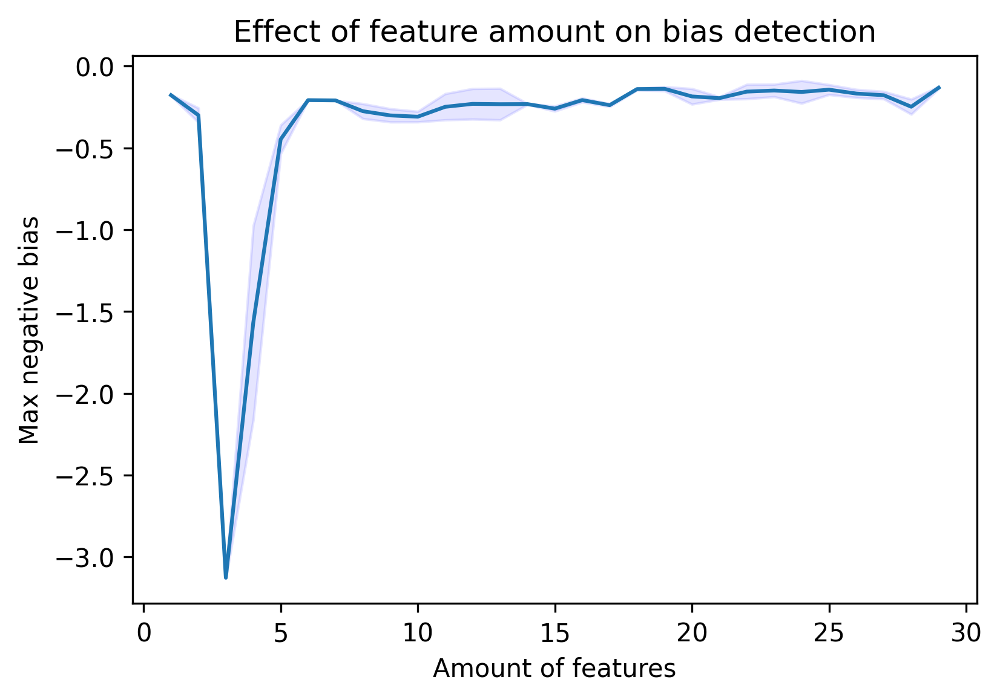

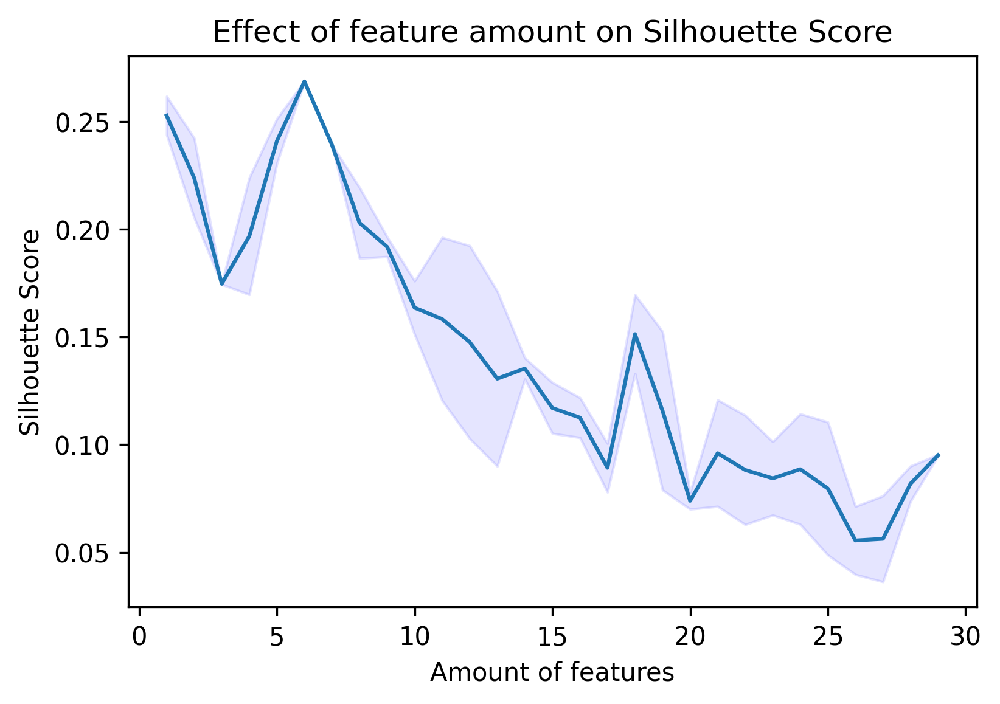

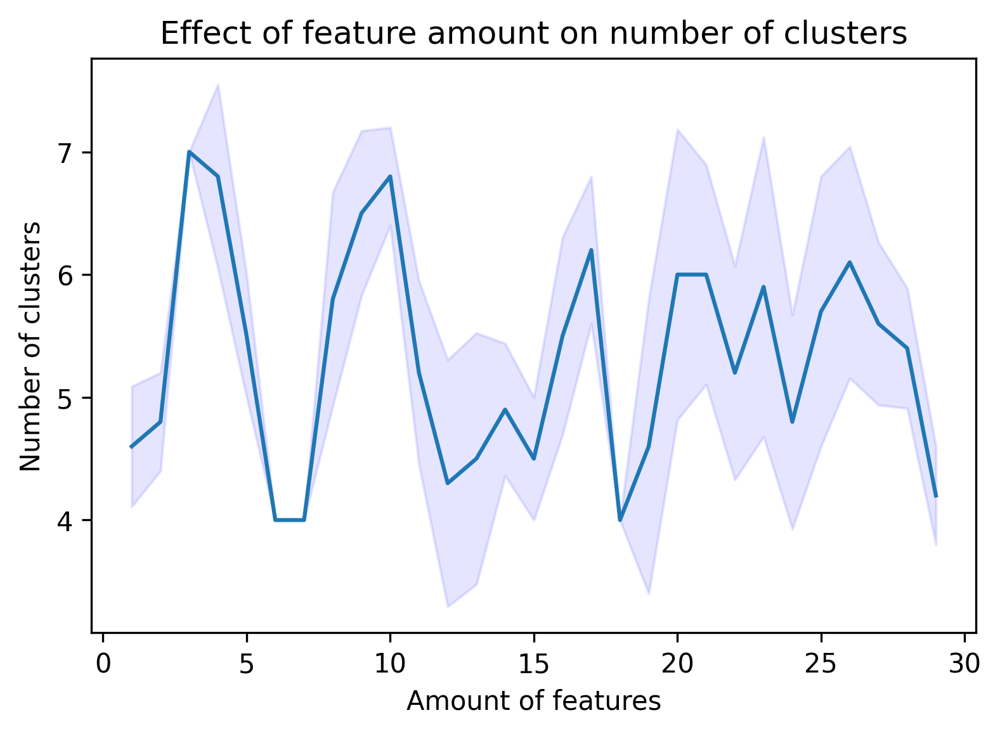

In [171]:
#### PLot results
upper_std = (np.array(biases)+np.array(bias_std))
lower_std = (np.array(biases)-np.array(bias_std))
plt.fill_between([i for i in range(1,FEATURE_AMOUNT+1)],lower_std, upper_std, color='b', alpha=.1)
plt.plot([i for i in range(1,FEATURE_AMOUNT+1)], biases)
plt.ylabel('Max negative bias')
plt.xlabel('Amount of features')
plt.title('Effect of feature amount on bias detection')
plt.show()

upper_std = (np.array(sillh_list)+np.array(std_sillh))
lower_std = (np.array(sillh_list)-np.array(std_sillh))
plt.fill_between([i for i in range(1,FEATURE_AMOUNT+1)],lower_std, upper_std, color='b', alpha=.1)
plt.plot([i for i in range(1,FEATURE_AMOUNT+!)], sillh_list)
plt.ylabel('Silhouette Score')
plt.xlabel('Amount of features')
plt.title('Effect of feature amount on Silhouette Score')
plt.show()

upper_std = (np.array(number_of_clusters)+np.array(std_number_of_clusters))
lower_std = (np.array(number_of_clusters)-np.array(std_number_of_clusters))
plt.fill_between([i for i in range(1,FEATURE_AMOUNT+1)],lower_std, upper_std, color='b', alpha=.1)
plt.plot([i for i in range(1,FEATURE_AMOUNT+1)], number_of_clusters)
plt.ylabel('Number of clusters')
plt.xlabel('Amount of features')
plt.title('Effect of feature amount on number of clusters')
plt.show()

In [172]:
print(biases)

[-0.17743328215496768, -0.2999022206419284, -3.1270569017790333, -1.5690536266837094, -0.447485381489696, -0.2078432688567017, -0.20945992468242025, -0.2754114921297404, -0.3011590356411203, -0.3090393827840227, -0.24866229573820817, -0.2306853715834217, -0.23250653229602458, -0.2318974924250561, -0.2597168074094892, -0.20747914109641147, -0.23855093273262684, -0.1401505469565726, -0.1384121025433613, -0.18516165026970138, -0.19557526982575307, -0.15570443663812084, -0.1489678373165409, -0.15786201975731895, -0.14383345216732685, -0.16758468742151905, -0.17780142488841472, -0.24820098053835998, -0.1318364016321013]


# Adding features based on bias

In [9]:
max_features = 15
all_features = sorted_features.copy()
selected_features = []
mean_biases = []
min_biases = []
max_biases = []

for i in range(max_features):
    feature_bias = dict()
    
    ## Add most discriminating feature to selected_features
    for feature in all_features[:]:
        current_feature_set = [feature]
        current_feature_set.extend(selected_features)
        print('FEATURE SET: ', current_feature_set)
        current_feature_set.extend(['predicted_class','true_class', 'errors'])
        
        #### CAlculate max negative bias, avg of 5 runs
        avg_bias_runs = []
        for j in range(4):
            results = hbac_kmeans.hbac_kmeans(df[current_feature_set], 0.8, show_plot=False)
            c, max_neg_bias = hbac_kmeans.get_max_bias_cluster(results, printing=False)
            avg_bias_runs.append(max_neg_bias)
        feature_bias[feature] = mean(avg_bias_runs)
    
    
    best_feature = min(feature_bias, key=feature_bias.get)
    all_features.remove(best_feature)
    selected_features.append(best_feature)
    
    mean_biases.append(mean(feature_bias.values()))
    min_biases.append(min(feature_bias.values()))
    max_biases.append(max(feature_bias.values()))

    print('\n\n')
    print('Best feature set :', selected_features, feature_bias[best_feature])
    print('\n\n')
    
        
        

FEATURE SET:  ['listing_size_m2']
1 has bias 0.03524258559190996
3 has bias -0.13640317889541453
0 has bias -0.11296144424394905
4 has bias 0.07981031708930364
2 has bias -0.17469601200623142
cluster with the highest discriminating bias: 2
1 has bias 0.03524258559190996
0 has bias -0.11867587671653879
2 has bias 0.08620196742423392
3 has bias -0.18382024583535228
cluster with the highest discriminating bias: 3
0 has bias 0.03524258559190996
1 has bias -0.13640317889541453
3 has bias -0.11296144424394905
2 has bias 0.08608537470808597
4 has bias -0.18382024583535228
cluster with the highest discriminating bias: 4
1 has bias 0.03524258559190996
3 has bias -0.13572094469645846
2 has bias -0.11296144424394905
4 has bias 0.08620196742423392
0 has bias -0.18382024583535228
cluster with the highest discriminating bias: 0
FEATURE SET:  ['gemiddeldewoningwaarde']
1 has bias -0.0016444304366072249
0 has bias -0.04110762877245533
2 has bias -1.6193668837190374
3 has bias -0.027528470266234617
clu

3 has bias 0.004498385987965259
0 has bias 0.12452571204845175
2 has bias -1.1757611347368009
1 has bias -0.0010884558725107185
cluster with the highest discriminating bias: 2
2 has bias 0.004587322191004661
0 has bias 0.12434870057698011
3 has bias -1.1757611347368009
1 has bias -0.0010884558725107185
cluster with the highest discriminating bias: 3
3 has bias 0.0044358109772396626
0 has bias 0.12459223217920379
2 has bias -1.1757611347368009
1 has bias -0.0010884558725107185
cluster with the highest discriminating bias: 2
FEATURE SET:  ['bouwjaar_x']
0 has bias 0.038404713835461735
2 has bias 0.15608198374521387
1 has bias -0.9224001324890516
5 has bias 0.013734872509613472
3 has bias -0.2772818828544872
4 has bias -0.21664802442263253
cluster with the highest discriminating bias: 1
0 has bias 0.038404713835461735
2 has bias 0.15592818301340317
4 has bias -0.9284951294595977
1 has bias 0.015046009206989841
3 has bias -0.2492989970190136
cluster with the highest discriminating bias: 4


2 has bias 0.07217374792471731
1 has bias -0.02075532616170861
0 has bias 0.016657200160679286
3 has bias -0.8937279526987805
cluster with the highest discriminating bias: 3
3 has bias 0.0729029039393313
2 has bias -0.021022286316687122
0 has bias 0.016657200160679286
1 has bias -0.8937279526987805
cluster with the highest discriminating bias: 1
FEATURE SET:  ['storage']
1 has bias 0.020847654234565582
3 has bias 0.21267524293097761
0 has bias -0.0059539037027926955
5 has bias -1.0904161414136837
4 has bias -0.036062679430180045
2 has bias -0.5152268489997407
cluster with the highest discriminating bias: 5
3 has bias 0.020847654234565582
2 has bias 0.09655672417081795
1 has bias -0.0059539037027926955
0 has bias -1.0904161414136837
cluster with the highest discriminating bias: 0
2 has bias 0.019623652363437438
0 has bias 0.09655672417081795
1 has bias -0.0059539037027926955
3 has bias -1.0893603285254945
cluster with the highest discriminating bias: 3
0 has bias 0.020847654234565582
3 

3 has bias 0.024053880975017927
0 has bias -0.0393154555770544
1 has bias 0.09303188164981269
2 has bias -0.826734647634923
cluster with the highest discriminating bias: 2
3 has bias 0.02172510302896702
1 has bias -0.0393154555770544
2 has bias 0.09444672631549622
0 has bias -0.8682955928176831
cluster with the highest discriminating bias: 0
0 has bias 0.02172510302896702
1 has bias -0.0393154555770544
2 has bias 0.09444672631549622
3 has bias -0.8682955928176831
cluster with the highest discriminating bias: 3
0 has bias 0.018880484653481355
1 has bias -0.0393154555770544
2 has bias 0.09396484703515517
3 has bias -0.8972848134636288
cluster with the highest discriminating bias: 3
FEATURE SET:  ['leeftijdscategorie_25_45']
2 has bias -0.007604113517058142
1 has bias 0.021822684209709897
0 has bias 0.014375573814426112
3 has bias -1.0723973916840448
cluster with the highest discriminating bias: 3
3 has bias -0.007604113517058142
1 has bias 0.021822684209709897
0 has bias 0.01437557381442

0 has bias -0.22873172417492615
1 has bias 0.022011458191557587
2 has bias 0.040584669986712285
cluster with the highest discriminating bias: 0
1 has bias -0.25309850898059005
0 has bias 0.022011458191557587
2 has bias 0.044118580940532004
cluster with the highest discriminating bias: 1
2 has bias -0.24354173804723245
0 has bias 0.022011458191557587
1 has bias 0.041733017944876716
cluster with the highest discriminating bias: 2
2 has bias -0.2645466853199082
1 has bias 0.021504052823015152
0 has bias 0.04598658940219813
cluster with the highest discriminating bias: 2
FEATURE SET:  ['marokko']
0 has bias 0.01693747970513515
3 has bias 0.21695505208715582
5 has bias -1.1188183065684512
4 has bias -0.03163239022443176
1 has bias 0.002641285730796583
2 has bias -0.494179591072326
cluster with the highest discriminating bias: 5
1 has bias 0.019671043887285355
2 has bias 0.21680361723856745
4 has bias -1.0890372125438108
3 has bias -0.20939327699581478
0 has bias 0.002641285730796583
cluster

This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster


2 has bias -0.2544135024121945
0 has bias 0.031880711642450765
1 has bias 0.053759266613018886
3 has bias -0.3547935199106296
cluster with the highest discriminating bias: 3
3 has bias -0.2501336458284531
0 has bias 0.030199190800991205
2 has bias 0.053901270083389186
1 has bias -0.3547935199106296
cluster with the highest discriminating bias: 1
3 has bias -0.2328342078765846
1 has bias 0.030077154112334137
2 has bias 0.05421297588426899
0 has bias -0.4220580869253089
cluster with the highest discriminating bias: 0
FEATURE SET:  ['geluidvanwegverkeeroverlastetmaal']
0 has bias 0.08546608793591237
1 has bias -0.021772320603490658
2 has bias -0.43674542169813746
cluster with the highest discriminating bias: 2
0 has bias 0.08710677127965416
1 has bias -0.02449806471568894
2 has bias -0.43674542169813746
cluster with the highest discriminating bias: 2
0 has bias 0.08716695621657267
2 has bias -0.023947755389486236
1 has bias -0.45059258862082896
cluster with the highest discriminating bias

3 has bias -0.15510773414160006
1 has bias 0.022043698620650698
0 has bias 0.0384994136987602
2 has bias -0.3057334740519545
cluster with the highest discriminating bias: 2
3 has bias -0.1033150475746738
0 has bias 0.02083075605262985
1 has bias 0.038811438368908435
2 has bias -0.4210192782257506
cluster with the highest discriminating bias: 2
2 has bias -0.10343186733121668
0 has bias 0.02083075605262985
1 has bias 0.03880590522623106
3 has bias -0.4210192782257506
cluster with the highest discriminating bias: 3
3 has bias -0.04165770078734743
0 has bias 0.02058140181085044
1 has bias 0.03890636707843065
2 has bias -0.5300987296118608
cluster with the highest discriminating bias: 2
FEATURE SET:  ['personenautosnaaroppervlakte']
1 has bias 0.03741126174235598
2 has bias 0.0006167127373600811
3 has bias -1.5558868598100557
0 has bias 0.00919261915478442
cluster with the highest discriminating bias: 3
1 has bias 0.038197774193035605
2 has bias 0.0035223425007584463
3 has bias -1.61823844

This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster


This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster


This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster


This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
0 has bias 0.8437148874263389
cluster with the highest discriminating bias: 0
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the en

0 has bias 0.039548311025432326
2 has bias 0.11045962079553162
1 has bias -0.09397274721354199
3 has bias -0.8228337659226649
cluster with the highest discriminating bias: 3
FEATURE SET:  ['koopwoningen']
2 has bias 0.003760487606612961
0 has bias 0.04164985574307856
1 has bias 0.005999643455807724
3 has bias -0.8417815382770614
cluster with the highest discriminating bias: 3
0 has bias -0.0127903539598343
1 has bias 0.04164985574307856
2 has bias 0.005999643455807724
3 has bias -0.7680638865775862
cluster with the highest discriminating bias: 3
1 has bias -0.019754378836717823
0 has bias 0.04164985574307856
2 has bias 0.006156940304368419
3 has bias -0.8875725593798955
cluster with the highest discriminating bias: 3
2 has bias -0.019775440634535957
0 has bias 0.04164985574307856
1 has bias 0.005999643455807724
3 has bias -0.8875725593798955
cluster with the highest discriminating bias: 3
FEATURE SET:  ['moeitemetrondkomen']
1 has bias -0.010066311160172536
0 has bias -0.00359044283852

This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
0 has bias 0.8437148874263389
cluster with the highest discriminating bias: 0
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the en

0 has bias 0.019581462986298814
2 has bias 0.028866484259566838
1 has bias 0.01777122653999985
3 has bias -1.040724808874754
cluster with the highest discriminating bias: 3
1 has bias 0.019699673400411566
2 has bias 0.028866484259566838
0 has bias 0.01777122653999985
3 has bias -1.0415813791788762
cluster with the highest discriminating bias: 3
FEATURE SET:  ['huishoudenstotaal']
3 has bias 0.016396713908019556
2 has bias 0.1262233768465295
0 has bias -0.07109436071432707
1 has bias -1.1293256554014475
cluster with the highest discriminating bias: 1
5 has bias 0.01596751170416355
0 has bias 0.2153000124505119
1 has bias -0.07019141295600262
2 has bias -1.1293256554014475
3 has bias -0.15202116249833597
4 has bias -0.282164167855915
cluster with the highest discriminating bias: 2
6 has bias 0.01596751170416355
1 has bias 0.21465715703719368
0 has bias -0.07019141295600262
2 has bias -1.1293256554014475
3 has bias -0.00450485890941521
4 has bias -0.27763646720953006
5 has bias -0.3311141

This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster


This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster


This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster


0 has bias 0.020564744701868642
2 has bias 0.2221932351532605
4 has bias -1.004634569138315
3 has bias -0.22607975097485
1 has bias 0.04252620683925945
cluster with the highest discriminating bias: 4
4 has bias 0.020564744701868642
0 has bias 0.2221932351532605
2 has bias -1.004634569138315
3 has bias -0.22607975097485
1 has bias 0.04252620683925945
cluster with the highest discriminating bias: 2
FEATURE SET:  ['energy_label_d']
2 has bias 0.01880089891773773
0 has bias 0.10604470488698148
3 has bias -1.0954057764832714
1 has bias 0.04612123743618657
cluster with the highest discriminating bias: 3
4 has bias 0.01693624152827966
2 has bias 0.21835820251627658
0 has bias -1.1393388401576319
1 has bias 0.04612123743618657
3 has bias -0.22577223611890884
cluster with the highest discriminating bias: 0
2 has bias 0.017731507088253995
0 has bias 0.10604470488698148
3 has bias -1.1370808130495966
1 has bias 0.04612123743618657
cluster with the highest discriminating bias: 3
0 has bias 0.01837

You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0


This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
0 has bias 0.8437148874263389
cluster with the highest discriminating bias: 0



Best feature set : ['overgewicht'] -1.9817700283119564



FEATURE SET:  ['listing_size_m2', 'overgewicht']
0 has bias 0.046118926362186285
4 has bias -0.008910427007663313
2 has bias -0.05307090481745258
1 has bias -0.4401812480196854
3 has bias -0.13684931647727805
cluster with the highest discriminating bias: 1
1 has bias 0.046118926362186285
2 has bias -0.008910427007663313
0 has bias -0.05307090481745258
4 has bias -0.4401812480196854
5 has bias -0.6060301496558095
3 has bias -0.14750064590557177
cluster with the highest discriminating bias: 5
1 has bias 0.046115717098334286
4 has bias -0.008871735935613523
2 has bias -0.053120489167497564
0 has bias -0.4401812480196854
3 has bias -0.13684931647727805
clus

2 has bias 0.059274969854507864
0 has bias 0.150489204430016
6 has bias -2.283688067060204
1 has bias -0.0010884558725107185
3 has bias -0.09588968686087429
5 has bias -0.48300466757880944
4 has bias -0.49670936769418805
cluster with the highest discriminating bias: 6
0 has bias 0.0576734919878612
2 has bias 0.15066009417065518
5 has bias -2.2910637278705206
1 has bias -0.0010884558725107185
3 has bias -0.09477091985330599
4 has bias -0.4343320769402711
cluster with the highest discriminating bias: 5
FEATURE SET:  ['bouwjaar_x', 'overgewicht']
1 has bias 0.049854043588763886
0 has bias -0.037416508690610306
2 has bias 0.002101725341412508
3 has bias -0.42280246581409553
cluster with the highest discriminating bias: 3
0 has bias 0.049854043588763886
2 has bias -0.03675730506865149
3 has bias -0.0061958383379752124
1 has bias -0.41908342706407187
cluster with the highest discriminating bias: 1
0 has bias 0.049854043588763886
2 has bias -0.03675730506865149
1 has bias -0.00348721243067473

1 has bias 0.03446732004559916
0 has bias -0.06642102298743946
2 has bias 0.08654461608095565
3 has bias -0.7098686517935651
4 has bias -0.08072577159983885
cluster with the highest discriminating bias: 3
0 has bias 0.03473227965057102
4 has bias 0.004060920908797505
1 has bias -0.14801886415757026
3 has bias 0.09750973336448643
2 has bias -0.4757590880741869
cluster with the highest discriminating bias: 2
FEATURE SET:  ['storage', 'overgewicht']
2 has bias 0.048189630420185536
3 has bias -0.03271811416753534
1 has bias -0.0059539037027926955
0 has bias -1.9024582624867339
4 has bias -0.1262599128514792
cluster with the highest discriminating bias: 0
2 has bias 0.048143114879573234
0 has bias -0.03309157588689171
1 has bias -0.0059539037027926955
3 has bias -1.9024582624867339
4 has bias -0.12619619944870164
cluster with the highest discriminating bias: 3
2 has bias 0.04898468991849436
1 has bias -0.0331567552511961
0 has bias -0.0059539037027926955
4 has bias -1.9259476593932308
3 has

0 has bias 0.06768980029599148
1 has bias -0.07911033623964281
3 has bias -0.026403218821937746
2 has bias -0.35288039234600055
4 has bias -0.4998387458501733
cluster with the highest discriminating bias: 4
1 has bias 0.06856490867700193
2 has bias -0.08263494067252686
0 has bias -0.023753986389024595
3 has bias -0.3693117054134417
4 has bias -0.5039010509411302
cluster with the highest discriminating bias: 4
FEATURE SET:  ['leefbaarheid_score', 'overgewicht']
0 has bias 0.04503217634105816
2 has bias -0.02284348785071144
1 has bias -0.02493810267013208
3 has bias -0.49861328788364545
cluster with the highest discriminating bias: 3
0 has bias 0.043176326666525044
2 has bias -0.022326292648259694
3 has bias -0.024145085025984003
1 has bias -0.49071833390626796
cluster with the highest discriminating bias: 1
0 has bias 0.04503217634105816
1 has bias -0.02284348785071144
3 has bias -0.02493810267013208
2 has bias -0.49861328788364545
cluster with the highest discriminating bias: 2
0 has b

1 has bias 0.06768980029599148
0 has bias -0.07911033623964281
2 has bias -0.025025165784138825
3 has bias -0.3514099317985131
4 has bias -0.4998387458501733
cluster with the highest discriminating bias: 4
0 has bias 0.06768980029599148
1 has bias -0.07906363598690769
2 has bias -0.024979808106658785
3 has bias -0.3483125301432053
4 has bias -0.4998387458501733
cluster with the highest discriminating bias: 4
FEATURE SET:  ['westerstotaal', 'overgewicht']
1 has bias 0.05208054817018115
2 has bias -0.016716607837776842
3 has bias -1.9016070852935958
0 has bias -0.08535556499640218
cluster with the highest discriminating bias: 3
1 has bias 0.05165477520671968
2 has bias -0.01326953293881905
3 has bias -1.9016070852935958
0 has bias -0.09609496825263475
cluster with the highest discriminating bias: 3
1 has bias 0.05165477520671968
0 has bias -0.01326953293881905
3 has bias -1.9016070852935958
2 has bias -0.09609496825263475
cluster with the highest discriminating bias: 3
0 has bias 0.05165

0 has bias 0.06845162389911241
2 has bias -0.03723222593594033
1 has bias -0.4939368475437935
3 has bias 0.007055208822610348
cluster with the highest discriminating bias: 1
FEATURE SET:  ['afstandtottreinstationstotaal', 'overgewicht']
1 has bias -0.08110338584340748
4 has bias -0.02268444491465693
3 has bias 0.06747597287331852
0 has bias -1.3944633373629032
2 has bias -0.03787692623781658
5 has bias -0.07517471597006464
cluster with the highest discriminating bias: 0
3 has bias -0.1272966074219729
1 has bias -0.06181748850764768
0 has bias 0.06642858699978882
2 has bias -0.06775741440595384
cluster with the highest discriminating bias: 3
3 has bias -0.16872289751709335
0 has bias -0.06155959601358796
2 has bias 0.06833592912126496
1 has bias -0.039450891508650776
cluster with the highest discriminating bias: 3
3 has bias -0.16852470831572597
0 has bias -0.062105015923771933
1 has bias 0.06857501054994442
2 has bias -0.03908954776981266
cluster with the highest discriminating bias: 3

2 has bias -0.008638211841201393
0 has bias 0.029278397124973266
1 has bias -0.020167864567095295
3 has bias -0.40830467913612056
cluster with the highest discriminating bias: 3
2 has bias -0.00965546895832825
1 has bias 0.029278397124973266
0 has bias -0.01920329374760965
3 has bias -0.40830467913612056
cluster with the highest discriminating bias: 3
2 has bias -0.008638211841201393
1 has bias 0.029278397124973266
0 has bias -0.020167864567095295
3 has bias -0.40830467913612056
cluster with the highest discriminating bias: 3
FEATURE SET:  ['leeftijdscategorie_15_25', 'overgewicht']
0 has bias 0.044273897446044486
2 has bias -0.004759570794548584
3 has bias -1.6050421987292396
1 has bias -0.07875645213877058
cluster with the highest discriminating bias: 3
1 has bias 0.044238178716803245
2 has bias -0.004873168180227427
3 has bias -1.6510103338531907
0 has bias -0.0802869093013886
cluster with the highest discriminating bias: 3
1 has bias 0.044238178716803245
0 has bias -0.0048261292854

1 has bias 0.020666762967679442
3 has bias 0.026400519721391458
2 has bias -0.8427667274928601
0 has bias -0.008646794634567856
cluster with the highest discriminating bias: 2
FEATURE SET:  ['afstandtotbelangrijkoverstapstation', 'overgewicht']
1 has bias 0.0707180114938577
3 has bias -0.02632765213628363
2 has bias -0.15879745471870543
0 has bias -0.06343138743094734
4 has bias -0.7114059491453341
cluster with the highest discriminating bias: 4
1 has bias 0.07144229063423146
3 has bias -0.027246348777732687
2 has bias -0.15879745471870543
0 has bias -0.3301821434134551
cluster with the highest discriminating bias: 0
0 has bias 0.07173202579949023
3 has bias -0.027472668846919457
2 has bias -0.15879745471870543
4 has bias -0.06343138743094734
1 has bias -0.7114059491453341
cluster with the highest discriminating bias: 1
1 has bias 0.07008178959820655
0 has bias -0.026169143279294982
2 has bias -0.15879745471870543
4 has bias -0.05103593451309685
3 has bias -0.7705562415111432
cluster w

0 has bias -0.07691666934181152
2 has bias -0.017849771900880107
1 has bias 0.06253861355537238
3 has bias -0.5969658253200247
cluster with the highest discriminating bias: 3
2 has bias -0.07695530887729063
1 has bias -0.01896028753800838
0 has bias 0.0627952263378001
3 has bias -0.5767881559444293
cluster with the highest discriminating bias: 3
0 has bias -0.07691666934181152
3 has bias -0.017849771900880107
1 has bias 0.06253861355537238
2 has bias -0.5969658253200247
cluster with the highest discriminating bias: 2
FEATURE SET:  ['parking_type_openbaar', 'overgewicht']
2 has bias 0.030685739782677857
0 has bias -0.014099935283562792
1 has bias 0.0064725407084600395
3 has bias -1.9408724348922124
4 has bias -0.12953491119631544
cluster with the highest discriminating bias: 3
2 has bias 0.03877777023990925
3 has bias -0.02472346472045217
0 has bias 0.0064725407084600395
4 has bias -1.9765731778447901
1 has bias -0.1409263583569258
cluster with the highest discriminating bias: 4
2 has b

This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster


2 has bias 0.04847824000891021
3 has bias -0.024711667601071685
4 has bias -1.9232467244263587
0 has bias -0.09179395219828468
1 has bias -0.03095083175991231
cluster with the highest discriminating bias: 4
0 has bias 0.04888298100836341
3 has bias -0.025056698034484737
4 has bias -1.9232467244263587
2 has bias -0.09179395219828468
1 has bias -0.03095083175991231
cluster with the highest discriminating bias: 4
2 has bias 0.04888298100836341
3 has bias -0.024579639593773184
4 has bias -1.9232467244263587
1 has bias -0.09236429408495461
0 has bias -0.03095083175991231
cluster with the highest discriminating bias: 4
FEATURE SET:  ['geluidvantreinverkeeroverlastnacht', 'overgewicht']
0 has bias 0.0509189746541332
2 has bias -0.028080112143740843
4 has bias -1.8869065590291545
3 has bias -0.08702338155437273
1 has bias -0.04749285455578922
cluster with the highest discriminating bias: 4
1 has bias 0.04867317418665673
2 has bias -0.02503977747057118
4 has bias -1.8869065590291545
3 has bias 

1 has bias 0.005713792633841641
2 has bias -0.031679715330767966
3 has bias -2.085740587438184
0 has bias 0.056000430999013306
4 has bias -0.11036236108069652
cluster with the highest discriminating bias: 3
0 has bias 0.005713792633841641
4 has bias 0.15738630143662113
5 has bias -2.085740587438184
1 has bias 0.056000430999013306
3 has bias -0.10688283454734737
2 has bias -0.4141231545522014
cluster with the highest discriminating bias: 5
FEATURE SET:  ['energy_label_e', 'overgewicht']
0 has bias 0.05303190375966638
2 has bias -0.032683399728983265
4 has bias -2.052259801752799
3 has bias -0.1024926575796824
1 has bias 0.005304205671164075
cluster with the highest discriminating bias: 4
0 has bias 0.05303190375966638
2 has bias -0.032683399728983265
4 has bias -2.0679037862135923
3 has bias -0.10230546595031709
1 has bias 0.005304205671164075
cluster with the highest discriminating bias: 4
2 has bias 0.051732225926527486
3 has bias -0.0318944249839761
0 has bias -2.0679037862135923
4 h

This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
0 has bias 0.8437148874263389
cluster with the highest discriminating bias: 0
This cluster is the en

1 has bias 0.055935090486794126
2 has bias -0.02736435141393656
0 has bias -0.22807936785020855
4 has bias -0.5129653763758594
3 has bias -0.05675358242025785
cluster with the highest discriminating bias: 4
1 has bias 0.05845701973805739
4 has bias -0.029134591325675863
3 has bias -0.22807936785020855
2 has bias -0.5203092090277933
0 has bias -0.05675358242025785
cluster with the highest discriminating bias: 2
0 has bias 0.055295537653790916
1 has bias -0.027348764926960256
3 has bias -0.22807936785020855
4 has bias -0.5129653763758594
2 has bias -0.05608415163591429
cluster with the highest discriminating bias: 4
FEATURE SET:  ['gemiddeldinkomenperinkomensontvanger', 'overgewicht', 'bevolkingsdichtheid']
0 has bias 0.04066824361510535
1 has bias -0.2398590586190753
2 has bias -0.13148251924974796
3 has bias 0.08999821363943239
4 has bias -0.4854458745348128
cluster with the highest discriminating bias: 4
1 has bias 0.04066824361510535
2 has bias -0.0807934780909707
0 has bias -0.09106

1 has bias 0.040848219010968134
2 has bias -0.023390061917776706
3 has bias -0.3654156214818074
0 has bias -0.026600157538992142
4 has bias -0.3861441187362695
cluster with the highest discriminating bias: 4
0 has bias 0.040258998350038766
2 has bias -0.023390061917776706
1 has bias -0.30957942419289775
3 has bias -0.028416056913859067
4 has bias -0.40009208391895146
cluster with the highest discriminating bias: 4
FEATURE SET:  ['afstandtotopenbaargroentotaal', 'overgewicht', 'bevolkingsdichtheid']
1 has bias 0.03573627017061398
2 has bias 0.008928965782728171
3 has bias -0.04112836739491432
0 has bias -0.032666231740938745
4 has bias -1.244957532218606
cluster with the highest discriminating bias: 4
0 has bias 0.03573627017061398
1 has bias 0.008928965782728171
4 has bias -0.04277121570098119
2 has bias -0.03270382451034426
3 has bias -1.0669960170917274
cluster with the highest discriminating bias: 3
1 has bias 0.03573627017061398
3 has bias 0.008928965782728171
2 has bias -0.0531561

1 has bias 0.02882908412749674
0 has bias -0.05689175514595868
2 has bias 0.10905062203037841
3 has bias -2.6122966181799017
4 has bias -0.18412975088703054
cluster with the highest discriminating bias: 3
FEATURE SET:  ['percentagebewoond', 'overgewicht', 'bevolkingsdichtheid']
0 has bias 0.05577490112404937
2 has bias -0.03309560023850644
1 has bias -0.6413991235784097
3 has bias -0.1852514039419042
cluster with the highest discriminating bias: 1
1 has bias 0.05577490112404937
0 has bias -0.03309560023850644
2 has bias -0.6413991235784097
3 has bias -0.1852514039419042
cluster with the highest discriminating bias: 2
0 has bias 0.05577490112404937
1 has bias -0.03309560023850644
4 has bias -2.789685492200338
3 has bias -0.14363816026619314
2 has bias -0.1841782087536723
cluster with the highest discriminating bias: 4
1 has bias 0.05577490112404937
2 has bias -0.03309560023850644
4 has bias -2.789685492200338
3 has bias -0.14363816026619314
0 has bias -0.1841782087536723
cluster with th

0 has bias 0.0335186605374751
2 has bias -0.23869302912988855
1 has bias 0.10955496533045395
3 has bias 0.08098239571778032
5 has bias -2.509862636297708
4 has bias -0.23017521122968954
cluster with the highest discriminating bias: 5
0 has bias 0.03315205400022381
1 has bias -0.06254086224161137
2 has bias 0.10818850467173435
4 has bias -2.509862636297708
3 has bias -0.22803110571967322
cluster with the highest discriminating bias: 4
1 has bias 0.03315205400022381
3 has bias 0.11682527379349683
0 has bias -0.07458339764712285
2 has bias -2.4430610384947675
4 has bias -0.24720757269215066
cluster with the highest discriminating bias: 2
0 has bias 0.0334357571523245
3 has bias 0.11576246438672022
1 has bias -0.07418877666140089
2 has bias -2.4751111482165102
4 has bias -0.22800690309706861
cluster with the highest discriminating bias: 2
FEATURE SET:  ['geluidvanwegverkeeroverlastnacht', 'overgewicht', 'bevolkingsdichtheid']
0 has bias 0.06133798746899899
3 has bias 0.016142849259045633
2

0 has bias 0.0653580021569824
2 has bias -0.050876926126697586
3 has bias -0.017324370595584115
1 has bias -0.2642033543454816
4 has bias -0.6822051293358713
cluster with the highest discriminating bias: 4
1 has bias 0.0653580021569824
2 has bias -0.050876926126697586
0 has bias -0.017324370595584115
4 has bias -0.26446988271294314
3 has bias -0.6802844152061233
cluster with the highest discriminating bias: 3
1 has bias 0.0653580021569824
2 has bias -0.050876926126697586
3 has bias -0.017324370595584115
4 has bias -0.2642033543454816
0 has bias -0.6822051293358713
cluster with the highest discriminating bias: 0
0 has bias 0.0640519608024872
1 has bias -0.05184330178937735
3 has bias -0.0012632981420007683
2 has bias -0.5719994518053295
cluster with the highest discriminating bias: 2
FEATURE SET:  ['geluidvanwegverkeeroverlastetmaal', 'overgewicht', 'bevolkingsdichtheid']
1 has bias 0.06130979363641509
4 has bias 0.021875024605029214
5 has bias 0.032455830107098405
3 has bias -0.5369139

0 has bias 0.040390398417849305
3 has bias -0.006556837860236309
1 has bias -0.3198411073465819
4 has bias -0.38733111164477896
2 has bias -0.14346925081087258
cluster with the highest discriminating bias: 4
0 has bias 0.04251304193510763
3 has bias -0.007995858498729524
2 has bias -0.3370834465841459
4 has bias -0.3866956249603688
1 has bias -0.14346925081087258
cluster with the highest discriminating bias: 4
FEATURE SET:  ['drinker', 'overgewicht', 'bevolkingsdichtheid']
0 has bias 0.0462674950806502
3 has bias -0.04048458242972619
2 has bias -1.6086465201391411
1 has bias -0.012299211548843614
4 has bias -0.0523648733648332
cluster with the highest discriminating bias: 2
0 has bias 0.0462674950806502
3 has bias -0.04048458242972619
4 has bias -1.6086465201391411
1 has bias -0.012299211548843614
2 has bias -0.0523648733648332
cluster with the highest discriminating bias: 4
0 has bias 0.0462674950806502
1 has bias -0.04048458242972619
4 has bias -1.6086465201391411
2 has bias -0.01229

3 has bias -0.13235968049654934
0 has bias -0.024097673571326195
2 has bias 0.050285113749125254
1 has bias -0.03419603939728966
4 has bias -0.23530557035274535
cluster with the highest discriminating bias: 4
FEATURE SET:  ['eenzaam', 'overgewicht', 'bevolkingsdichtheid']
0 has bias 0.03646316357524115
1 has bias -0.06164655731044466
4 has bias -0.04971615034317145
2 has bias -0.008815868033578256
3 has bias -0.9288187004169017
cluster with the highest discriminating bias: 3
1 has bias 0.03646316357524115
2 has bias -0.06164655731044466
0 has bias -0.049914747489609224
3 has bias -0.008841350382392199
4 has bias -0.9288187004169017
cluster with the highest discriminating bias: 4
0 has bias 0.03646316357524115
2 has bias -0.06552324019839217
4 has bias -0.04634426071249753
3 has bias -0.007289085606805079
1 has bias -0.9335163290679434
cluster with the highest discriminating bias: 1
0 has bias 0.03574724519087091
1 has bias -0.05618772024133478
3 has bias -0.08628613430300724
2 has bias

0 has bias 0.08049105094994458
2 has bias -0.32992376373207766
1 has bias -0.060591575813007004
cluster with the highest discriminating bias: 2
1 has bias 0.08049105094994458
0 has bias 0.030679048211779025
2 has bias -0.061042969991066176
3 has bias -0.6583931497378741
cluster with the highest discriminating bias: 3
1 has bias 0.08049105094994458
3 has bias 0.03065921190424381
0 has bias -0.060591575813007004
2 has bias -0.6583931497378741
cluster with the highest discriminating bias: 2
FEATURE SET:  ['eenpersoonshuishoudens', 'overgewicht', 'bevolkingsdichtheid']
0 has bias 0.06097037745017653
1 has bias -0.06962680691001522
3 has bias -0.0096784580575906
2 has bias -0.3140346939001014
cluster with the highest discriminating bias: 2
1 has bias 0.06097037745017653
2 has bias -0.07072581258054189
3 has bias -0.011146404330533377
0 has bias -0.30902931628407027
cluster with the highest discriminating bias: 0
1 has bias 0.06150719158110074
0 has bias -0.06699606492587917
3 has bias -0.01

1 has bias 0.048106844140592964
0 has bias -0.015147724378163141
2 has bias -0.018243026183123567
3 has bias -1.640977332063258
4 has bias -0.1451975186823372
cluster with the highest discriminating bias: 3
1 has bias 0.048225584610657846
3 has bias -0.015382034935018662
2 has bias -0.018243026183123567
4 has bias -1.640977332063258
0 has bias -0.1451975186823372
cluster with the highest discriminating bias: 4
0 has bias 0.048226441683320465
3 has bias -0.015419892501551846
2 has bias -0.01813134093874158
4 has bias -1.6128215848242535
1 has bias -0.1314903866748871
cluster with the highest discriminating bias: 4
FEATURE SET:  ['number_of_floors_building', 'overgewicht', 'bevolkingsdichtheid']
1 has bias 0.04818625154634304
3 has bias -0.08159522863385049
0 has bias -0.2782771622045942
4 has bias 0.09758430780260074
2 has bias -0.05753285805685304
5 has bias -0.30911297088442724
cluster with the highest discriminating bias: 5
0 has bias 0.04810212253645629
1 has bias -0.080720759216642

1 has bias 0.04028150516417828
0 has bias -0.04028150516417828
cluster with the highest discriminating bias: 0
0 has bias 0.04000386381985821
2 has bias -0.013698135240473142
1 has bias -0.3462101434481041
cluster with the highest discriminating bias: 1
FEATURE SET:  ['energy_label_d', 'overgewicht', 'bevolkingsdichtheid']
0 has bias 0.04779468089801253
1 has bias -0.023531976933389043
3 has bias -0.387904030064921
2 has bias -0.029517236196113128
4 has bias -0.40813440283547786
cluster with the highest discriminating bias: 4
1 has bias 0.04173989906997677
2 has bias -0.06677398840567383
3 has bias 0.09523833511794844
5 has bias -2.53017772654346
0 has bias -0.026273459349861916
4 has bias -0.17149448592928318
cluster with the highest discriminating bias: 5
0 has bias 0.04173989906997677
2 has bias -0.06677398840567383
3 has bias 0.09626624073658818
4 has bias -2.53017772654346
1 has bias -0.026273459349861916
5 has bias -0.1766934425629193
cluster with the highest discriminating bias:

0 has bias 0.03550869042337235
2 has bias 0.05315358074461041
1 has bias -0.10140512064675011
3 has bias -1.2181346616281217
4 has bias -0.2933474700921721
cluster with the highest discriminating bias: 3
0 has bias 0.0401046814525744
3 has bias 0.06903347290280348
1 has bias -0.10539007116768628
4 has bias -1.1539521893139781
2 has bias -0.35528889266940633
cluster with the highest discriminating bias: 4
1 has bias 0.035963310955718586
2 has bias 0.06877702208370007
0 has bias -0.10291823521825194
4 has bias -1.2055752490939424
3 has bias -0.35729997505682665
cluster with the highest discriminating bias: 4
1 has bias 0.0401046814525744
0 has bias 0.06499432562258844
2 has bias -0.10937924723909964
3 has bias -1.1751338268025089
4 has bias -0.22331200664845263
cluster with the highest discriminating bias: 3
FEATURE SET:  ['podiabinnenkm', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x']
2 has bias -0.05849415578498207
0 has bias -0.022782908993166706
1 has bias 0.031432352090132176
3

0 has bias 0.05266930094980837
1 has bias -0.07187944056024076
3 has bias 0.08825174717370343
4 has bias -2.7221089564579355
2 has bias -0.06416888291049794
5 has bias -0.23790080560234572
cluster with the highest discriminating bias: 4
FEATURE SET:  ['afstandtotbos', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x']
1 has bias 0.05480049406289467
0 has bias -0.021024688845480477
4 has bias -0.047084916125009424
2 has bias -0.06979984240609638
3 has bias -0.4682418785745559
cluster with the highest discriminating bias: 3
0 has bias 0.05480049406289467
2 has bias -0.020734829044429803
4 has bias -0.047084916125009424
1 has bias -0.07014856745298736
3 has bias -0.4682418785745559
cluster with the highest discriminating bias: 3
1 has bias 0.05481919346467978
0 has bias -0.03518423331891085
4 has bias 0.054044785433472575
2 has bias -0.06979984240609638
3 has bias -0.5200993756360842
cluster with the highest discriminating bias: 3
0 has bias 0.05506549241944014
2 has bias -0.027165471011

0 has bias 0.046637257785049124
1 has bias -0.05767718557777124
3 has bias 0.07295536450720608
2 has bias -0.18420932930367673
4 has bias -1.084284596748073
cluster with the highest discriminating bias: 4
FEATURE SET:  ['storage', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x']
1 has bias 0.053143948617081715
0 has bias -0.018451889946843214
2 has bias -0.012182782796832936
5 has bias -0.16402374212196202
3 has bias -0.4586611313478416
4 has bias -0.695420868658635
cluster with the highest discriminating bias: 4
0 has bias 0.053143948617081715
1 has bias -0.018451889946843214
2 has bias -0.012182782796832936
4 has bias -0.16402374212196202
3 has bias -0.4586611313478416
5 has bias -0.695420868658635
cluster with the highest discriminating bias: 5
1 has bias 0.053143948617081715
0 has bias -0.018451889946843214
2 has bias -0.012182782796832936
3 has bias -0.16402374212196202
4 has bias -0.4586611313478416
5 has bias -0.695420868658635
cluster with the highest discriminating bias: 5


1 has bias 0.0651685084085083
0 has bias -0.06826549659990155
3 has bias -0.017282471163630797
2 has bias -0.40582513627934214
4 has bias -0.3235322309012627
cluster with the highest discriminating bias: 2
1 has bias 0.0651685084085083
2 has bias -0.06691222504109617
0 has bias -0.015829357451868864
3 has bias -0.44583313986974904
cluster with the highest discriminating bias: 3
FEATURE SET:  ['leefbaarheid_score', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x']
1 has bias 0.03616438850276382
2 has bias -0.0362525565642029
0 has bias -0.013673299764263347
3 has bias -0.024016800826024087
4 has bias -0.44679696917716005
cluster with the highest discriminating bias: 4
1 has bias 0.036208830182129725
2 has bias -0.0362525565642029
0 has bias -0.018353655882031972
3 has bias -0.0210145969081732
4 has bias -0.4786346540530668
cluster with the highest discriminating bias: 4
1 has bias 0.036208830182129725
2 has bias -0.0362525565642029
3 has bias -0.03290772788000107
0 has bias -0.0222672

1 has bias 0.0651685084085083
0 has bias -0.06824650736201643
2 has bias -0.01717106530703638
4 has bias -0.38827938436872445
3 has bias -0.3177208057237956
cluster with the highest discriminating bias: 4
0 has bias 0.0651685084085083
2 has bias -0.06824650736201643
1 has bias -0.015149200208769975
3 has bias -0.49276008906997193
4 has bias -0.4039498325079349
cluster with the highest discriminating bias: 3
0 has bias 0.0651685084085083
2 has bias -0.06824650736201643
1 has bias -0.015149200208769975
4 has bias -0.49276008906997193
3 has bias -0.4039498325079349
cluster with the highest discriminating bias: 4
0 has bias 0.0651685084085083
2 has bias -0.06824650736201643
3 has bias -0.017295401124365117
4 has bias -0.40582513627934214
1 has bias -0.3235322309012627
cluster with the highest discriminating bias: 4
FEATURE SET:  ['westerstotaal', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x']
1 has bias 0.06092551059645612
2 has bias -0.043968489023342716
0 has bias 0.0456479260132686

1 has bias 0.05517231548441337
2 has bias -0.0003540092907156067
4 has bias -0.280629435876929
0 has bias -0.04169023558855678
3 has bias -0.3678878773888825
cluster with the highest discriminating bias: 3
1 has bias 0.05517231548441337
2 has bias -0.00031502772427127734
3 has bias -0.03164362485468364
4 has bias -0.6098397192653626
0 has bias -0.3468565489042226
cluster with the highest discriminating bias: 4
FEATURE SET:  ['score_veiligheid', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x']
1 has bias 0.05446208617840864
2 has bias -0.02983366831366019
0 has bias -0.05157449943079895
3 has bias -0.32223140387918636
cluster with the highest discriminating bias: 3
0 has bias 0.055223023477872224
1 has bias -0.03848006582845287
2 has bias -0.05128352214755216
3 has bias -0.2797801502297401
cluster with the highest discriminating bias: 3
0 has bias 0.05446208617840864
2 has bias -0.06717620097282961
4 has bias 0.09826790074574321
1 has bias -0.056288051798304095
3 has bias -0.58906726

0 has bias 0.042019539572185294
2 has bias -0.05463865861356143
1 has bias -0.016334088498492494
3 has bias -1.4091754788005206
4 has bias -0.08040418709685582
cluster with the highest discriminating bias: 3
0 has bias 0.042019539572185294
1 has bias -0.05463865861356143
2 has bias -0.016334088498492494
3 has bias -1.3629602652972932
4 has bias -0.08089621937708646
cluster with the highest discriminating bias: 3
0 has bias 0.042019539572185294
2 has bias -0.05463865861356143
3 has bias -0.016334088498492494
4 has bias -1.3219353707176944
1 has bias -0.0905693100301721
cluster with the highest discriminating bias: 4
0 has bias 0.042019539572185294
2 has bias -0.05463865861356143
3 has bias -0.016334088498492494
1 has bias -1.3015866240153344
4 has bias -0.08519240319598953
cluster with the highest discriminating bias: 1
FEATURE SET:  ['opleidingsniveaulaag', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x']
0 has bias 0.03649103134033982
1 has bias -0.03299513657621511
3 has bias 0.03

1 has bias 0.05872328614043876
2 has bias -0.037277296969246976
0 has bias 0.005269254165728432
3 has bias -0.8772081233086126
4 has bias 0.032386574465264606
cluster with the highest discriminating bias: 3
1 has bias 0.05872328614043876
0 has bias -0.03723352600511898
3 has bias 0.007192044886238591
4 has bias -0.8586948215426286
2 has bias 0.052871976281408606
cluster with the highest discriminating bias: 4
0 has bias 0.05873867156515655
2 has bias -0.11354072657887171
3 has bias -0.021569328056201487
4 has bias 0.009865152209740491
5 has bias -1.830923050954927
1 has bias -0.18931025758801878
cluster with the highest discriminating bias: 5
1 has bias 0.05873867156515655
0 has bias -0.03747237125652414
3 has bias 0.003726523693103112
5 has bias -2.218237063669196
2 has bias 0.047145020895310696
4 has bias -0.46883973494632036
cluster with the highest discriminating bias: 5
FEATURE SET:  ['inbezitoverigeverhuurders', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x']
0 has bias 0.049

0 has bias 0.05252506142381108
2 has bias -0.07167183849122316
1 has bias 0.11225188659459295
4 has bias -3.0166399417198706
3 has bias -0.2713778618169078
cluster with the highest discriminating bias: 4
FEATURE SET:  ['leeftijdscategorie_0_15', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x']
1 has bias 0.0308803675657936
0 has bias 0.026136302800242928
3 has bias 0.022326163289800638
2 has bias -0.05215266734971902
4 has bias -0.8488243500841425
cluster with the highest discriminating bias: 4
1 has bias 0.0308803675657936
3 has bias 0.030708225271875667
2 has bias 0.02108839397538087
0 has bias -0.053383249978325664
4 has bias -0.8361354744252434
cluster with the highest discriminating bias: 4
1 has bias 0.0308803675657936
3 has bias 0.027832243646523258
2 has bias 0.01810690012122751
0 has bias -0.05215266734971902
4 has bias -0.8587654422165086
cluster with the highest discriminating bias: 4
1 has bias 0.03181939133008371
2 has bias 0.02605318284190361
4 has bias 0.0219261078009

1 has bias 0.051324483427929724
4 has bias 0.11332022741126235
2 has bias -0.12015810253157833
3 has bias -0.3268197061285213
0 has bias -0.05492692784789821
5 has bias -0.47125074905507125
cluster with the highest discriminating bias: 5
1 has bias 0.051324483427929724
4 has bias 0.08283635716578408
3 has bias -0.11385342125106113
5 has bias -0.30040987482500425
2 has bias -0.05987025641603583
0 has bias -0.5101667692340058
cluster with the highest discriminating bias: 0
0 has bias 0.051324483427929724
6 has bias 0.08246138513196755
4 has bias 0.0748188874939284
1 has bias -0.4039455118429286
2 has bias -0.05492692784789821
5 has bias -0.5126946517302884
7 has bias -0.17560036682202684
3 has bias -0.3817247000426348
cluster with the highest discriminating bias: 5
FEATURE SET:  ['matigveelregieovereigenleven', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x']
0 has bias 0.040556932611486296
1 has bias -0.04138346411397753
2 has bias -0.0411203592069348
3 has bias -0.025977745740446312

1 has bias 0.05557068257035258
0 has bias -0.09860146631951683
2 has bias -0.1531500072491735
3 has bias 0.07119730583057693
5 has bias 0.01724449358845548
4 has bias -0.6704923959917676
cluster with the highest discriminating bias: 4
FEATURE SET:  ['energy_label_d', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x']
0 has bias 0.05166612523269809
2 has bias -0.07196776009258132
4 has bias 0.1085042970866591
3 has bias -2.574373100150288
1 has bias -0.0028849443544790576
5 has bias -0.26966887742455115
cluster with the highest discriminating bias: 3
1 has bias 0.05166612523269809
3 has bias -0.07527437794148761
0 has bias 0.1124403842560866
5 has bias -2.5097019501264777
2 has bias -0.0028849443544790576
4 has bias -0.25910589761975844
cluster with the highest discriminating bias: 5
0 has bias 0.05166612523269809
1 has bias -0.07527437794148761
3 has bias 0.1124403842560866
5 has bias -2.574373100150288
2 has bias -0.0028849443544790576
4 has bias -0.2547948769496491
cluster with the 

0 has bias 0.057741228770765596
1 has bias -0.03400430741480742
2 has bias -0.040999536347550714
3 has bias -0.23681965049738862
cluster with the highest discriminating bias: 3
0 has bias 0.058566514192687213
1 has bias -0.03486058885080845
3 has bias -0.040999536347550714
2 has bias -0.23681965049738862
cluster with the highest discriminating bias: 2
0 has bias 0.057741228770765596
1 has bias -0.03400430741480742
3 has bias -0.040999536347550714
2 has bias -0.23681965049738862
cluster with the highest discriminating bias: 2
FEATURE SET:  ['gemiddeldewoningwaarde', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven']
1 has bias 0.03413258122689955
0 has bias 0.05631184537782452
3 has bias -0.03455792254900836
2 has bias -0.103240095605874
5 has bias -0.5295349869874607
4 has bias -2.5279745150836384
cluster with the highest discriminating bias: 4
0 has bias 0.03605874190163094
3 has bias 0.05675726620674992
4 has bias -0.03231689390742287
1 has bias -0.104

0 has bias 0.05254297183337908
1 has bias -0.0636993201393744
4 has bias 0.07552270037580533
3 has bias -2.7545231308910143
2 has bias -0.05645122477092579
5 has bias -0.22820734765494088
cluster with the highest discriminating bias: 3
0 has bias 0.05245241061190509
4 has bias -0.22044568806959908
3 has bias 0.1003023467848082
1 has bias 0.08335006811919776
5 has bias -2.96766513272157
2 has bias -0.05645122477092579
6 has bias -0.2743043805050016
cluster with the highest discriminating bias: 5
0 has bias 0.05245241061190509
2 has bias -0.0730557405828951
3 has bias 0.09326318661211963
4 has bias -2.5952658441471503
1 has bias -0.05645122477092579
5 has bias -0.2543732275416777
cluster with the highest discriminating bias: 4
1 has bias 0.05245241061190509
2 has bias -0.06472053442618331
4 has bias 0.07825889704410327
3 has bias -2.7545231308910143
0 has bias -0.05645122477092579
5 has bias -0.22769476431104774
cluster with the highest discriminating bias: 3
FEATURE SET:  ['afstandtotbo

1 has bias 0.05704423510290435
3 has bias -0.02630113874197748
2 has bias -0.058830343604557855
4 has bias -0.12736467521399208
0 has bias -1.484950576770876
cluster with the highest discriminating bias: 0
FEATURE SET:  ['afstandtotsemiopenbaargroentotaal', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven']
1 has bias 0.05164566673698512
0 has bias -0.0672811875513104
2 has bias 0.07398189799915844
3 has bias -0.17967147943213102
4 has bias -0.8850608432788175
cluster with the highest discriminating bias: 4
0 has bias 0.05164566673698512
2 has bias -0.0672811875513104
3 has bias 0.07398189799915844
1 has bias -0.17967147943213102
4 has bias -0.8850608432788175
cluster with the highest discriminating bias: 4
1 has bias 0.05164566673698512
2 has bias -0.06179288673212158
3 has bias 0.07834792465065854
4 has bias -0.27844071723139396
0 has bias -0.8832981915116828
cluster with the highest discriminating bias: 0
1 has bias 0.05164566673698512
0 has bias -0.0

1 has bias 0.05511934590893908
0 has bias -0.06170372124842738
4 has bias 0.08473455750177572
2 has bias -0.026658484522961046
3 has bias -0.7195849151358534
cluster with the highest discriminating bias: 3
0 has bias 0.05511934590893908
3 has bias -0.06254352863511581
2 has bias 0.08583845589096151
1 has bias -0.026658484522961046
5 has bias -1.8886686620522386
4 has bias -0.3853738286640397
cluster with the highest discriminating bias: 5
1 has bias 0.05511934590893908
3 has bias -0.06170372124842738
2 has bias 0.08683827074433748
0 has bias -0.026658484522961046
4 has bias -2.728509816058501
5 has bias -0.32186949091085115
cluster with the highest discriminating bias: 4
FEATURE SET:  ['percentageeengezinswoning', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven']
1 has bias 0.06603719212727244
2 has bias -0.0715407364216214
3 has bias -0.01592106806334148
0 has bias -0.7555982932665306
4 has bias -0.2909418594589581
cluster with the highest discriminati

0 has bias 0.05714409632612605
1 has bias -0.0476588043737447
4 has bias 0.011460780885329869
3 has bias -0.37121904312249143
2 has bias -0.18044062500558466
cluster with the highest discriminating bias: 3
0 has bias 0.05714409632612605
2 has bias -0.0476588043737447
1 has bias 0.012546533545438221
4 has bias -0.3685055163298713
3 has bias -0.18601619888882526
cluster with the highest discriminating bias: 4
FEATURE SET:  ['marokko', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven']
0 has bias 0.0563261198029501
1 has bias -0.05684564143501225
2 has bias -0.16923967689989383
cluster with the highest discriminating bias: 2
1 has bias 0.0563261198029501
2 has bias -0.057653287115769336
0 has bias -0.16709054472191653
cluster with the highest discriminating bias: 0
0 has bias 0.0563261198029501
1 has bias -0.0564978257324531
2 has bias -0.16755188841675783
cluster with the highest discriminating bias: 2
1 has bias 0.056422396762630944
2 has bias -0.05782731

0 has bias 0.04471758836244211
1 has bias -0.02916961198644774
3 has bias 0.04237316228725119
2 has bias -0.03732941905328646
4 has bias -2.232654169511923
5 has bias -0.2694957158151804
cluster with the highest discriminating bias: 4
1 has bias 0.04471758836244211
0 has bias -0.013466882831483673
3 has bias -0.09589457945514335
2 has bias -0.03732941905328646
4 has bias -0.514372596933145
cluster with the highest discriminating bias: 4
0 has bias 0.044836566042945725
1 has bias -0.030356028957623016
3 has bias 0.04120163407451871
2 has bias -0.03732941905328646
4 has bias -2.232654169511923
5 has bias -0.2619725016918
cluster with the highest discriminating bias: 4
FEATURE SET:  ['floor_level', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven']
0 has bias 0.056424013984397114
2 has bias -0.0038933425658866927
3 has bias -0.09978556079215262
1 has bias -0.042487894819212446
4 has bias -0.5374453025030967
cluster with the highest discriminating bias: 4
1 

1 has bias 0.04876837667359024
2 has bias -0.07741254449941659
3 has bias 0.09769730644706776
0 has bias -0.035225106182345645
4 has bias -0.8870946174124863
cluster with the highest discriminating bias: 4
0 has bias 0.04876837667359024
2 has bias -0.07756569757980258
4 has bias 0.09790158874136501
1 has bias -0.0338572008292396
3 has bias -0.8983021392164465
cluster with the highest discriminating bias: 3
0 has bias 0.04876837667359024
2 has bias -0.07737777227339482
3 has bias 0.09786980608427032
1 has bias -0.035248482958351035
4 has bias -0.8983021392164465
cluster with the highest discriminating bias: 4
0 has bias 0.04876837667359024
3 has bias -0.0774698119059245
1 has bias 0.09884893419877727
2 has bias -0.035225106182345645
4 has bias -0.8870946174124863
cluster with the highest discriminating bias: 4
FEATURE SET:  ['goedzeergoedervarengezondheid', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven']
1 has bias 0.04269852684151754
2 has bias -0.045

1 has bias 0.045253736649590426
4 has bias -0.12923002081480672
0 has bias -0.15151232097578948
2 has bias 0.07351582667715284
3 has bias 0.06354186672983997
5 has bias -0.5137753302328295
cluster with the highest discriminating bias: 5
0 has bias 0.045253736649590426
1 has bias -0.061653373655250476
2 has bias 0.10609487017513775
4 has bias -2.5149213351247672
3 has bias -0.20529146081886274
cluster with the highest discriminating bias: 4
0 has bias 0.045253736649590426
3 has bias -0.18061641502034165
1 has bias 0.10497229362413252
2 has bias 0.07393684169973513
5 has bias -2.526830488315999
4 has bias -0.20173674141571152
cluster with the highest discriminating bias: 5
1 has bias 0.045253736649590426
0 has bias -0.057153375794526506
3 has bias 0.10513198842784999
4 has bias -2.526830488315999
2 has bias -0.2024859519917397
cluster with the highest discriminating bias: 4
FEATURE SET:  ['aantalinwoners', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven']

0 has bias 0.05414788487642219
2 has bias -0.05429979357183157
3 has bias -0.015281822746290086
1 has bias -0.5552726285766069
4 has bias -0.03341402402052651
cluster with the highest discriminating bias: 1
0 has bias 0.05414788487642219
1 has bias -0.05662990245839106
2 has bias -0.011840982286779655
3 has bias -0.5951388282491055
4 has bias -0.04789668719358575
cluster with the highest discriminating bias: 3
1 has bias 0.05414788487642219
0 has bias -0.05662990245839106
3 has bias -0.01277527381850041
2 has bias -0.6390753102395099
4 has bias -0.04906229211804036
cluster with the highest discriminating bias: 2
0 has bias 0.053179512420068686
2 has bias -0.05312321532719588
3 has bias -0.015281822746290086
4 has bias -0.5659927715825946
1 has bias -0.0393276400472804
cluster with the highest discriminating bias: 4
FEATURE SET:  ['ordeverstoring', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven']
1 has bias 0.053360204768300834
2 has bias -0.06877466032

2 has bias -0.05992158064520747
3 has bias -0.03970485810617863
4 has bias -0.0582721582091793
1 has bias 0.06298842376892877
0 has bias -0.7315373745207497
cluster with the highest discriminating bias: 0
FEATURE SET:  ['parking_type_openbaar', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven']
1 has bias 0.05236016836604984
0 has bias -0.061007543855485236
3 has bias 0.09237713460840358
2 has bias -0.02147214540335196
4 has bias -0.6904205500954405
cluster with the highest discriminating bias: 4
1 has bias 0.05236016836604984
2 has bias -0.06019529849764871
3 has bias 0.0923294759590596
0 has bias -0.02147214540335196
4 has bias -0.6929991110626043
cluster with the highest discriminating bias: 4
0 has bias 0.05236016836604984
1 has bias -0.061007543855485236
3 has bias 0.09237713460840358
2 has bias -0.02147214540335196
4 has bias -0.6904205500954405
cluster with the highest discriminating bias: 4
0 has bias 0.05236016836604984
3 has bias -0.06100754385

0 has bias 0.04489534670793671
1 has bias -0.1439043275491737
2 has bias -0.12696251568177863
3 has bias 0.06894134263949092
4 has bias -0.16482732269047995
cluster with the highest discriminating bias: 4
FEATURE SET:  ['energy_label_f', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven']
1 has bias 0.05754878728380031
4 has bias -0.27852252250393583
0 has bias -0.1540445797846941
2 has bias 0.07106426616652062
6 has bias 0.05128977536899626
3 has bias -0.671939645890791
5 has bias 0.08913215372776573
cluster with the highest discriminating bias: 3
0 has bias 0.05719090286222561
3 has bias -0.045674307044422435
2 has bias -0.1553201750433697
1 has bias 0.07579184117498272
5 has bias -0.6410085884116952
4 has bias -0.00674228783144093
cluster with the highest discriminating bias: 5
1 has bias 0.056573259668861064
0 has bias -0.056573259668861064
cluster with the highest discriminating bias: 0
0 has bias 0.056378670475548676
1 has bias -0.056378670475548676

0 has bias 0.05040721784306923
1 has bias -0.05040721784306923
cluster with the highest discriminating bias: 1
0 has bias 0.04991371300553182
1 has bias -0.04991371300553182
cluster with the highest discriminating bias: 1



Best feature set : ['overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell'] -2.7679943096626873



FEATURE SET:  ['listing_size_m2', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell']
0 has bias 0.059477125689815225
3 has bias -0.05289331215915405
2 has bias -0.04392373012823203
4 has bias -0.21075239423306247
1 has bias -0.05095389726194399
5 has bias -0.30836484765146743
cluster with the highest discriminating bias: 5
0 has bias 0.060576170389969874
1 has bias -0.054352851390831014
3 has bias -0.04649443198867298
4 has bias -0.21075239423306247
2 has bias -0.05095389726194399
5 has bias -0.2723122908057898
cluster with the highest discriminating bias: 5
1 has 

1 has bias 0.05660534414995566
0 has bias -0.06779419049421609
3 has bias 0.08425087338061166
5 has bias -3.049810925855454
2 has bias -0.05498239751768519
4 has bias -0.4620920690669462
cluster with the highest discriminating bias: 5
1 has bias 0.05660534414995566
3 has bias -0.06769748136629417
0 has bias 0.07982738811501922
4 has bias -3.0849917931837947
2 has bias -0.05498239751768519
5 has bias -0.42783485155544987
cluster with the highest discriminating bias: 4
0 has bias 0.05660534414995566
2 has bias -0.06769748136629417
3 has bias 0.07982738811501922
4 has bias -3.0849917931837947
1 has bias -0.05498239751768519
5 has bias -0.42783485155544987
cluster with the highest discriminating bias: 4
0 has bias 0.05660534414995566
2 has bias -0.06810659588043311
4 has bias 0.08401955804286354
5 has bias -3.054736757935128
1 has bias -0.05498239751768519
3 has bias -0.4620920690669462
cluster with the highest discriminating bias: 5
FEATURE SET:  ['afstandtotbos', 'overgewicht', 'bevolkin

0 has bias 0.054578461353064656
1 has bias -0.054015250108183865
3 has bias -0.045574665774167356
4 has bias -0.3923054715805905
2 has bias -0.08794218549788801
cluster with the highest discriminating bias: 4
FEATURE SET:  ['afstandtotsemiopenbaargroentotaal', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell']
1 has bias 0.05182697159270622
3 has bias -0.07276180816003686
4 has bias 0.08037181233344948
2 has bias -0.1875930760596045
0 has bias -0.05728809346179342
5 has bias -1.8972301879010973
cluster with the highest discriminating bias: 5
1 has bias 0.05475459366988866
3 has bias -0.07124499153888308
0 has bias 0.07411293668798391
4 has bias -0.5973675222253177
2 has bias -0.05728809346179342
cluster with the highest discriminating bias: 4
0 has bias 0.05395564758345828
1 has bias -0.07070899618289672
4 has bias 0.0802795518861038
3 has bias -0.5976690904282886
2 has bias -0.05728809346179342
cluster with the highest discriminat

0 has bias 0.03998043492314696
2 has bias -0.06638177471265794
1 has bias -0.12458230160803452
cluster with the highest discriminating bias: 1
1 has bias 0.03998043492314696
2 has bias -0.06638177471265794
0 has bias -0.12458230160803452
cluster with the highest discriminating bias: 0
FEATURE SET:  ['parking_type_onbekend', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell']
1 has bias 0.056154778947521966
4 has bias -0.062122646670852766
5 has bias 0.07359802733180731
3 has bias -0.03452381350883105
6 has bias -2.2437408956828087
0 has bias -0.06480237189153426
2 has bias -0.3014137896172302
cluster with the highest discriminating bias: 6
0 has bias 0.056131127016865734
4 has bias -0.06333835523859366
2 has bias 0.0742760262051797
3 has bias -0.03452381350883105
5 has bias -2.2437408956828087
1 has bias -0.06480237189153426
6 has bias -0.3002797776243189
cluster with the highest discriminating bias: 5
1 has bias 0.05591088638551289

1 has bias 0.05527204102917582
0 has bias -0.036915277803696966
2 has bias -0.09068416731181417
cluster with the highest discriminating bias: 2
1 has bias 0.05530033894223707
0 has bias -0.03721110499281266
2 has bias -0.09068416731181417
cluster with the highest discriminating bias: 2
1 has bias 0.05527204102917582
2 has bias -0.036915277803696966
0 has bias -0.09068416731181417
cluster with the highest discriminating bias: 0
1 has bias 0.05527204102917582
2 has bias -0.036915277803696966
0 has bias -0.09068416731181417
cluster with the highest discriminating bias: 0
FEATURE SET:  ['gemiddeldelektriciteitsverbruiktotaal', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell']
1 has bias 0.05720251829679168
0 has bias -0.058558196970114995
4 has bias -0.03283483998866088
3 has bias -0.3909300530262442
2 has bias -0.04663620258208123
cluster with the highest discriminating bias: 3
1 has bias 0.05707072177435091
0 has bias -0.05873356832

1 has bias 0.06801914130647047
3 has bias -0.06462437003232979
0 has bias -0.05766636797955427
5 has bias -0.9449825941876882
2 has bias -0.06203651907350949
4 has bias -0.2506890654258571
cluster with the highest discriminating bias: 5
1 has bias 0.06834458190364912
3 has bias -0.0646974877821136
4 has bias -0.057394119663704
5 has bias -0.9451695469935845
2 has bias -0.06203651907350949
0 has bias -0.2833351937954166
cluster with the highest discriminating bias: 5
1 has bias 0.06801914130647047
3 has bias -0.06462437003232979
2 has bias -0.05766636797955427
5 has bias -0.9399659843961223
0 has bias -0.06203651907350949
4 has bias -0.24709249366245223
cluster with the highest discriminating bias: 5
FEATURE SET:  ['geregistreerdeoverlast', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell']
0 has bias 0.04939539761691414
4 has bias -0.22187429882817278
3 has bias 0.09468806438351551
2 has bias 0.06913113721790665
6 has bias -3.12017

0 has bias 0.037727380634657415
1 has bias -0.061779447515455166
2 has bias -0.09398359514619947
cluster with the highest discriminating bias: 2
0 has bias 0.03768479982176254
1 has bias -0.06176466125898594
2 has bias -0.09398359514619947
cluster with the highest discriminating bias: 2
0 has bias 0.03768479982176254
1 has bias -0.06176466125898594
2 has bias -0.09398359514619947
cluster with the highest discriminating bias: 2
0 has bias 0.03768479982176254
1 has bias -0.06176466125898594
2 has bias -0.09398359514619947
cluster with the highest discriminating bias: 2
FEATURE SET:  ['leeftijdscategorie_45_65', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell']
1 has bias 0.053351605663769175
3 has bias -0.10101717481016081
0 has bias 0.02902473421357188
4 has bias -0.4608670115333606
2 has bias -0.03938527300403527
cluster with the highest discriminating bias: 4
0 has bias 0.052725878282891436
1 has bias -0.10097328713888609
3 has b

1 has bias 0.0532055976274356
0 has bias -0.1806383964772561
4 has bias 0.0576158448372317
3 has bias 0.04635339847148956
2 has bias -0.0508950824319796
5 has bias -0.43644054371119156
cluster with the highest discriminating bias: 5
1 has bias 0.052776451951054515
3 has bias -0.22702441533952267
2 has bias -0.05320309501316489
0 has bias -0.05832295407644272
cluster with the highest discriminating bias: 3
FEATURE SET:  ['eenzaam', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell']
1 has bias 0.045067684590150536
3 has bias -0.05104107563635707
5 has bias 0.06915645855265906
4 has bias -0.04635480191813868
2 has bias -0.9763599846132497
0 has bias -0.06219895170480494
cluster with the highest discriminating bias: 2
1 has bias 0.04514936673715808
3 has bias -0.050743200307948655
4 has bias 0.06894254000331623
0 has bias -0.04718106052958204
5 has bias -0.9763599846132497
2 has bias -0.06219895170480494
cluster with the highest discri

4 has bias -0.5206076518688995
2 has bias -0.08106633327672985
5 has bias -0.06854847946225495
3 has bias -0.02801984053128448
1 has bias 0.05996099991534509
0 has bias -0.05598681822078733
cluster with the highest discriminating bias: 4
FEATURE SET:  ['afstandtotbelangrijkoverstapstation', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell']
0 has bias 0.062168502632602096
1 has bias -0.07408675794713326
3 has bias -0.18394249977737998
2 has bias -0.052228145990457775
cluster with the highest discriminating bias: 3
1 has bias 0.06159638613815965
2 has bias -0.07352213748734082
3 has bias -0.18394249977737998
0 has bias -0.052228145990457775
cluster with the highest discriminating bias: 3
1 has bias 0.06159638613815965
0 has bias -0.07352213748734082
3 has bias -0.18394249977737998
2 has bias -0.052228145990457775
cluster with the highest discriminating bias: 3
0 has bias 0.062168502632602096
2 has bias -0.07408675794713326
3 has bia

1 has bias 0.0652508639383117
0 has bias -0.08658767807690104
2 has bias -0.04069677843013719
cluster with the highest discriminating bias: 0
1 has bias 0.06528761235331304
0 has bias -0.08661917752605164
2 has bias -0.04069677843013719
cluster with the highest discriminating bias: 0
0 has bias 0.0652508639383117
2 has bias -0.08658767807690104
1 has bias -0.04069677843013719
cluster with the highest discriminating bias: 2
FEATURE SET:  ['roker', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell']
3 has bias -0.06996870554149548
1 has bias -0.0418133036184849
4 has bias -0.40238923784975644
0 has bias 0.06356378244954775
2 has bias -0.06119940972687388
cluster with the highest discriminating bias: 4
3 has bias -0.06996870554149548
0 has bias -0.042066511783131366
4 has bias -0.409771599897397
1 has bias 0.06356378244954775
2 has bias -0.06119940972687388
cluster with the highest discriminating bias: 4
2 has bias -0.06996870554149548

1 has bias 0.05486650596704279
2 has bias -0.06723985224420082
4 has bias -0.1743465783335555
3 has bias -0.10428789576358732
0 has bias -0.046423343973290065
cluster with the highest discriminating bias: 4
0 has bias 0.05486650596704279
4 has bias -0.06372944905620481
5 has bias 0.081276414048021
3 has bias -0.10489868814674763
1 has bias -0.046423343973290065
2 has bias -0.5294799148025496
cluster with the highest discriminating bias: 2
0 has bias 0.05486650596704279
1 has bias -0.06689674734091844
5 has bias 0.08434139315181377
3 has bias -0.11382654509082568
2 has bias -0.046423343973290065
4 has bias -0.5377557240179537
cluster with the highest discriminating bias: 4
FEATURE SET:  ['energy_label_g', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell']
1 has bias 0.047415408560948835
6 has bias -0.5410766169545771
3 has bias -0.13081553489993403
0 has bias 0.06700898241842912
2 has bias -0.05920032316000601
4 has bias -0.02994824

0 has bias 0.05072840321464689
3 has bias -0.06977270448886375
5 has bias 0.07745399078255388
4 has bias -2.9791385183849544
2 has bias -0.05645122477092579
6 has bias -0.2506072053902314
1 has bias -0.01497116928653397
cluster with the highest discriminating bias: 4
0 has bias 0.05072840321464689
4 has bias -0.06409501450538346
5 has bias 0.07272432797917294
3 has bias -0.5823625750418195
1 has bias -0.05645122477092579
2 has bias -0.01497116928653397
cluster with the highest discriminating bias: 3
1 has bias 0.05072840321464689
4 has bias -0.06977270448886375
5 has bias 0.0771342969694826
3 has bias -0.6055589346790642
2 has bias -0.05645122477092579
0 has bias -0.01497116928653397
cluster with the highest discriminating bias: 3
FEATURE SET:  ['parking_type_vergunning', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell']
0 has bias 0.053703578676289054
1 has bias -0.07963212434893385
3 has bias 0.10354584782459397
4 has bias -2.57

1 has bias 0.056664079553965574
0 has bias -0.07993451136557539
3 has bias 0.032614783721735985
4 has bias -0.07510104410778018
2 has bias -0.054449359128827424
5 has bias -0.8302114015130186
cluster with the highest discriminating bias: 5
0 has bias 0.056271464505356805
1 has bias -0.07993451136557539
5 has bias 0.04400563951639436
3 has bias -0.07510104410778018
4 has bias -0.8425430774727103
2 has bias -0.054449359128827424
cluster with the highest discriminating bias: 4
0 has bias 0.05624538615544494
1 has bias -0.080183850092031
5 has bias 0.043277592099471796
3 has bias -0.07515633731492855
4 has bias -0.8425430774727103
2 has bias -0.054449359128827424
cluster with the highest discriminating bias: 4
1 has bias 0.056257846185909455
3 has bias -0.080183850092031
5 has bias 0.043277592099471796
4 has bias -0.07508616250752942
0 has bias -0.8425430774727103
2 has bias -0.054449359128827424
cluster with the highest discriminating bias: 0
FEATURE SET:  ['gemiddeldinkomenperinkomensont

0 has bias 0.06612978915274326
1 has bias -0.06999670542521563
2 has bias -0.555834300014465
3 has bias -0.056089236518595986
4 has bias -0.076078730470584
cluster with the highest discriminating bias: 2
1 has bias 0.06612978915274326
0 has bias -0.08887487948500639
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 0
0 has bias 0.06612978915274326
1 has bias -0.08887487948500639
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 1
1 has bias 0.06612978915274326
0 has bias -0.08887487948500639
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 0
FEATURE SET:  ['opgesteldvermogenvanzonnepanelen', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen']
0 has bias 0.057618475658886226
1 has bias -0.08210600599464435
2 has bias -0.04000136843370505
cluster with the highest discriminating bias: 1
1 has bias 0.05702653185620887
0 has bias -

1 has bias 0.06073627749196453
3 has bias -0.0767307257994595
2 has bias 0.04460030900247336
4 has bias -0.8241274630349075
0 has bias -0.05498239751768519
cluster with the highest discriminating bias: 4
0 has bias 0.06108451077770061
1 has bias -0.07622441575123473
3 has bias 0.04349376891994938
4 has bias -0.8320798031786482
2 has bias -0.05498239751768519
cluster with the highest discriminating bias: 4
1 has bias 0.06073627749196453
0 has bias -0.07678603832416808
4 has bias 0.036754056964050985
3 has bias -0.7990864546993542
2 has bias -0.05498239751768519
cluster with the highest discriminating bias: 3
0 has bias 0.06108451077770061
1 has bias -0.07439083989135775
3 has bias 0.03308173671776493
4 has bias -0.8389972595759501
2 has bias -0.05498239751768519
cluster with the highest discriminating bias: 4
FEATURE SET:  ['interior_type_upholstered', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen']
1 has b

2 has bias -0.029956197779607008
3 has bias -0.05213015107800889
0 has bias 0.05638256024809429
4 has bias -0.6270522255609731
1 has bias -0.05528345714677274
cluster with the highest discriminating bias: 4
3 has bias -0.02758461447905658
0 has bias -0.055185976777126666
1 has bias 0.05578742092844402
4 has bias -0.6353034958345983
2 has bias -0.05855596555367215
cluster with the highest discriminating bias: 4
FEATURE SET:  ['berovingen', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen']
0 has bias 0.05624707609127655
4 has bias 0.01045469762518103
1 has bias -0.08286669333253427
3 has bias -0.6070413708692488
2 has bias -0.05498239751768519
cluster with the highest discriminating bias: 3
1 has bias 0.05624707609127655
4 has bias 0.010457756177961408
0 has bias -0.08295874065264708
3 has bias -0.6070413708692488
2 has bias -0.05498239751768519
cluster with the highest discriminating bias: 3
0 has bias 0.0562

1 has bias 0.058433950771572984
2 has bias -0.0822875670955604
0 has bias -0.05498239751768519
cluster with the highest discriminating bias: 2
1 has bias 0.06354430478508333
0 has bias -0.0874736869319479
2 has bias -0.05498239751768519
cluster with the highest discriminating bias: 0
1 has bias 0.06354430478508333
0 has bias -0.0874736869319479
2 has bias -0.05498239751768519
cluster with the highest discriminating bias: 0
1 has bias 0.06354430478508333
0 has bias -0.0874736869319479
2 has bias -0.05498239751768519
cluster with the highest discriminating bias: 0
FEATURE SET:  ['afstandtotparkofplantsoen', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen']
0 has bias 0.05709535857351822
1 has bias -0.08079258142258561
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 1
1 has bias 0.05587928896664951
0 has bias -0.07958120505658184
2 has bias -0.05515718033006389
cluster with the hig

1 has bias 0.060679322074565056
3 has bias -0.050965608146409935
0 has bias -0.04123925815945939
5 has bias -0.889976110965546
2 has bias -0.04915695332373915
4 has bias -0.15664426575969714
cluster with the highest discriminating bias: 5
1 has bias 0.06126058862653405
0 has bias -0.05188512668244738
3 has bias -0.04170524674884335
5 has bias -0.9100613490519552
2 has bias -0.04915695332373915
4 has bias -0.1286674546604365
cluster with the highest discriminating bias: 5
1 has bias 0.062083770902642055
0 has bias -0.05331296946438813
4 has bias -0.04169000039776727
3 has bias -0.8988422019320249
2 has bias -0.04915695332373915
5 has bias -0.15239416258267924
cluster with the highest discriminating bias: 3
FEATURE SET:  ['afstandtottreinstationstotaal', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen']
1 has bias 0.05690180382523202
0 has bias -0.08192908743462601
2 has bias -0.04531452772378919
cluster with 

1 has bias 0.04566176518298348
0 has bias -0.06180957042235147
4 has bias 0.06945853088175791
5 has bias 0.07963831604134941
2 has bias -0.053358425731799386
7 has bias -0.7434885979750713
3 has bias -0.2942848866173846
6 has bias -0.23002431427887993
cluster with the highest discriminating bias: 7
1 has bias 0.04616140943523084
0 has bias -0.06312614103217429
5 has bias -0.02297374856458889
4 has bias -0.06051930182353282
2 has bias -0.053554103441109335
3 has bias -0.5732803792853313
cluster with the highest discriminating bias: 3
1 has bias 0.04566176518298348
0 has bias -0.06180957042235147
4 has bias 0.06945853088175791
3 has bias 0.07963831604134941
2 has bias -0.053358425731799386
6 has bias -0.7434885979750713
5 has bias -0.2622090113126707
cluster with the highest discriminating bias: 6
FEATURE SET:  ['opleidingsniveaulaag', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen']
1 has bias 0.045868762209

0 has bias 0.056464188635031776
3 has bias -0.06423025628012757
1 has bias 0.07012207701490214
4 has bias -3.2268565785209464
2 has bias -0.05498239751768519
5 has bias -0.388818846909882
cluster with the highest discriminating bias: 4
0 has bias 0.0541518223296632
1 has bias -0.06316075229885443
3 has bias 0.07313317900066074
4 has bias -0.8510326382602361
2 has bias -0.05498239751768519
cluster with the highest discriminating bias: 4
FEATURE SET:  ['inbraken', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen']
1 has bias 0.054664353108110464
3 has bias 0.014614151126093211
0 has bias -0.08260869342127797
4 has bias -1.009374888613296
2 has bias -0.05785516573394689
5 has bias -0.47860924270056193
cluster with the highest discriminating bias: 4
0 has bias 0.05458332615893269
3 has bias -0.0648375698304764
2 has bias 0.009739461907843028
4 has bias -0.8128063837647583
1 has bias -0.05468385699687017
cluster w

1 has bias 0.05935351819829371
0 has bias -0.043755652858631366
2 has bias -0.0918317658536335
cluster with the highest discriminating bias: 2
FEATURE SET:  ['eenpersoonshuishoudens', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen']
1 has bias 0.05860619309038295
2 has bias -0.08171336555725861
0 has bias -0.04448912049199005
cluster with the highest discriminating bias: 2
0 has bias 0.05860619309038295
2 has bias -0.08171336555725861
1 has bias -0.04448912049199005
cluster with the highest discriminating bias: 2
1 has bias 0.05860619309038295
0 has bias -0.08171336555725861
2 has bias -0.04448912049199005
cluster with the highest discriminating bias: 0
0 has bias 0.05860619309038295
2 has bias -0.08171336555725861
1 has bias -0.04448912049199005
cluster with the highest discriminating bias: 2
FEATURE SET:  ['ordeverstoring', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven',

0 has bias -0.08355688008797513
1 has bias 0.0632167439218333
2 has bias -0.05902744948123628
cluster with the highest discriminating bias: 0
1 has bias -0.08355688008797513
0 has bias 0.0632167439218333
2 has bias -0.05902744948123628
cluster with the highest discriminating bias: 1
1 has bias -0.08355688008797513
0 has bias 0.0632167439218333
2 has bias -0.05902744948123628
cluster with the highest discriminating bias: 1
0 has bias -0.08355688008797513
1 has bias 0.0632167439218333
2 has bias -0.05902744948123628
cluster with the highest discriminating bias: 0
FEATURE SET:  ['parking_type_openbaar', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen']
1 has bias 0.05478064450784792
4 has bias -0.03832836274738627
2 has bias -0.06540512355697936
0 has bias -0.027039281936696247
3 has bias -0.05411781316483788
5 has bias -0.8098802307799049
cluster with the highest discriminating bias: 5
0 has bias 0.05478064450

0 has bias 0.057864765386071326
5 has bias 0.0015234889317619071
1 has bias -0.1891673001560895
4 has bias 0.07475288468017749
2 has bias -0.05785869526736298
3 has bias -0.28178063982092016
cluster with the highest discriminating bias: 3
1 has bias 0.057864765386071326
2 has bias -0.06527801991894844
3 has bias -0.23834456882401145
0 has bias -0.05785869526736298
cluster with the highest discriminating bias: 3
1 has bias 0.057864765386071326
0 has bias -0.06992426602711177
3 has bias -0.21025432928220733
2 has bias -0.05785869526736298
cluster with the highest discriminating bias: 3
0 has bias 0.057864765386071326
1 has bias -0.08104897865168237
2 has bias -0.05785869526736298
cluster with the highest discriminating bias: 1
FEATURE SET:  ['energy_label_f', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen']
1 has bias 0.05950663166820336
3 has bias -0.03726940710157556
0 has bias -0.36300316109935005
2 has bi

1 has bias 0.05632254119437852
2 has bias -0.0678920231673984
4 has bias 0.08076470806695302
3 has bias -3.044498199211953
0 has bias -0.05498239751768519
5 has bias -0.4280133315276996
cluster with the highest discriminating bias: 3
FEATURE SET:  ['parking_type_garage', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen']
0 has bias 0.05688400911787295
2 has bias -0.08086351611802478
1 has bias -0.05498239751768519
cluster with the highest discriminating bias: 2
0 has bias 0.056153658623660174
1 has bias -0.0801258268933801
2 has bias -0.05498239751768519
cluster with the highest discriminating bias: 1
0 has bias 0.05613721108599712
3 has bias -0.0680855776430771
1 has bias 0.08355762129172195
4 has bias -3.0350954139916806
2 has bias -0.05498239751768519
5 has bias -0.4536956284070909
cluster with the highest discriminating bias: 4
1 has bias 0.056153658623660174
2 has bias -0.0801258268933801
0 has bias -0.0

1 has bias 0.06099055407696863
4 has bias 0.009775183069297588
3 has bias -0.08086343583194266
5 has bias -1.1185246711596983
0 has bias -0.04707697227296215
2 has bias -0.14030440256825993
cluster with the highest discriminating bias: 5
1 has bias 0.06099055407696863
5 has bias 0.009733107529949714
3 has bias -0.08056064501233517
0 has bias -1.0773028034845198
2 has bias -0.04707697227296215
4 has bias -0.14030440256825993
cluster with the highest discriminating bias: 0
1 has bias 0.05968610125013185
5 has bias 0.008172728103857163
3 has bias -0.07814059646188998
4 has bias -1.2377989281614141
2 has bias -0.04707697227296215
0 has bias -0.15115119137955613
cluster with the highest discriminating bias: 4
FEATURE SET:  ['total_rooms', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal']
0 has bias 0.0645422299019427
3 has bias -0.06874464470098329
5 has bias 0.08578620555248417
1 has bias -0

0 has bias 0.06954601044464537
1 has bias -0.09121914143597032
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 1
1 has bias 0.06954601044464537
2 has bias -0.09121914143597032
0 has bias -0.056089236518595986
cluster with the highest discriminating bias: 2
FEATURE SET:  ['omgevingsadressendichtheid', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal']
3 has bias -0.047084395005090096
1 has bias -0.044868714228949336
0 has bias 0.06479671409355925
4 has bias -0.5776827737327275
2 has bias -0.0575644129284667
cluster with the highest discriminating bias: 4
3 has bias -0.04640466241978236
2 has bias -0.04532489475587764
0 has bias 0.06479671409355925
4 has bias -0.6758656952243872
1 has bias -0.0575644129284667
cluster with the highest discriminating bias: 4
3 has bias -0.045134498569735726
2 has bias -0.048012822051744286
0 has bias 0.06479671409355925
4 has bi

0 has bias 0.05927255654376218
1 has bias -0.03827340753047359
5 has bias 0.033252076026933475
4 has bias -0.06466142807450426
2 has bias -0.056089236518595986
3 has bias -0.20755709588148397
6 has bias -1.1930461671639765
cluster with the highest discriminating bias: 6
FEATURE SET:  ['voldoetaanbeweegrichtlijn', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal']
0 has bias 0.05273301554435095
5 has bias -0.1038791599571387
3 has bias -0.06616400010485657
1 has bias -0.05370250776730978
2 has bias -0.09383579075007076
4 has bias -0.41024633982359515
cluster with the highest discriminating bias: 4
1 has bias 0.05277515865381932
4 has bias -0.10790834534553995
0 has bias -0.06616634493039963
2 has bias -0.05370250776730978
3 has bias -0.0855900511793144
5 has bias -0.41024633982359515
cluster with the highest discriminating bias: 5
1 has bias 0.05268112707488393
5 has bias -0.10790834534553

0 has bias 0.0502532293967598
2 has bias -0.03228801100845391
3 has bias -0.04557536405002993
5 has bias -0.6239440497714497
1 has bias -0.050744922973325
4 has bias -0.07345258960337653
cluster with the highest discriminating bias: 5
1 has bias 0.0502532293967598
3 has bias -0.03228801100845391
2 has bias -0.04557536405002993
5 has bias -0.6239440497714497
0 has bias -0.050744922973325
4 has bias -0.07345258960337653
cluster with the highest discriminating bias: 5
FEATURE SET:  ['geluidvanwegverkeeroverlastnacht', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal']
1 has bias 0.06543921409177667
3 has bias -0.06940214090738261
5 has bias 0.00868952396242506
4 has bias -1.0815935042962703
2 has bias -0.09772758491263123
0 has bias -0.04189828394806361
cluster with the highest discriminating bias: 4
0 has bias 0.0646770166431393
1 has bias -0.06844915333227486
5 has bias 0.00587912548554070

1 has bias 0.05135396423666172
3 has bias -0.09041266974244877
5 has bias -0.030201319689129313
2 has bias -0.03930795605604287
4 has bias -0.6231589253163776
0 has bias -0.050744922973325
cluster with the highest discriminating bias: 4
0 has bias 0.05135396423666172
3 has bias -0.09041266974244877
5 has bias -0.030201319689129313
2 has bias -0.03930795605604287
4 has bias -0.6231589253163776
1 has bias -0.050744922973325
cluster with the highest discriminating bias: 4
0 has bias 0.05135396423666172
1 has bias -0.09041266974244877
5 has bias -0.030030287135749956
3 has bias -0.035422172604396396
4 has bias -0.639422500270797
2 has bias -0.050744922973325
cluster with the highest discriminating bias: 4
1 has bias 0.05135396423666172
4 has bias -0.09041266974244877
5 has bias -0.030201319689129313
3 has bias -0.03930795605604287
0 has bias -0.6231589253163776
2 has bias -0.050744922973325
cluster with the highest discriminating bias: 0
FEATURE SET:  ['huishoudenszonderkinderen', 'overgew

0 has bias 0.05810242872514837
3 has bias -0.05002975738691551
1 has bias -0.07676935004622609
2 has bias -0.04613145069293889
4 has bias -0.007662600995789082
5 has bias -0.6820968290977112
cluster with the highest discriminating bias: 5
1 has bias 0.05901689790222164
4 has bias -0.05294256375081785
0 has bias -0.07745323430299855
2 has bias -0.04613145069293889
5 has bias -0.003480882802293639
3 has bias -0.6906293211715507
cluster with the highest discriminating bias: 3
FEATURE SET:  ['aantalinstallatiesbijwoningen', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal']
0 has bias 0.06598318296539785
1 has bias -0.08765023192197796
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 1
1 has bias 0.06622971798229815
2 has bias -0.08774430072269124
0 has bias -0.05515718033006389
cluster with the highest discriminating bias: 2
1 has bias 0.06625117237763689
2 has b

0 has bias 0.06587414234572064
4 has bias -0.07160074020887319
5 has bias 0.04774113555322701
3 has bias -0.05853150896208503
2 has bias -0.05059749911543865
1 has bias -0.7779672400403217
cluster with the highest discriminating bias: 1
FEATURE SET:  ['balcony', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal']
0 has bias 0.059428235558999454
1 has bias -0.050105257410473336
4 has bias 0.0161570664439169
3 has bias -0.05332706153653255
2 has bias -0.056089236518595986
5 has bias -0.8226607050350786
cluster with the highest discriminating bias: 5
0 has bias 0.05778578261169787
3 has bias -0.04507015525104119
5 has bias 0.0161570664439169
1 has bias -0.05332706153653255
2 has bias -0.056089236518595986
4 has bias -0.8226607050350786
cluster with the highest discriminating bias: 4
0 has bias 0.059428235558999454
1 has bias -0.050105257410473336
3 has bias 0.0161570664439169
4 has bias -0.05

0 has bias 0.06368069192468417
3 has bias -0.0636451063821557
4 has bias -0.004527267444444982
1 has bias -0.7941584528507153
2 has bias -0.061363990939680146
cluster with the highest discriminating bias: 1
0 has bias 0.06368069192468417
3 has bias -0.06088041260256838
2 has bias -0.0157573467372617
4 has bias -0.8079926258319245
1 has bias -0.061363990939680146
cluster with the highest discriminating bias: 4
1 has bias 0.06368069192468417
2 has bias -0.0636451063821557
4 has bias -0.006522470929330781
3 has bias -0.7790285032361511
0 has bias -0.061363990939680146
cluster with the highest discriminating bias: 3
1 has bias 0.06368069192468417
0 has bias -0.0636451063821557
4 has bias -0.006522470929330781
3 has bias -0.7790285032361511
2 has bias -0.061363990939680146
cluster with the highest discriminating bias: 3
FEATURE SET:  ['afstandtotziekenhuis', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huis

1 has bias -0.06627105136390399
4 has bias -0.01299031513344695
0 has bias 0.051238582583432835
3 has bias -1.4675880396238048
2 has bias -0.05522911334186131
5 has bias 0.040702027325000056
cluster with the highest discriminating bias: 3
3 has bias -0.06324076594239114
0 has bias -0.018372214650242413
1 has bias 0.05103004450007165
4 has bias -1.4927926955061526
2 has bias -0.05522911334186131
5 has bias 0.0391079654391886
cluster with the highest discriminating bias: 4
3 has bias -0.07051905835161232
4 has bias -0.010828438283363107
5 has bias 0.04308367605961516
1 has bias 0.05103004450007165
0 has bias -1.5010905477144332
2 has bias -0.05522911334186131
cluster with the highest discriminating bias: 0
0 has bias -0.06613708475200875
4 has bias -0.012736336797193992
1 has bias 0.05103004450007165
3 has bias -1.4664330801060608
2 has bias -0.05522911334186131
5 has bias 0.04021388456224284
cluster with the highest discriminating bias: 3
FEATURE SET:  ['afstandtotoprithoofdverkeersweg'

0 has bias 0.0566684404228609
1 has bias -0.08229742915654459
2 has bias -0.05084823895626345
cluster with the highest discriminating bias: 1
1 has bias 0.056160306362207146
0 has bias -0.08190188883579597
2 has bias -0.05084823895626345
cluster with the highest discriminating bias: 0
0 has bias 0.0566684404228609
1 has bias -0.08229742915654459
2 has bias -0.05084823895626345
cluster with the highest discriminating bias: 1
FEATURE SET:  ['matevanstedelijkheid', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal']
1 has bias 0.07625074887861238
3 has bias -0.07843071408474178
4 has bias -0.42789911632379285
2 has bias -0.046302580249862
0 has bias -0.11816073954154549
cluster with the highest discriminating bias: 4
0 has bias 0.07601201051988105
3 has bias -0.07823283338627174
4 has bias -0.11457845573094216
1 has bias -0.4295199595918294
2 has bias -0.046302580249862
cluster with the highe

1 has bias 0.06387133208586115
4 has bias -0.05698234194493512
2 has bias 0.05484797681182452
3 has bias -0.08615822890642677
0 has bias -0.05515718033006389
5 has bias -0.4476141871791849
6 has bias -3.41052603046805
cluster with the highest discriminating bias: 6
1 has bias 0.06387133208586115
3 has bias -0.05700502212289371
5 has bias 0.05484797681182452
2 has bias -0.08615822890642677
0 has bias -0.05515718033006389
4 has bias -0.45215588003683616
6 has bias -3.397975348794184
cluster with the highest discriminating bias: 6
0 has bias 0.06387133208586115
1 has bias -0.05700502212289371
5 has bias 0.05484797681182452
3 has bias -0.08615822890642677
2 has bias -0.05515718033006389
4 has bias -0.88558404849428
cluster with the highest discriminating bias: 4
FEATURE SET:  ['energy_label_b', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal']
1 has bias 0.06410475851650388
4 has bias -0.067

0 has bias 0.06289202973633357
1 has bias -0.05534816968402112
3 has bias -0.27688565631730255
2 has bias -0.05515718033006389
4 has bias -0.08136571354081346
cluster with the highest discriminating bias: 3
FEATURE SET:  ['gemiddeldewoningwaarde', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld']
1 has bias 0.05366491740659707
3 has bias -0.1212289959332844
4 has bias -0.06343744988370925
5 has bias -0.7929558055643126
2 has bias 0.0014223824589990608
0 has bias -0.04531452772378919
cluster with the highest discriminating bias: 5
0 has bias 0.05366491740659707
2 has bias -0.10666082829986478
4 has bias -0.06926433338226057
5 has bias -0.7668854652184524
3 has bias 0.00016276765028666595
1 has bias -0.04531452772378919
cluster with the highest discriminating bias: 5
1 has bias 0.052205868883098416
3 has bias -0.12013426225681667
0 has bias -0.059839600989953556
4 has bias -0.779

1 has bias -0.07820082477975909
0 has bias 0.0561347870461284
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 1
2 has bias -0.07806533612063049
0 has bias 0.05601846318875692
1 has bias -0.056089236518595986
cluster with the highest discriminating bias: 2
0 has bias -0.07820082477975909
1 has bias 0.0561347870461284
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 0
1 has bias -0.07820082477975909
0 has bias 0.0561347870461284
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 1
FEATURE SET:  ['garden', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld']
1 has bias 0.06442381566911859
0 has bias -0.05866351231186395
4 has bias 0.08971489612676598
5 has bias -0.575958196949614
2 has bias -0.056089236518595986
3 has bias -0.14316482657521823
cluster with the highest discriminating bias: 5
0 has

1 has bias 0.05572453761113194
4 has bias -0.051804711388033886
5 has bias 0.04052785350877752
0 has bias -0.017183418657947036
2 has bias -0.05678947049495653
3 has bias -0.8030690800442325
cluster with the highest discriminating bias: 3
0 has bias 0.05572453761113194
2 has bias -0.051804711388033886
4 has bias 0.04123601910426811
1 has bias -0.017183418657947036
3 has bias -0.05678947049495653
5 has bias -0.8034682972201581
cluster with the highest discriminating bias: 5
1 has bias 0.05572453761113194
4 has bias -0.051804711388033886
5 has bias 0.04052785350877752
0 has bias -0.017183418657947036
3 has bias -0.05678947049495653
2 has bias -0.8030690800442325
cluster with the highest discriminating bias: 2
1 has bias 0.05572453761113194
4 has bias -0.051804711388033886
5 has bias 0.042554020191629904
2 has bias -0.017183418657947036
0 has bias -0.05678947049495653
3 has bias -0.7986428744606721
cluster with the highest discriminating bias: 3
FEATURE SET:  ['nietwesterstotaal', 'overge

3 has bias -0.11022741346751153
0 has bias -0.029657457776131824
1 has bias 0.07784437039308201
5 has bias -0.8282311182452452
4 has bias -0.0868453853042841
2 has bias -0.04599016350780216
cluster with the highest discriminating bias: 5
3 has bias -0.10882606043442045
4 has bias -0.03119306690007173
1 has bias 0.07784437039308201
2 has bias -0.8282311182452452
5 has bias -0.0868453853042841
0 has bias -0.04599016350780216
cluster with the highest discriminating bias: 2
3 has bias -0.11048148452576634
1 has bias -0.03009930338078326
0 has bias 0.07792488818812027
4 has bias -0.8279074347116515
5 has bias -0.06434695898534193
2 has bias -0.04599016350780216
cluster with the highest discriminating bias: 4
3 has bias -0.11074424469226218
0 has bias -0.03031224099864538
1 has bias 0.07792488818812027
4 has bias -0.7895610290188314
5 has bias -0.06332128942549486
2 has bias -0.04599016350780216
cluster with the highest discriminating bias: 4
FEATURE SET:  ['leefbaarheid_score', 'overgewicht

0 has bias 0.06461253714960968
2 has bias -0.04555190236129225
1 has bias -0.09167304470846527
cluster with the highest discriminating bias: 1
FEATURE SET:  ['gemiddeldelektriciteitsverbruiktotaal', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld']
1 has bias -0.08510345874757119
0 has bias 0.06451474531225831
2 has bias -0.06414740786761708
cluster with the highest discriminating bias: 1
2 has bias -0.0845766628242186
0 has bias 0.06405251729816375
1 has bias -0.061010688945734026
cluster with the highest discriminating bias: 2
2 has bias -0.08458421717344766
0 has bias 0.06399590617241857
1 has bias -0.06414740786761708
cluster with the highest discriminating bias: 2
1 has bias -0.0845766628242186
0 has bias 0.06405251729816375
2 has bias -0.061010688945734026
cluster with the highest discriminating bias: 1
FEATURE SET:  ['marokko', 'overgewicht', 'bevolkingsdichtheid', 'bouw

1 has bias 0.06921047225074417
3 has bias -0.07241431437380086
0 has bias -0.033399825529427773
4 has bias -0.916376823580093
2 has bias -0.04294101474874157
cluster with the highest discriminating bias: 4
1 has bias 0.06921047225074417
3 has bias -0.07241431437380086
0 has bias -0.033399825529427773
4 has bias -0.916376823580093
2 has bias -0.04294101474874157
cluster with the highest discriminating bias: 4
FEATURE SET:  ['geregistreerdeoverlast', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld']
0 has bias 0.06021389025155044
3 has bias -0.11715282782279146
4 has bias 0.041747795979514946
1 has bias -0.08755470922341702
5 has bias -0.84344360846249
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 5
0 has bias 0.06021389025155044
4 has bias -0.07053404306023503
2 has bias 0.07798743287226062
3 has bias -0.08692558098392844
6 has bias -3.3466701521

0 has bias 0.058409624498829804
3 has bias -0.03639936876641592
2 has bias 0.08755936544649146
4 has bias -0.07417655269344747
6 has bias -2.9457145997465597
1 has bias -0.05515718033006389
5 has bias -0.41030085420432605
cluster with the highest discriminating bias: 6
1 has bias 0.058409624498829804
3 has bias -0.03639936876641592
7 has bias 0.08755936544649146
4 has bias 0.0845530460832361
0 has bias -2.9457145997465597
2 has bias -0.05515718033006389
8 has bias -0.41030085420432605
6 has bias -0.2109905604666995
5 has bias -0.3757359714759013
cluster with the highest discriminating bias: 0
0 has bias 0.058409624498829804
3 has bias -0.03639936876641592
1 has bias 0.08569051594102228
4 has bias -0.07616383962055373
5 has bias -2.9670948859023003
2 has bias -0.05515718033006389
6 has bias -0.4103872476882988
cluster with the highest discriminating bias: 5
0 has bias 0.058409624498829804
3 has bias -0.03639936876641592
1 has bias 0.08818024623757603
5 has bias 0.08543704178582734
6 has

1 has bias 0.0604543832887815
3 has bias -0.07217335241124401
0 has bias 0.09228922125626104
4 has bias -2.4266472761022926
2 has bias -0.056155243889013495
5 has bias -0.38886252337359295
cluster with the highest discriminating bias: 4
0 has bias 0.0604543832887815
3 has bias -0.06618547014278087
1 has bias 0.0815755490187684
4 has bias -0.8028798388301719
2 has bias -0.056155243889013495
cluster with the highest discriminating bias: 4
1 has bias 0.0604543832887815
3 has bias -0.058421195822865535
0 has bias 0.0716874610047511
2 has bias -0.056155243889013495
4 has bias -0.3563467221090191
5 has bias -2.9594964809018336
cluster with the highest discriminating bias: 5
FEATURE SET:  ['vernielingen', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld']
1 has bias 0.06310674762342094
2 has bias -0.04117157448777553
5 has bias 0.07380135598019089
3 has bias -0.07863711014180641
6 has 

3 has bias -0.12078441453458832
1 has bias -0.049894976299860394
4 has bias 0.09403771163567176
0 has bias 0.06331438412634438
5 has bias -0.8051765713520702
2 has bias -0.056155243889013495
cluster with the highest discriminating bias: 5
FEATURE SET:  ['moeitemetrondkomen', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld']
3 has bias -0.06105647010558202
1 has bias -0.10984399358514896
0 has bias 0.06764917512893265
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 1
3 has bias -0.06105647010558202
0 has bias -0.10984399358514896
1 has bias 0.06764917512893265
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 0
1 has bias -0.06101506809222923
3 has bias -0.10990473643083376
0 has bias 0.06764917512893265
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 3
1 has bias -0.06105647010558202
3 ha

0 has bias 0.06485923949753625
2 has bias -0.07244441676545788
5 has bias 0.053869359935402095
3 has bias -0.06177569725575138
1 has bias -0.05059749911543865
4 has bias -0.6669724817056965
cluster with the highest discriminating bias: 4
0 has bias 0.06485923949753625
1 has bias -0.07446391382359363
5 has bias 0.05691958811535747
3 has bias -0.06177569725575138
2 has bias -0.05059749911543865
4 has bias -0.6676397995101245
cluster with the highest discriminating bias: 4
0 has bias 0.06485923949753625
4 has bias -0.07446391382359363
1 has bias 0.05691958811535747
3 has bias -0.06177569725575138
2 has bias -0.05059749911543865
5 has bias -0.6676397995101245
cluster with the highest discriminating bias: 5
0 has bias 0.06485923949753625
4 has bias -0.07039123307670514
3 has bias 0.04709720997050815
2 has bias -0.06177569725575138
1 has bias -0.05059749911543865
5 has bias -0.6676796628834419
cluster with the highest discriminating bias: 5
FEATURE SET:  ['leeftijdscategorie_65_plus', 'overg

1 has bias 0.05926379302425422
0 has bias -0.08075306182333297
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 0
0 has bias 0.059922964576692106
1 has bias -0.08138565188325153
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 1
0 has bias 0.05926379302425422
4 has bias -0.14255467677447042
5 has bias -0.02554409697123783
1 has bias -0.04168030323096217
3 has bias -0.7258223479217673
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 3
1 has bias 0.05914713451454179
0 has bias -0.08062927955486143
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 0
FEATURE SET:  ['afstandtotgrotesupermarkt', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld']
0 has bias 0.06362509722295118
1 has bias -0.08452602836854994
2 has bias -0.056089236518595986
cluster with the highest discrim

0 has bias 0.06434857030369556
4 has bias -0.10550682670948042
5 has bias 0.03448950940682105
3 has bias -0.09168773771949901
1 has bias -0.8163810943154584
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 1
1 has bias 0.06443430271177075
4 has bias -0.12213296083988057
5 has bias 0.02826317271819878
0 has bias -0.08572914274571108
3 has bias -0.7998321407290852
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 3
1 has bias 0.06434857030369556
4 has bias -0.1133802616450228
5 has bias 0.04386938077094116
3 has bias -0.09392534878128067
2 has bias -0.8790144137692135
0 has bias -0.05515718033006389
cluster with the highest discriminating bias: 2
FEATURE SET:  ['energy_label_e', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld']
0 has bias 0.05862661161564897
3 has bias -0.057839396655341324
4 has bias -0.2844617463048993
1 

0 has bias 0.06136340397675255
4 has bias -0.03492521868313103
3 has bias -0.3127222385052094
1 has bias -0.13767854281872793
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 3
0 has bias 0.06136340397675255
1 has bias -0.06384346130676466
3 has bias -0.13767854281872793
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 3
FEATURE SET:  ['total_bedrooms', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d']
1 has bias 0.0663804219182601
4 has bias -0.1581619602065678
0 has bias -0.10349776909753061
3 has bias -0.08772121755321127
6 has bias -1.1388992044629305
2 has bias -0.05515718033006389
5 has bias 0.02543585247920288
cluster with the highest discriminating bias: 6
0 has bias 0.0663804219182601
5 has bias -0.1581619602065678
1 has bias -0.10349776909753061
3 has bias -0.08900787729468607
4 has bias -0.17

3 has bias -0.06504134986986243
4 has bias -0.08982426290281509
0 has bias 0.058676361789669285
2 has bias -0.03900177722385623
1 has bias -0.0048562422473824585
5 has bias -0.2551628304560777
cluster with the highest discriminating bias: 5
2 has bias -0.06366860110745387
4 has bias -0.08980641989090521
1 has bias 0.05789609272998841
0 has bias -0.03900177722385623
3 has bias -0.0048562422473824585
5 has bias -0.25059884264518195
cluster with the highest discriminating bias: 5
FEATURE SET:  ['vrijwilligerswerk', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d']
0 has bias -0.09346591836229146
1 has bias 0.06905909181531178
2 has bias -0.056089236518595986
3 has bias -0.00710474257602578
cluster with the highest discriminating bias: 0
1 has bias -0.09493391466026713
0 has bias 0.07080195730439831
2 has bias -0.05643240795631255
3 has bias -0.00710474257602578
c

2 has bias -0.08934533891152463
1 has bias 0.06765163524783879
0 has bias -0.05592846670621876
cluster with the highest discriminating bias: 2
1 has bias -0.08934533891152463
0 has bias 0.06765163524783879
2 has bias -0.05592846670621876
cluster with the highest discriminating bias: 1
0 has bias -0.08934533891152463
1 has bias 0.06765163524783879
2 has bias -0.05592846670621876
cluster with the highest discriminating bias: 0
0 has bias -0.08934533891152463
1 has bias 0.06765163524783879
2 has bias -0.05592846670621876
cluster with the highest discriminating bias: 0
FEATURE SET:  ['interior_type_upholstered', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d']
1 has bias 0.05798414213556369
0 has bias -0.06505721789692887
3 has bias -0.1261117150192067
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 3
1 has bias 0.05669623146697467


1 has bias 0.06230942278359841
0 has bias -0.06759553324868095
5 has bias 0.064227101008128
4 has bias -0.8140411005235083
2 has bias -0.05515718033006389
3 has bias -0.006127166689942176
cluster with the highest discriminating bias: 4
0 has bias 0.062334019329012724
4 has bias -0.06686703232072466
1 has bias -0.24845838910671791
2 has bias -0.05515718033006389
3 has bias -0.006127166689942176
cluster with the highest discriminating bias: 1
FEATURE SET:  ['restaurantsbinnenkm', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d']
2 has bias -0.04648169214828801
5 has bias -0.0922715952231773
4 has bias -0.031685749116184825
0 has bias 0.04741661399661534
6 has bias -0.6108119499203544
1 has bias -0.050744922973325
3 has bias 0.0027933924385569187
cluster with the highest discriminating bias: 6
0 has bias -0.04565975910969877
4 has bias -0.09195253034026096
5 has 

1 has bias 0.057848189502126
0 has bias -0.07932215351842697
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 0
0 has bias 0.057848189502126
2 has bias -0.07932215351842697
1 has bias -0.05515718033006389
cluster with the highest discriminating bias: 2
0 has bias 0.057848189502126
1 has bias -0.07932215351842697
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 1
1 has bias 0.057848189502126
0 has bias -0.07932215351842697
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 0
FEATURE SET:  ['cafebinnenkm', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d']
1 has bias 0.05086313306653778
4 has bias -0.12506172258984383
5 has bias -0.026449370314369225
3 has bias -0.042000380782446944
6 has bias -0.620522313988376
2 has bias -0.050744922973325
0 has bias -0.00017804065274562575
clu

0 has bias 0.05831192026934906
1 has bias -0.07972182419128837
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 1
1 has bias 0.05831192026934906
0 has bias -0.07972182419128837
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 0
1 has bias 0.05831192026934906
2 has bias -0.07972182419128837
0 has bias -0.05515718033006389
cluster with the highest discriminating bias: 2
1 has bias 0.05831192026934906
2 has bias -0.07972182419128837
0 has bias -0.05515718033006389
cluster with the highest discriminating bias: 2
FEATURE SET:  ['score_wonen', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d']
1 has bias 0.06057625435924341
5 has bias -0.06023325417551617
4 has bias -0.07503458510055205
2 has bias -0.04613145069293889
6 has bias 0.008930424006944215
0 has bias -0.7416150117280736
3 has bias -0.0117881331045847

0 has bias 0.06635812464187907
4 has bias -0.08061602450847027
1 has bias -0.1383293251633957
2 has bias -0.056089236518595986
3 has bias -0.006127166689942176
cluster with the highest discriminating bias: 1
FEATURE SET:  ['bouwjaarvoor', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d']
1 has bias 0.06533991150238283
0 has bias -0.08743072300063004
4 has bias -0.03369539974695579
2 has bias -0.05059749911543865
3 has bias -0.14383895884785547
cluster with the highest discriminating bias: 3
1 has bias 0.06533991150238283
2 has bias -0.08743072300063004
4 has bias -0.03540757222978175
0 has bias -0.05059749911543865
3 has bias -0.14214979065358657
cluster with the highest discriminating bias: 3
0 has bias 0.0657035381796558
3 has bias -0.08773123800375704
1 has bias -0.034706598334359184
2 has bias -0.05059749911543865
4 has bias -0.14114906114077552
cluster wi

1 has bias 0.06354913382047478
2 has bias -0.08490293342163846
0 has bias -0.05342233986614642
cluster with the highest discriminating bias: 2
1 has bias 0.06354913382047478
2 has bias -0.08490293342163846
0 has bias -0.05342233986614642
cluster with the highest discriminating bias: 2
1 has bias 0.06354913382047478
0 has bias -0.08490293342163846
2 has bias -0.05342233986614642
cluster with the highest discriminating bias: 0
FEATURE SET:  ['afstandtotziekenhuis', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d']
0 has bias 0.07397476901117794
1 has bias -0.08778176997058196
3 has bias -0.10323414151925525
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 3
0 has bias 0.07397476901117794
1 has bias -0.08784040782603397
3 has bias -0.10374417629119281
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 3
0 

2 has bias -0.05655488190859381
5 has bias -0.011240529636383112
1 has bias 0.050847347737632775
4 has bias -0.042765972202224334
0 has bias -0.05522911334186131
6 has bias -1.6295782241928702
3 has bias -0.0028889797965814257
cluster with the highest discriminating bias: 6
FEATURE SET:  ['afstandtotoprithoofdverkeersweg', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d']
2 has bias -0.059412597172132764
4 has bias -0.08909246013977323
1 has bias 0.06251597847695156
5 has bias -0.88973440553806
6 has bias 0.06380721122302291
0 has bias -0.040713390858406084
3 has bias -0.007604667722214686
cluster with the highest discriminating bias: 5
4 has bias -0.059744066593494516
0 has bias -0.08909246013977323
1 has bias 0.06251597847695156
5 has bias -0.88973440553806
6 has bias 0.06518892518102315
2 has bias -0.040713390858406084
3 has bias -0.007604667722214686
clust

1 has bias 0.07712785544972378
0 has bias -0.07769017533255262
4 has bias -0.10986613332008377
3 has bias -0.43212581559769636
2 has bias -0.048322064156860356
cluster with the highest discriminating bias: 3
0 has bias 0.07712785544972378
1 has bias -0.07769017533255262
3 has bias -0.1394079594216806
2 has bias -0.048322064156860356
cluster with the highest discriminating bias: 3
FEATURE SET:  ['parking_type_parkeerplaats', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d']
1 has bias 0.057307257327410266
0 has bias -0.057307257327410266
cluster with the highest discriminating bias: 0
1 has bias 0.05688497949223725
0 has bias -0.05688497949223725
cluster with the highest discriminating bias: 0
0 has bias 0.0582092050767804
1 has bias -0.0582092050767804
cluster with the highest discriminating bias: 1
1 has bias 0.0582092050767804
0 has bias -0.0582092050767804


1 has bias -0.08348371639944152
0 has bias 0.06171750969868883
2 has bias -0.047409603881179985
cluster with the highest discriminating bias: 1
0 has bias -0.08348371639944152
1 has bias 0.06171750969868883
2 has bias -0.047409603881179985
cluster with the highest discriminating bias: 0
1 has bias -0.08348371639944152
0 has bias 0.06171750969868883
2 has bias -0.047409603881179985
cluster with the highest discriminating bias: 1
1 has bias -0.08348371639944152
0 has bias 0.06171750969868883
2 has bias -0.047409603881179985
cluster with the highest discriminating bias: 1
FEATURE SET:  ['parking_type_betaald', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d']
0 has bias 0.06505976148550241
5 has bias -0.11419503964076605
6 has bias 0.048771690674272006
4 has bias -0.10207377443087629
1 has bias -0.8426573548319237
2 has bias -0.05515718033006389
3 has bias -0.004

2 has bias -0.09214134233424398
1 has bias 0.0650935647294949
0 has bias -0.04707965039527562
cluster with the highest discriminating bias: 2
1 has bias -0.09214134233424398
0 has bias 0.0650935647294949
2 has bias -0.04707965039527562
cluster with the highest discriminating bias: 1
2 has bias -0.0777584398267257
3 has bias -0.013614004446091621
1 has bias 0.0650935647294949
4 has bias -0.7897191737653885
0 has bias -0.04707965039527562
cluster with the highest discriminating bias: 4
0 has bias -0.09219582670989468
1 has bias 0.0652574458131242
2 has bias -0.05513987468815362
cluster with the highest discriminating bias: 0
FEATURE SET:  ['interior_type_furnished', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen']
0 has bias 0.06262995363081636
3 has bias -0.06676502636778003
2 has bias -0.13460739715988623
1 has bias -0.05515718033006389
cluste

0 has bias 0.07320869661643414
3 has bias -0.03573017062321515
1 has bias -0.10419762456058768
2 has bias -0.055524448394050574
cluster with the highest discriminating bias: 1
0 has bias 0.07345821443652212
3 has bias -0.03516410347136378
1 has bias -0.10475441560959386
2 has bias -0.055524448394050574
cluster with the highest discriminating bias: 1
0 has bias 0.07473181197399237
2 has bias -0.0959733227287154
1 has bias -0.055524448394050574
cluster with the highest discriminating bias: 2
0 has bias 0.07473181197399237
1 has bias -0.03573017062321515
3 has bias -0.1059060123909713
2 has bias -0.055524448394050574
cluster with the highest discriminating bias: 3
FEATURE SET:  ['afstandtotopenbaargroentotaal', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen']
4 has bias -0.060587777686728184
5 has bias -0.0820903745824767
1 has bias 0.05627437538

4 has bias -0.08151635353733888
1 has bias -0.1443348254347473
7 has bias -0.0768075537533568
6 has bias -0.03175184952569665
0 has bias 0.058297538458517595
5 has bias -0.5041038753493919
2 has bias -0.049139790908189096
3 has bias -0.008435072682202671
cluster with the highest discriminating bias: 5
4 has bias -0.08045981870169805
1 has bias -0.0525186181778069
6 has bias -0.49427836807100756
0 has bias 0.05778690394502983
2 has bias -0.04315492962274203
5 has bias -0.08024494702025664
3 has bias -0.008435072682202671
cluster with the highest discriminating bias: 6
5 has bias -0.08037949480337225
6 has bias -0.14200531248980575
8 has bias -0.4915689103904426
4 has bias -0.032042227189341355
0 has bias 0.058297538458517595
2 has bias -0.049139790908189096
3 has bias -0.08074662071611349
7 has bias -0.1565517290702172
1 has bias -0.008435072682202671
cluster with the highest discriminating bias: 8
4 has bias -0.08045981870169805
6 has bias -0.14409047430018618
5 has bias -0.07686701332

1 has bias 0.060824513336445674
4 has bias -0.09703459716559082
3 has bias -0.07007912091006996
2 has bias -0.05515718033006389
0 has bias -0.07505039204701658
cluster with the highest discriminating bias: 4
FEATURE SET:  ['leeftijdscategorie_25_45', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen']
3 has bias -0.05418022801936151
2 has bias -0.06435781698881748
1 has bias 0.061638990379453085
4 has bias -0.46671592114380067
0 has bias -0.041590419958809854
cluster with the highest discriminating bias: 4
2 has bias -0.08380415649438511
0 has bias 0.061638990379453085
1 has bias -0.041590419958809854
cluster with the highest discriminating bias: 2
3 has bias -0.0529658148037645
4 has bias -0.05330794269147887
1 has bias 0.061638990379453085
0 has bias -0.5625599230382904
2 has bias -0.041590419958809854
cluster with the highest discriminating bi

1 has bias 0.06036456698294268
4 has bias -0.2445401360821584
0 has bias -0.06737215907919136
2 has bias -0.05059749911543865
5 has bias -0.13302678845885285
3 has bias -0.002568392472696912
cluster with the highest discriminating bias: 4
1 has bias 0.06065873418038714
4 has bias -0.13545389035659405
6 has bias 0.07934396072435823
5 has bias -0.0669919502962687
0 has bias -0.8367961788064069
2 has bias -0.05059749911543865
3 has bias -0.002568392472696912
cluster with the highest discriminating bias: 0
1 has bias 0.06036456698294268
4 has bias -0.1409488516052131
7 has bias 0.08983658914854986
6 has bias 0.0689873281873149
5 has bias -0.8493310891053719
2 has bias -0.05059749911543865
3 has bias -0.22115807946392563
0 has bias -0.002568392472696912
cluster with the highest discriminating bias: 5
FEATURE SET:  ['percentagemeergezinswoning', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal'

4 has bias -0.07880254317462598
5 has bias -0.02670327599608069
2 has bias 0.0669678791362599
1 has bias 0.05992500184069505
7 has bias -1.752216948952317
0 has bias -0.05059749911543865
3 has bias -0.008435072682202671
6 has bias -0.6575035232699326
cluster with the highest discriminating bias: 7
3 has bias -0.08139650727786973
5 has bias -0.026886236893192805
4 has bias 0.06886388293250212
0 has bias 0.05992500184069505
6 has bias -1.746227667492092
2 has bias -0.05059749911543865
1 has bias -0.008435072682202671
7 has bias -0.6505611880798094
cluster with the highest discriminating bias: 6
FEATURE SET:  ['energy_label_a', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen']
0 has bias 0.06407024121546567
3 has bias -0.07587570384287279
4 has bias -0.1130666716498473
1 has bias -0.056089236518595986
2 has bias -0.13953154615724794
cluster with t

0 has bias 0.05792400802227082
1 has bias -0.04309875173475963
3 has bias -0.08155009263454627
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 3
FEATURE SET:  ['leeftijdscategorie_45_65', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen']
2 has bias -0.08241246347396225
0 has bias 0.060791877296779484
1 has bias -0.04789123793031036
cluster with the highest discriminating bias: 2
1 has bias -0.08241246347396225
0 has bias 0.060791877296779484
2 has bias -0.04789123793031036
cluster with the highest discriminating bias: 1
2 has bias -0.08241246347396225
0 has bias 0.060791877296779484
1 has bias -0.04789123793031036
cluster with the highest discriminating bias: 2
0 has bias -0.08241246347396225
1 has bias 0.060791877296779484
2 has bias -0.04789123793031036
cluster with the highest discriminating bias: 0
FEATURE SET:

4 has bias -0.07396767402814675
5 has bias -0.09498962438896374
1 has bias 0.06672435279056999
2 has bias -0.056089236518595986
0 has bias -0.15843404293389274
3 has bias -0.007909267280767907
cluster with the highest discriminating bias: 0
4 has bias -0.07120112631292663
3 has bias -0.09610517240777283
1 has bias 0.06672435279056999
2 has bias -0.056089236518595986
5 has bias -0.2129786288929535
0 has bias -0.007909267280767907
cluster with the highest discriminating bias: 5
FEATURE SET:  ['inbraken', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen']
1 has bias 0.060815928992959734
2 has bias -0.07008014752061864
5 has bias 0.030176649861723193
4 has bias -0.85426814220896
0 has bias -0.05515718033006389
3 has bias -0.007839297361138864
cluster with the highest discriminating bias: 4
1 has bias 0.060815928992959734
0 has bias -0.07037790363492

2 has bias -0.08565589739236135
1 has bias 0.06382594225149096
0 has bias -0.03701711529373608
cluster with the highest discriminating bias: 2
2 has bias -0.08565589739236135
1 has bias 0.06382594225149096
0 has bias -0.03701711529373608
cluster with the highest discriminating bias: 2
0 has bias -0.08571888800723937
1 has bias 0.06389598840422672
2 has bias -0.03701711529373608
cluster with the highest discriminating bias: 0
1 has bias -0.08565589739236135
0 has bias 0.06382594225149096
2 has bias -0.03701711529373608
cluster with the highest discriminating bias: 1
FEATURE SET:  ['ordeverstoring', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen']
0 has bias 0.06270562358981291
5 has bias -0.01836080693673281
1 has bias 0.0657617716918596
4 has bias -0.07696853178186258
7 has bias -2.578419473636683
2 has bias -0.05515718033006389
6 has bias -0.

0 has bias 0.06309948654383113
2 has bias -0.08825791037928832
3 has bias -0.03703817244599028
1 has bias -0.056089236518595986
cluster with the highest discriminating bias: 2
1 has bias 0.06309948654383113
4 has bias -0.03182191881033769
2 has bias -0.03336977549296738
0 has bias -0.42805326398445154
3 has bias -0.05513203083996521
cluster with the highest discriminating bias: 0
1 has bias 0.06309948654383113
2 has bias -0.08825791037928832
3 has bias -0.03703817244599028
0 has bias -0.056089236518595986
cluster with the highest discriminating bias: 2
0 has bias 0.06309948654383113
4 has bias -0.03182191881033769
3 has bias -0.03703817244599028
2 has bias -0.42805326398445154
1 has bias -0.056089236518595986
cluster with the highest discriminating bias: 2
FEATURE SET:  ['number_of_floors_building', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernieling

0 has bias 0.06234997171106371
2 has bias -0.08592588482000973
1 has bias -0.056155243889013495
3 has bias -0.010454854081412335
cluster with the highest discriminating bias: 2
1 has bias 0.06254920502563888
0 has bias -0.08606598994852133
2 has bias -0.056155243889013495
3 has bias -0.010454854081412335
cluster with the highest discriminating bias: 0
1 has bias 0.06254920502563888
3 has bias -0.18253972681196529
4 has bias 0.053676359714668775
0 has bias -0.056155243889013495
5 has bias 0.04438607124424776
6 has bias -0.42154294039795603
2 has bias -0.010454854081412335
cluster with the highest discriminating bias: 6
FEATURE SET:  ['energy_label_f', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen']
0 has bias 0.06595722851249253
1 has bias -0.0900547378947626
2 has bias -0.056089236518595986
3 has bias -0.010454854081412335
cluster with the hi

1 has bias 0.06388364498910981
0 has bias -0.08499825876987943
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 0
0 has bias 0.0634390813885709
4 has bias -0.016843121869336564
5 has bias 0.061128558556534984
2 has bias -0.07323265812994706
6 has bias -1.071327328004375
1 has bias -0.056089236518595986
3 has bias -0.025885136777877404
cluster with the highest discriminating bias: 6
FEATURE SET:  ['parking_type_garage', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen']
0 has bias 0.06319170014726438
5 has bias -0.011412121881199777
4 has bias 0.05724249962820127
2 has bias -0.07613039131806565
6 has bias -1.0775992508105727
1 has bias 0.004365369366969185
3 has bias -0.010923778214357416
cluster with the highest discriminating bias: 6
1 has bias 0.06445563983849634
5 has bias -0.035653127488237124
4 has bias 0.075651

1 has bias 0.05718897234353937
3 has bias -0.15628050932474402
0 has bias -0.07609854980562814
2 has bias -0.07831457456469038
4 has bias -0.12910076933966175
cluster with the highest discriminating bias: 3
1 has bias 0.05718897234353937
4 has bias -0.15736830666443047
2 has bias -0.07609854980562814
0 has bias -0.07831457456469038
3 has bias -0.12883118278052286
cluster with the highest discriminating bias: 4
1 has bias 0.05727518907963791
4 has bias -0.15736830666443047
3 has bias -0.07630343784582305
2 has bias -0.07831457456469038
0 has bias -0.1281858619446815
cluster with the highest discriminating bias: 4
1 has bias 0.05727518907963791
4 has bias -0.15666288799178363
3 has bias -0.07642345311234111
0 has bias -0.07831457456469038
2 has bias -0.12846257578940046
cluster with the highest discriminating bias: 4
FEATURE SET:  ['total_rooms', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudensto

0 has bias -0.09428154765923835
1 has bias 0.07053443887249888
2 has bias -0.05643240795631255
3 has bias -0.002297417374072186
cluster with the highest discriminating bias: 0
2 has bias -0.09453479283438071
1 has bias 0.07080184724267058
0 has bias -0.05643240795631255
3 has bias -0.0035771737769108025
cluster with the highest discriminating bias: 2
FEATURE SET:  ['opgesteldvermogenvanzonnepanelen', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald']
1 has bias 0.06303411443439777
0 has bias -0.08401605820733993
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 0
1 has bias 0.06201389119723866
2 has bias -0.08302453407836452
0 has bias -0.05515718033006389
cluster with the highest discriminating bias: 2
0 has bias 0.06201389119723866
1 has bias -0.08302453407836452
2 has bias -0.05515718033006

3 has bias -0.08806547091505057
1 has bias 0.06589140668837046
2 has bias -0.07877450722048507
0 has bias -0.01962605981733123
cluster with the highest discriminating bias: 3
FEATURE SET:  ['interior_type_upholstered', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald']
1 has bias 0.06345845018068141
3 has bias -0.06482584468751074
2 has bias -0.13587262129484878
0 has bias -0.056089236518595986
cluster with the highest discriminating bias: 2
0 has bias 0.06345845018068141
3 has bias -0.06482584468751074
1 has bias -0.13587262129484878
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 1
1 has bias 0.06345845018068141
4 has bias -0.03756771784013424
2 has bias -0.2910517303305856
3 has bias -0.13587262129484878
0 has bias -0.056089236518595986
cluster with the highest discriminating bias: 2
1 ha

1 has bias 0.06089397909744332
5 has bias -0.05230709001574074
4 has bias -0.07000617961041644
2 has bias 0.021157458486485203
0 has bias -0.04943694038269242
6 has bias -2.256236592511867
3 has bias -0.006683931934590159
7 has bias -0.1802962559032305
cluster with the highest discriminating bias: 6
FEATURE SET:  ['restaurantsbinnenkm', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald']
4 has bias -0.05250513367194953
1 has bias 0.0023439388571937503
0 has bias 0.05038403118861645
5 has bias -0.7467454786428196
2 has bias -0.07392030290555784
3 has bias -0.002859589565339049
cluster with the highest discriminating bias: 5
2 has bias -0.032855250312774475
4 has bias -0.03504598592038166
0 has bias 0.05038403118861645
5 has bias -0.6929067718420036
1 has bias -0.07392030290555784
3 has bias -0.002859589565339049
cluster wit

0 has bias 0.06288280792355594
1 has bias -0.08721174239459095
2 has bias -0.05515718033006389
3 has bias -0.009263857551503274
cluster with the highest discriminating bias: 1
FEATURE SET:  ['afstandtotparkofplantsoen', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald']
0 has bias 0.06625930015828074
2 has bias -0.08745366034780278
1 has bias -0.05515718033006389
cluster with the highest discriminating bias: 2
0 has bias 0.06625930015828074
2 has bias -0.08745366034780278
1 has bias -0.05515718033006389
cluster with the highest discriminating bias: 2
1 has bias 0.06625930015828074
2 has bias -0.08745366034780278
0 has bias -0.05515718033006389
cluster with the highest discriminating bias: 2
1 has bias 0.06625930015828074
0 has bias -0.08745366034780278
2 has bias -0.05515718033006389
cluster with the highest discriminatin

2 has bias -0.08320282776190702
1 has bias 0.0639314426784191
0 has bias -0.05055519427877797
cluster with the highest discriminating bias: 2
0 has bias -0.08482734368925704
1 has bias 0.06589520331016474
2 has bias -0.047560921434414705
cluster with the highest discriminating bias: 0
2 has bias -0.08482734368925704
0 has bias 0.06589520331016474
1 has bias -0.047560921434414705
cluster with the highest discriminating bias: 2
2 has bias -0.08541404342022063
1 has bias 0.06631659466807416
0 has bias -0.05055519427877797
cluster with the highest discriminating bias: 2
FEATURE SET:  ['afstandtottreinstationstotaal', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald']
1 has bias 0.06238961633869655
3 has bias -0.08573150800110352
2 has bias -0.05515718033006389
0 has bias -0.009263857551503274
cluster with the highest discrimi

1 has bias -0.07066222149640056
4 has bias -0.18034184619281557
5 has bias -0.13510393460601622
0 has bias 0.06518011989321804
2 has bias -0.05059749911543865
3 has bias -0.0013896217502097352
cluster with the highest discriminating bias: 4
4 has bias -0.07066222149640056
5 has bias -0.18034184619281557
3 has bias -0.13510393460601622
1 has bias 0.06516505622147939
2 has bias -0.05059749911543865
0 has bias -0.0014644898622824254
cluster with the highest discriminating bias: 5
1 has bias 0.06848252720754722
2 has bias -0.15667246831654924
3 has bias -0.07111749684468238
0 has bias -0.05059749911543865
cluster with the highest discriminating bias: 2
0 has bias -0.07066222149640056
5 has bias -0.18034184619281557
4 has bias -0.13510393460601622
1 has bias 0.06518011989321804
2 has bias -0.05059749911543865
3 has bias -0.0013896217502097352
cluster with the highest discriminating bias: 5
FEATURE SET:  ['bouwjaarvoor', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelem

1 has bias 0.06673402637961068
0 has bias -0.08772847161372366
2 has bias -0.047655011313037954
cluster with the highest discriminating bias: 0
FEATURE SET:  ['afstandtotziekenhuis', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald']
0 has bias 0.06954294845447828
3 has bias -0.07911846444507975
1 has bias -0.11492353423299473
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 1
1 has bias 0.06954294845447828
3 has bias -0.07911846444507975
2 has bias -0.11492353423299473
0 has bias -0.056089236518595986
cluster with the highest discriminating bias: 2
1 has bias 0.06954294845447828
2 has bias -0.07911846444507975
3 has bias -0.11492353423299473
0 has bias -0.056089236518595986
cluster with the highest discriminating bias: 3
1 has bias 0.06954294845447828
0 has bias -0.07911846444507975
3 has bi

1 has bias -0.09042716412761409
0 has bias 0.06735448537058908
2 has bias -0.051021262424547964
3 has bias -0.008950882509543123
cluster with the highest discriminating bias: 1
2 has bias -0.07971986442397683
4 has bias -0.09240310614526848
1 has bias 0.06735448537058908
5 has bias -0.20432367511522154
0 has bias -0.051021262424547964
3 has bias -0.008950882509543123
cluster with the highest discriminating bias: 5
3 has bias -0.09042716412761409
1 has bias 0.06735448537058908
2 has bias -0.051021262424547964
0 has bias -0.008950882509543123
cluster with the highest discriminating bias: 3
5 has bias -0.08120061547770896
4 has bias -0.09070986259529723
1 has bias 0.06735448537058908
3 has bias -0.7953994864537818
6 has bias 0.08553961584085634
2 has bias -0.051021262424547964
0 has bias -0.008950882509543123
cluster with the highest discriminating bias: 3
FEATURE SET:  ['huishoudensmetkinderen', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_

0 has bias 0.07839034867720696
1 has bias -0.17372696011236632
3 has bias -0.1095691434882674
4 has bias -0.0596072236413171
5 has bias -0.4301550659650921
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 5
1 has bias 0.07839034867720696
0 has bias -0.07898527786441045
3 has bias -0.1095691434882674
4 has bias -0.4301550659650921
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 4
FEATURE SET:  ['parking_type_parkeerplaats', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald']
1 has bias 0.06682553281703574
0 has bias -0.06682553281703574
cluster with the highest discriminating bias: 0
0 has bias 0.06682553281703574
2 has bias -0.08815828120820579
1 has bias -0.05515718033006389
cluster with the highest discriminating bias: 2
0 has bias 0.06682553281703574
1 has bia

1 has bias 0.06709597708435988
3 has bias -0.07651231768524602
6 has bias 0.021993921642977754
2 has bias -0.05515718033006389
5 has bias -0.9522498862633959
4 has bias -0.009263857551503274
0 has bias 0.00242267284743658
cluster with the highest discriminating bias: 5
1 has bias 0.06709597708435988
3 has bias -0.07658576489711233
5 has bias 0.022826664836021027
0 has bias -0.05515718033006389
6 has bias -0.9554967618753363
4 has bias -0.009263857551503274
2 has bias 0.00242267284743658
cluster with the highest discriminating bias: 6
0 has bias 0.06709597708435988
2 has bias -0.07658576489711233
6 has bias 0.022826664836021027
1 has bias -0.05515718033006389
5 has bias -0.9554967618753363
4 has bias -0.009263857551503274
3 has bias 0.00242267284743658
cluster with the highest discriminating bias: 5
FEATURE SET:  ['gemiddeldehuishoudensgrootte', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudensto

2 has bias -0.08054759728813166
4 has bias -0.014915649478649096
1 has bias 0.06849338224420931
3 has bias -0.8214174014740029
0 has bias -0.06395670298869593
cluster with the highest discriminating bias: 3
0 has bias -0.09411917210532561
1 has bias 0.06849338224420931
2 has bias -0.06395670298869593
cluster with the highest discriminating bias: 0
2 has bias -0.08126829261262714
4 has bias -0.011076092984901309
1 has bias 0.06849338224420931
3 has bias -0.8354908786015879
0 has bias -0.06395670298869593
cluster with the highest discriminating bias: 3
FEATURE SET:  ['bioscopenbinnenkm', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring']
1 has bias -0.09121524159682004
0 has bias 0.06543541292542798
2 has bias -0.0639348115867252
cluster with the highest discriminating bias: 1
2 has bias -0.092831928627299

0 has bias -0.05370449946231304
4 has bias -0.5184507747200269
3 has bias -0.050926141487424026
1 has bias 0.07248960562812001
2 has bias -0.09834737427703899
cluster with the highest discriminating bias: 4
3 has bias -0.05402281835120648
1 has bias -0.4960384042706615
4 has bias -0.05476434803103869
0 has bias 0.07265893178396976
2 has bias -0.09834737427703899
cluster with the highest discriminating bias: 1
2 has bias -0.09154772057223115
1 has bias 0.07248960562812001
0 has bias -0.09834737427703899
cluster with the highest discriminating bias: 0
3 has bias -0.0542630073472572
2 has bias -0.48665766107221875
4 has bias -0.05719134173368412
0 has bias 0.07265893178396976
1 has bias -0.09834737427703899
cluster with the highest discriminating bias: 2
FEATURE SET:  ['maintenance_status', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parkin

3 has bias -0.06909325238799213
4 has bias 0.03230821219222957
1 has bias 0.05753526878007387
5 has bias -0.8333810194626629
0 has bias -0.051021262424547964
2 has bias -0.0014644898622824254
cluster with the highest discriminating bias: 5
3 has bias -0.06735102601845722
4 has bias 0.027275970854553244
1 has bias 0.05756541346739996
5 has bias -0.8343521824727227
2 has bias -0.051021262424547964
0 has bias -0.0014644898622824254
cluster with the highest discriminating bias: 5
2 has bias -0.07072954112828378
5 has bias 0.029795922989657497
0 has bias 0.05837108660850987
4 has bias -0.8320140265273152
1 has bias -0.051021262424547964
3 has bias -0.0014644898622824254
cluster with the highest discriminating bias: 4
FEATURE SET:  ['gemiddeldaardgasverbruiktotaal', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeversto

3 has bias -0.10476531527784239
0 has bias 0.08149635115967768
2 has bias -0.04263416569636991
4 has bias -0.6391601351397935
5 has bias -0.09212175592167404
1 has bias -0.08695208015770362
cluster with the highest discriminating bias: 4
3 has bias -0.11250781007195443
1 has bias 0.08133137788365752
5 has bias -0.04285624084969508
6 has bias -0.6363529717389772
4 has bias -0.09032551681667089
0 has bias -0.08733513496999767
2 has bias 0.0064411720804947725
cluster with the highest discriminating bias: 6
FEATURE SET:  ['leefbaarheid_score', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring']
1 has bias 0.05448732041194193
3 has bias -0.09757769218775303
4 has bias 0.021821285729538675
6 has bias -0.07201427865828713
7 has bias -0.680190108827181
2 has bias -0.054860911142564195
5 has bias -0.05621707241003

1 has bias 0.062339548378304244
2 has bias -0.038824064401124736
0 has bias -0.08977889345331858
cluster with the highest discriminating bias: 0
0 has bias 0.062339548378304244
2 has bias -0.038824064401124736
1 has bias -0.08977889345331858
cluster with the highest discriminating bias: 1
0 has bias 0.062339548378304244
2 has bias -0.038824064401124736
1 has bias -0.08977889345331858
cluster with the highest discriminating bias: 1
1 has bias 0.062339548378304244
0 has bias -0.038824064401124736
2 has bias -0.08977889345331858
cluster with the highest discriminating bias: 2
FEATURE SET:  ['gemiddeldelektriciteitsverbruiktotaal', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring']
2 has bias -0.08834965745752688
1 has bias 0.06420567758146423
0 has bias -0.005790875398309248
cluster with the highest discrim

3 has bias -0.06571986997689594
4 has bias -0.4407412387489208
0 has bias 0.0625782692259007
2 has bias -0.043964458593286015
1 has bias -0.05055519427877797
cluster with the highest discriminating bias: 4
3 has bias -0.0664005104585843
1 has bias -0.43540682675042464
0 has bias 0.0625782692259007
4 has bias -0.04574070247259843
2 has bias -0.05055519427877797
cluster with the highest discriminating bias: 1
0 has bias -0.06703781214911642
3 has bias -0.4465962016367455
1 has bias 0.0625782692259007
4 has bias -0.045982960024342656
2 has bias -0.014300337029077403
cluster with the highest discriminating bias: 3
3 has bias -0.0664005104585843
1 has bias -0.4353191280644517
0 has bias 0.0625782692259007
4 has bias -0.044408770413231324
2 has bias -0.05055519427877797
cluster with the highest discriminating bias: 1
FEATURE SET:  ['geluidvanwegverkeeroverlastetmaal', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieninge

1 has bias 0.0555862206373724
0 has bias -0.07184524010958182
2 has bias -0.03542041432216725
cluster with the highest discriminating bias: 0
1 has bias 0.0555862206373724
0 has bias -0.07687905365744352
2 has bias -0.049649971137655236
cluster with the highest discriminating bias: 0
0 has bias 0.0555862206373724
2 has bias -0.07687905365744352
1 has bias -0.049649971137655236
cluster with the highest discriminating bias: 2
1 has bias 0.0555862206373724
0 has bias -0.07687905365744352
2 has bias -0.049649971137655236
cluster with the highest discriminating bias: 0
FEATURE SET:  ['garage', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring']
0 has bias 0.06217718142123907
2 has bias -0.05106888370689011
1 has bias -0.14253270521856687
cluster with the highest discriminating bias: 1
0 has bias 0.062177181421

4 has bias -0.061947038005673805
1 has bias -0.04458206965828304
3 has bias -0.3030937768669042
0 has bias 0.06062692717467377
2 has bias -0.05515718033006389
cluster with the highest discriminating bias: 3
4 has bias -0.06434611947249291
3 has bias -0.04458206965828304
1 has bias -6.85150628121356e-05
0 has bias 0.06214839946630768
2 has bias -0.05515718033006389
5 has bias -0.8864403036508932
cluster with the highest discriminating bias: 5
FEATURE SET:  ['leeftijdscategorie_15_25', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring']
4 has bias -0.0670504406004252
3 has bias 0.0336281424934981
0 has bias 0.05808832766352745
5 has bias -0.7994177911872782
2 has bias -0.051194991229672526
1 has bias -0.003820195590942266
cluster with the highest discriminating bias: 5
4 has bias -0.0670504406004252
3 has b

This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
0 has bias 0.8437148874263389
cluster with the highest discriminating bias: 0
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the en

0 has bias -0.07694207150405696
1 has bias 0.05686140450313715
2 has bias -0.07551919667660734
cluster with the highest discriminating bias: 0
1 has bias -0.07694207150405696
0 has bias 0.05686140450313715
2 has bias -0.07551919667660734
cluster with the highest discriminating bias: 1
1 has bias -0.07694207150405696
0 has bias 0.05686140450313715
2 has bias -0.07551919667660734
cluster with the highest discriminating bias: 1
0 has bias -0.07694207150405696
1 has bias 0.05686140450313715
2 has bias -0.07551919667660734
cluster with the highest discriminating bias: 0
FEATURE SET:  ['leeftijdscategorie_0_15', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring']
0 has bias -0.06571413084476097
3 has bias -0.000523910778828407
1 has bias 0.0490223033306203
5 has bias -0.020773657553295743
2 has bias -0.04427692

1 has bias 0.060378421566230855
5 has bias -0.07994006199555503
6 has bias 0.03570353109947422
0 has bias -0.03185077237460576
4 has bias -1.056015819164593
2 has bias -0.07980626050622663
3 has bias -0.05411781316483788
cluster with the highest discriminating bias: 4
FEATURE SET:  ['number_of_floors_building', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring']
1 has bias 0.061875502641916325
0 has bias -0.08276066836000484
2 has bias -0.050302109985181476
cluster with the highest discriminating bias: 0
0 has bias 0.061875502641916325
1 has bias -0.08276066836000484
2 has bias -0.050302109985181476
cluster with the highest discriminating bias: 1
1 has bias 0.0620695186122997
0 has bias -0.08561614423313768
2 has bias -0.050302109985181476
3 has bias -0.009327835101334392
cluster with the highest discrimi

2 has bias -0.08419940607678511
4 has bias -0.17443865066484787
1 has bias 0.05830924262993875
0 has bias -0.04948475282524423
3 has bias -0.0032017215833824997
cluster with the highest discriminating bias: 4
0 has bias -0.08405373480992273
1 has bias 0.059789286006865394
2 has bias -0.04948475282524423
3 has bias -0.006759124145415463
cluster with the highest discriminating bias: 0
5 has bias 0.04517124100251424
4 has bias -0.17388257609441204
0 has bias 0.05830924262993875
1 has bias -0.04948475282524423
3 has bias 0.0641911327548953
6 has bias -0.4796156459406562
2 has bias -0.0032017215833824997
cluster with the highest discriminating bias: 6
1 has bias -0.08330886726780418
0 has bias 0.05830924262993875
2 has bias -0.04948475282524423
3 has bias -0.0032017215833824997
cluster with the highest discriminating bias: 1
FEATURE SET:  ['energy_label_f', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huish

0 has bias 0.06224264395937562
3 has bias -0.15597318882119182
5 has bias 0.0243554392224542
2 has bias -0.048401734351396386
4 has bias -0.7945240003603367
1 has bias -0.04978466544161586
cluster with the highest discriminating bias: 4
4 has bias -0.09063785192528673
2 has bias -0.01268023643951477
6 has bias 0.06521637181518891
0 has bias 0.06200745041106903
7 has bias -2.199437197952485
1 has bias 0.01730240314174558
5 has bias -0.5023814749412624
3 has bias -0.007075734883068896
cluster with the highest discriminating bias: 7
4 has bias -0.09161072705838691
5 has bias -0.019802797218051005
6 has bias 0.06908112119027998
0 has bias 0.062327199165513325
2 has bias -2.3528968937648593
1 has bias 0.01730240314174558
7 has bias -0.46361220635384703
3 has bias -0.007075734883068896
cluster with the highest discriminating bias: 2



Best feature set : ['overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoud

1 has bias 0.058458120213858655
4 has bias -0.16768747225399783
2 has bias -0.08511338391579182
0 has bias 0.0039269069091257824
5 has bias -0.12129699170661945
3 has bias -0.007090275137140445
cluster with the highest discriminating bias: 4
0 has bias 0.056464981454968255
5 has bias -0.1681220346561466
1 has bias -0.08410880501785178
2 has bias 0.012337540993803353
4 has bias -0.12288576867556744
3 has bias -0.009920761962190161
cluster with the highest discriminating bias: 5
FEATURE SET:  ['total_rooms', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage']
0 has bias 0.06443162338054609
2 has bias -0.054725506260630774
6 has bias 0.07351026433217567
4 has bias -0.11446878192299859
1 has bias -0.04978466544161586
5 has bias -0.5974166689056369
3 has bias -0.00881919837655254
cluster

1 has bias 0.056320073145278426
0 has bias -0.07679758340136345
2 has bias -0.05001763022549366
cluster with the highest discriminating bias: 0
0 has bias 0.056320073145278426
2 has bias -0.07679758340136345
1 has bias -0.05001763022549366
cluster with the highest discriminating bias: 2
0 has bias 0.056320073145278426
1 has bias -0.07679758340136345
2 has bias -0.05001763022549366
cluster with the highest discriminating bias: 1
1 has bias 0.056320073145278426
2 has bias -0.07679758340136345
0 has bias -0.05001763022549366
cluster with the highest discriminating bias: 2
FEATURE SET:  ['omgevingsadressendichtheid', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage']
2 has bias -0.08372266446151766
0 has bias 0.06390464778814153
1 has bias -0.08893401143928403
cluster with the highest 

3 has bias -0.06024148386102102
1 has bias 0.061012136064260813
2 has bias -0.13643757937670875
0 has bias -0.04978466544161586
cluster with the highest discriminating bias: 2
3 has bias -0.05948502805640632
1 has bias 0.0594865907173473
0 has bias -0.1343945996039284
2 has bias -0.04978466544161586
cluster with the highest discriminating bias: 0
3 has bias -0.06024148386102102
0 has bias 0.061012136064260813
2 has bias -0.13643757937670875
1 has bias -0.04978466544161586
cluster with the highest discriminating bias: 2
3 has bias -0.06045878066399579
0 has bias 0.061089055714575125
2 has bias -0.13643757937670875
1 has bias -0.04978466544161586
cluster with the highest discriminating bias: 2
FEATURE SET:  ['voldoetaanbeweegrichtlijn', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garag

1 has bias -0.05326428516357107
5 has bias -1.5663938879084682e-05
0 has bias 0.049758015768448516
4 has bias -0.7522021045010306
2 has bias 0.008082711112727736
3 has bias -0.011777786006909485
cluster with the highest discriminating bias: 4
2 has bias -0.034297935446793604
4 has bias -0.1222311549844749
3 has bias -0.037067105105132
0 has bias 0.049758015768448516
5 has bias -0.6077009744787486
1 has bias 0.008082711112727736
cluster with the highest discriminating bias: 5
1 has bias -0.05153384802934946
5 has bias 0.0019634634093997905
0 has bias 0.049758015768448516
4 has bias -0.7585460638276832
2 has bias -0.07392030290555784
3 has bias -0.011445384178728202
cluster with the highest discriminating bias: 4
5 has bias -0.053693129433866726
0 has bias -0.0005389682013686725
1 has bias 0.049758015768448516
6 has bias -0.8065738357309585
2 has bias -0.07392030290555784
3 has bias -0.011445384178728202
4 has bias 0.01757135515405084
cluster with the highest discriminating bias: 6
FEATU

1 has bias 0.060688153585390925
2 has bias -0.08154700601009224
0 has bias -0.04978466544161586
cluster with the highest discriminating bias: 2
0 has bias 0.060688153585390925
1 has bias -0.08468310137717083
2 has bias 0.01730240314174558
cluster with the highest discriminating bias: 1
0 has bias 0.060688153585390925
2 has bias -0.08154700601009224
1 has bias -0.04978466544161586
cluster with the highest discriminating bias: 2
0 has bias 0.060688153585390925
2 has bias -0.08154700601009224
1 has bias -0.04978466544161586
cluster with the highest discriminating bias: 2
FEATURE SET:  ['cafebinnenkm', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage']
0 has bias 0.05124849968998324
2 has bias -0.055701857843858615
5 has bias 0.016037576046045388
4 has bias -0.7728337995773695
1 has bi

1 has bias 0.05894506445525849
3 has bias -0.08243807903194256
0 has bias -0.05515718033006389
2 has bias -0.006683931934590159
cluster with the highest discriminating bias: 3
1 has bias 0.05894506445525849
2 has bias -0.08243807903194256
0 has bias -0.05515718033006389
3 has bias -0.006683931934590159
cluster with the highest discriminating bias: 2
1 has bias 0.059208914021748105
0 has bias -0.08249527575885673
2 has bias -0.04978466544161586
3 has bias -0.006683931934590159
cluster with the highest discriminating bias: 0
1 has bias 0.05894506445525849
0 has bias -0.08243807903194256
2 has bias -0.05515718033006389
3 has bias -0.006683931934590159
cluster with the highest discriminating bias: 0
FEATURE SET:  ['score_wonen', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage']
1 has 

1 has bias -0.08709716356676611
0 has bias 0.06319203398757889
2 has bias -0.050302109985181476
3 has bias -0.006759124145415463
cluster with the highest discriminating bias: 1
3 has bias -0.0872344884052032
0 has bias 0.06339829656353202
1 has bias -0.050302109985181476
2 has bias -0.006759124145415463
cluster with the highest discriminating bias: 3
2 has bias -0.07684423299267396
3 has bias -0.1477766060898118
0 has bias 0.06319203398757889
1 has bias 0.01756516769538885
cluster with the highest discriminating bias: 3
FEATURE SET:  ['bouwjaarvoor', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage']
0 has bias 0.06153004089656211
6 has bias -0.002653869850200552
7 has bias -0.0330724236313662
1 has bias -0.05565857130058405
4 has bias -1.2367552280424923
5 has bias -0.056752424494

1 has bias -0.08589543572761904
0 has bias 0.05826282474445077
2 has bias 0.01639403151176777
3 has bias -0.0028351055071353937
cluster with the highest discriminating bias: 1
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the entire dataset. Cluster:  0
You are calculating the accuracy on a empty cluster
This cluster is the enti

1 has bias -0.08961964348519635
0 has bias 0.06800909620075413
2 has bias -0.0419479419703106
cluster with the highest discriminating bias: 1
0 has bias -0.08961964348519635
1 has bias 0.0684149015217036
2 has bias -0.03871501177727554
cluster with the highest discriminating bias: 0
0 has bias -0.09010973971001901
1 has bias 0.0688286796260994
2 has bias -0.03871501177727554
cluster with the highest discriminating bias: 0
2 has bias -0.039964962384057445
3 has bias -0.09719807772260691
0 has bias 0.0684149015217036
4 has bias -0.38690754122872606
1 has bias -0.03871501177727554
cluster with the highest discriminating bias: 4
FEATURE SET:  ['afstandtotziekenhuis', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage']
0 has bias 0.06834206763332751
1 has bias -0.07697281804172318
3 has 

5 has bias -0.0691928846418648
4 has bias -0.0948685138566907
1 has bias 0.06562840941240156
6 has bias 0.051195799675151976
0 has bias 0.01677996055401454
2 has bias -0.8615310396666063
3 has bias -0.006995876478765095
cluster with the highest discriminating bias: 2
5 has bias -0.0670398836888596
1 has bias -0.0948685138566907
0 has bias 0.06592843089155731
4 has bias 0.0514470703595884
2 has bias 0.016457341084362143
6 has bias -0.8801598787257844
3 has bias -0.007075734883068896
cluster with the highest discriminating bias: 6
FEATURE SET:  ['huishoudensmetkinderen', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage']
1 has bias -0.0687755842892952
0 has bias 0.047363195221723386
2 has bias -0.07551919667660734
cluster with the highest discriminating bias: 2
2 has bias -0.07496466

0 has bias 0.07591079349062779
3 has bias -0.07632856719240821
4 has bias -0.11152756853385992
1 has bias -0.42975503584663166
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 1
1 has bias 0.07591079349062779
0 has bias -0.07632856719240821
4 has bias -0.1095691434882674
3 has bias -0.4301550659650921
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 3
1 has bias 0.07591079349062779
3 has bias -0.07632856719240821
4 has bias -0.1095691434882674
0 has bias -0.4301550659650921
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 0
1 has bias 0.07591079349062779
3 has bias -0.07632856719240821
4 has bias -0.1095691434882674
0 has bias -0.4301550659650921
2 has bias -0.056089236518595986
cluster with the highest discriminating bias: 0
FEATURE SET:  ['parking_type_parkeerplaats', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 

3 has bias -0.09201446936140001
5 has bias -0.11855925246577304
6 has bias 0.03977211622362198
1 has bias 0.061426383833832365
7 has bias -0.8899047787041884
2 has bias -0.04948475282524423
4 has bias -0.006683931934590159
0 has bias 0.003436760327715671
cluster with the highest discriminating bias: 7
0 has bias 0.06190538515840882
1 has bias -0.09099218515148688
2 has bias -0.04948475282524423
4 has bias -0.006683931934590159
3 has bias 0.00242267284743658
cluster with the highest discriminating bias: 1
0 has bias 0.06175246346259167
3 has bias -0.09077779052048551
1 has bias -0.04948475282524423
4 has bias -0.006683931934590159
2 has bias 0.00242267284743658
cluster with the highest discriminating bias: 3
1 has bias 0.06190538515840882
6 has bias -0.10653204261668592
7 has bias 0.0457671329285424
5 has bias -0.09379693162349478
2 has bias -0.8858099479247203
0 has bias -0.04948475282524423
4 has bias -0.006683931934590159
3 has bias 0.00242267284743658
cluster with the highest discri

0 has bias 0.06321767169137038
1 has bias -0.07919654949242227
3 has bias -0.06638263951743306
4 has bias -0.13156653793415263
2 has bias -0.05022872347665852
cluster with the highest discriminating bias: 4
1 has bias 0.0635240519941791
3 has bias -0.07941212118012497
0 has bias -0.06638263951743306
4 has bias -0.13156653793415263
2 has bias -0.05022872347665852
cluster with the highest discriminating bias: 4
0 has bias 0.0635240519941791
4 has bias -0.07753530151791044
2 has bias -0.0598881486927576
1 has bias -0.13285072612252602
3 has bias -0.042509023508662924
cluster with the highest discriminating bias: 1
1 has bias 0.0635240519941791
0 has bias -0.0877211113643952
2 has bias 0.016511617585490135
cluster with the highest discriminating bias: 0
FEATURE SET:  ['total_bedrooms', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type

1 has bias 0.0685779611740629
0 has bias -0.09067446575157434
2 has bias -0.051083969601333656
3 has bias -0.03864704167382338
cluster with the highest discriminating bias: 0
0 has bias 0.06805194914579882
5 has bias -0.017436263219501313
6 has bias 0.04257003008702798
1 has bias -0.051083969601333656
2 has bias -0.03864704167382338
3 has bias -0.1054386748856947
7 has bias -0.6656401201611759
4 has bias -0.012338604635417028
cluster with the highest discriminating bias: 7
FEATURE SET:  ['afstandtotopenbaargroentotaal', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage', 'bouwjaarvanaf']
4 has bias -0.0685287188817938
5 has bias -0.010856678261191743
2 has bias -0.04966320245591016
0 has bias 0.057453199620558504
6 has bias -0.4943077656121587
1 has bias -0.03545876032840212
3 has b

0 has bias -0.10832292290810408
5 has bias -0.09263956542638574
7 has bias -0.2841502195556984
2 has bias -0.047653446204239946
1 has bias 0.06097179463574365
3 has bias -0.04361237048278821
6 has bias -0.04300421104412788
4 has bias -0.006759124145415463
cluster with the highest discriminating bias: 7
6 has bias -0.10832292290810408
5 has bias -0.18052246638616076
8 has bias -0.29027532063223416
2 has bias -0.04865640377177194
0 has bias 0.06120101040514436
7 has bias -0.08236789959058255
1 has bias -0.04361237048278821
3 has bias -0.03749572913637644
4 has bias -0.006759124145415463
cluster with the highest discriminating bias: 8
5 has bias -0.10832292290810408
3 has bias -0.09655537986891427
7 has bias -0.26520513154047487
2 has bias -0.047653446204239946
0 has bias 0.061363461147237786
1 has bias -0.04361237048278821
6 has bias -0.046907028057950884
4 has bias -0.006759124145415463
cluster with the highest discriminating bias: 7
6 has bias -0.10411542946168706
5 has bias -0.1916236

0 has bias -0.08137454080857198
1 has bias 0.05939106011707551
2 has bias -0.04290227811402714
cluster with the highest discriminating bias: 0
2 has bias -0.07575127682654614
1 has bias -0.07084477076802387
0 has bias 0.05939106011707551
3 has bias -0.030884202955354767
cluster with the highest discriminating bias: 2
3 has bias -0.07591747514150915
2 has bias -0.06318099924494336
0 has bias 0.05825163627821217
1 has bias -0.030884202955354767
cluster with the highest discriminating bias: 3
3 has bias -0.07655499009931122
2 has bias -0.06858613079747466
1 has bias 0.05963944371172125
0 has bias -0.030884202955354767
cluster with the highest discriminating bias: 3
FEATURE SET:  ['huisartsenbinnenkm', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage', 'bouwjaarvanaf']
3 has bias -0.07

1 has bias 0.06609018488404106
6 has bias -0.2445167024033107
0 has bias -0.05565857130058405
5 has bias -0.08045202497464099
2 has bias -0.043711306784855686
3 has bias -0.19665227494279658
4 has bias -0.007144827240001317
cluster with the highest discriminating bias: 6
1 has bias 0.06600613618259343
2 has bias -0.24952629207322796
0 has bias -0.05565857130058405
6 has bias -0.08091314233587699
3 has bias -0.043711306784855686
5 has bias -0.19729057016698304
4 has bias -0.007144827240001317
cluster with the highest discriminating bias: 2
1 has bias 0.06600613618259343
5 has bias -0.24325543202222466
2 has bias -0.05565857130058405
6 has bias -0.08093457168897733
0 has bias -0.043711306784855686
4 has bias -0.2022871847904526
3 has bias -0.007144827240001317
cluster with the highest discriminating bias: 5
1 has bias 0.06600613618259343
5 has bias -0.24023385685520715
6 has bias -0.26461444638840836
2 has bias -0.05565857130058405
4 has bias -0.06888032042557624
0 has bias -0.0437113067

0 has bias 0.06963408080760836
2 has bias -0.09277890994038107
1 has bias -0.05138655255281921
3 has bias -0.05234394527856889
cluster with the highest discriminating bias: 2
0 has bias 0.06963408080760836
4 has bias -0.16136806508609536
1 has bias -0.09620648968192502
2 has bias -0.05138655255281921
5 has bias -0.06495087361881657
3 has bias -0.05234394527856889
cluster with the highest discriminating bias: 4
FEATURE SET:  ['geregistreerdeoverlast', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage', 'bouwjaarvanaf']
0 has bias 0.06296352721048559
6 has bias -0.013114993900164462
2 has bias -0.005420732675880058
1 has bias -0.05568162580453018
7 has bias -1.2465358210476163
5 has bias -0.061920987956481266
3 has bias -0.04361237048278821
4 has bias -0.003654512173730362
cluster wit

1 has bias 0.061833912935229995
0 has bias -0.05169011861757067
2 has bias -0.0910439421006296
cluster with the highest discriminating bias: 2
1 has bias 0.061425218075557786
0 has bias -0.051278592614049545
2 has bias -0.09106478077516345
cluster with the highest discriminating bias: 2
1 has bias 0.061425218075557786
0 has bias -0.05132958428669332
2 has bias -0.0910439421006296
cluster with the highest discriminating bias: 2
FEATURE SET:  ['drinker', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage', 'bouwjaarvanaf']
0 has bias 0.061510430296933705
2 has bias -0.08363592718579871
1 has bias -0.05173470280311809
3 has bias -0.04225655394405958
cluster with the highest discriminating bias: 2
1 has bias 0.061510430296933705
3 has bias -0.08363592718579871
2 has bias -0.0517347028031

0 has bias 0.05982089047639305
1 has bias -0.07946701790888555
2 has bias -0.056915294849425035
cluster with the highest discriminating bias: 1
1 has bias 0.05982089047639305
2 has bias -0.07946701790888555
0 has bias -0.056915294849425035
cluster with the highest discriminating bias: 2
0 has bias 0.05982089047639305
1 has bias -0.07946701790888555
2 has bias -0.056915294849425035
cluster with the highest discriminating bias: 1
1 has bias 0.05982089047639305
0 has bias -0.07946701790888555
2 has bias -0.056915294849425035
cluster with the highest discriminating bias: 0
FEATURE SET:  ['eenzaam', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage', 'bouwjaarvanaf']
5 has bias -0.07498055066975262
6 has bias -0.10671240172382213
0 has bias -0.050154683154162494
1 has bias 0.068159849240

1 has bias 0.06372994330109139
4 has bias -0.0802869589289904
0 has bias -0.055195569650601906
2 has bias -0.16479598419189379
3 has bias -0.034739845163733296
cluster with the highest discriminating bias: 2
1 has bias 0.06450987683601483
0 has bias -0.08024680152416241
2 has bias -0.055195569650601906
4 has bias -0.16479598419189379
3 has bias -0.04361237048278821
cluster with the highest discriminating bias: 4
0 has bias 0.06442862880506894
1 has bias -0.08781321500016881
2 has bias -0.055195569650601906
3 has bias -0.04361237048278821
cluster with the highest discriminating bias: 1
0 has bias 0.06372994330109139
4 has bias -0.07978351418795504
1 has bias -0.055195569650601906
2 has bias -0.1679856874366803
3 has bias -0.034739845163733296
cluster with the highest discriminating bias: 2
FEATURE SET:  ['listing_residential_type_house', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', '

0 has bias -0.06669465453209555
1 has bias 0.06669465453209555
cluster with the highest discriminating bias: 0
0 has bias -0.06669465453209555
1 has bias 0.06669465453209555
cluster with the highest discriminating bias: 0
0 has bias -0.06576911595337342
1 has bias 0.06576911595337342
cluster with the highest discriminating bias: 0
1 has bias -0.08746120969236904
0 has bias 0.06669465453209555
2 has bias 0.017088497942621905
cluster with the highest discriminating bias: 1
FEATURE SET:  ['parking_type_openbaar', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage', 'bouwjaarvanaf']
0 has bias 0.06310873179615806
4 has bias -0.08784489814835617
2 has bias -0.05009572313941113
3 has bias -0.041323002486735594
1 has bias -0.03806093422929757
cluster with the highest discriminating bias: 4


0 has bias 0.06305539568069041
2 has bias -0.08700312284932066
1 has bias -0.05246734781157392
3 has bias -0.043711306784855686
4 has bias -0.009769187432077442
cluster with the highest discriminating bias: 2
1 has bias 0.06305539568069041
5 has bias -0.041878967464711425
6 has bias 0.05849837932878388
2 has bias -0.05357064286197655
7 has bias -1.0851425589032069
4 has bias -0.08141327092638384
0 has bias -0.043711306784855686
3 has bias -0.009769187432077442
cluster with the highest discriminating bias: 7
FEATURE SET:  ['afstandtotgrotesupermarkt', 'overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage', 'bouwjaarvanaf']
1 has bias 0.062373976259689545
0 has bias -0.07838068594285119
2 has bias -0.06261526577805743
3 has bias -0.043102649617498656
cluster with the highest discriminatin

1 has bias 0.06120376975276054
7 has bias -0.0054095656327945996
8 has bias -0.10717051301635572
2 has bias -0.05402695125078438
6 has bias -0.05085776181164925
4 has bias -0.03843175318394432
0 has bias -1.1115880322938003
3 has bias -0.025161942502448076
5 has bias -0.011372286006092858
cluster with the highest discriminating bias: 0
1 has bias 0.06120376975276054
7 has bias -0.011768932292137935
8 has bias -0.10702131878729171
2 has bias -0.05402695125078438
5 has bias -0.051202420506392454
0 has bias -0.04225655394405958
6 has bias -1.5266056816180757
3 has bias -0.028292097478561318
4 has bias -0.011372286006092858
cluster with the highest discriminating bias: 6
1 has bias 0.06120376975276054
6 has bias -0.06896469189277021
2 has bias -0.322193589469273
0 has bias -0.05402695125078438
4 has bias -0.03843175318394432
3 has bias -0.025161942502448076
5 has bias -0.011372286006092858
cluster with the highest discriminating bias: 2
1 has bias 0.06120376975276054
5 has bias -0.02026252

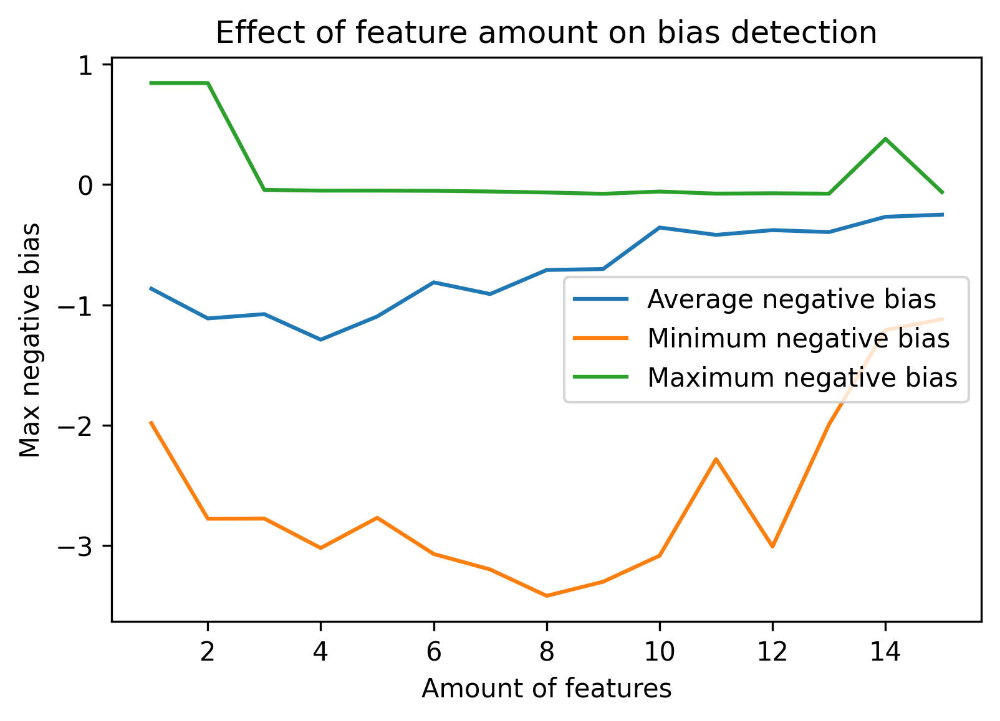

In [11]:
#### PLot results
# upper_std = (np.array(biases)+np.array(bias_std))
# lower_std = (np.array(biases)-np.array(bias_std))
# plt.fill_between([i for i in range(1,FEATURE_AMOUNT)],lower_std, upper_std, color='b', alpha=.1)

plt.plot([i for i in range(1,max_features+1)], mean_biases, label='Average negative bias')
plt.plot([i for i in range(1,max_features+1)], min_biases, label='Minimum negative bias')
plt.plot([i for i in range(1,max_features+1)], max_biases, label='Maximum negative bias')
plt.ylabel('Max negative bias')
plt.xlabel('Amount of features')
plt.title('Effect of feature amount on bias detection')
plt.legend()
plt.show()


In [12]:

# Best feature set : ['overgewicht', 
#                     'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 
#                     'interior_type_shell', 'score_voorzieningen', 
#                     'huishoudenstotaal', 'geweld', 'energy_label_d', 
#                     'vernielingen', 'parking_type_betaald'] -2.280493375256789

# Best feature set : ['overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 
# 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 
# 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 
# 'parking_type_garage', 'bouwjaarvanaf'] -1.2089203858978959

# Best feature set : ['overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld', 'energy_label_d', 'vernielingen', 'parking_type_betaald', 'ordeverstoring', 'parking_type_garage', 'bouwjaarvanaf', 'energy_label_e'] -1.1178192002323142

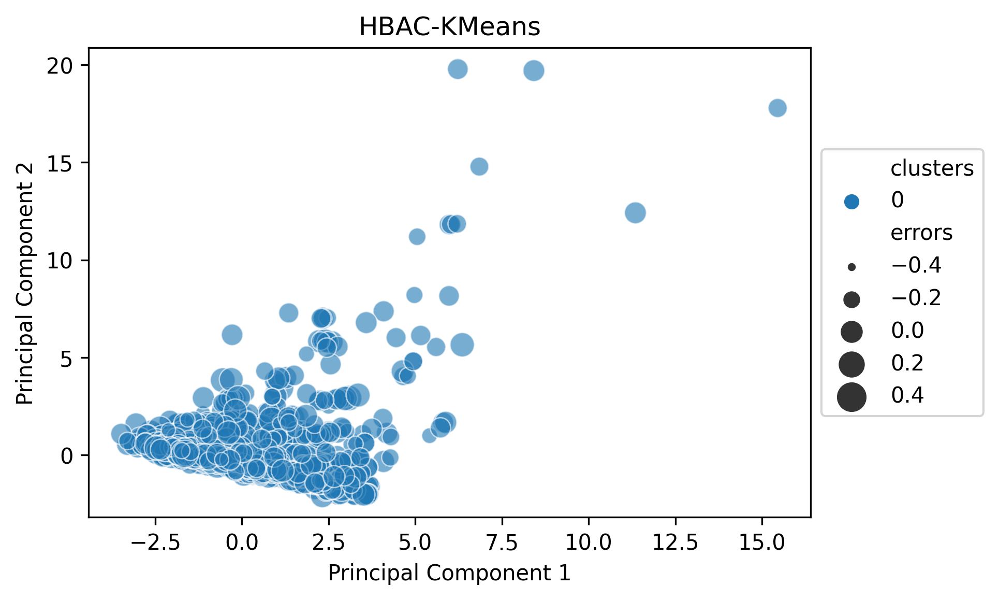

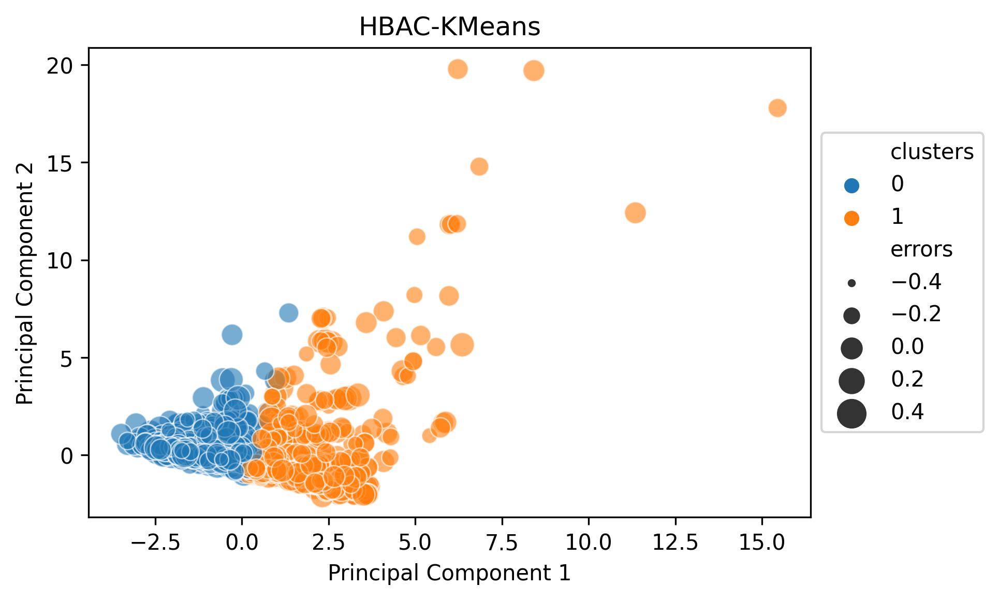

CLUSTER QUALITY
Silhouetter Score: 0.291
DB index: 1.521
CH index: 851.251


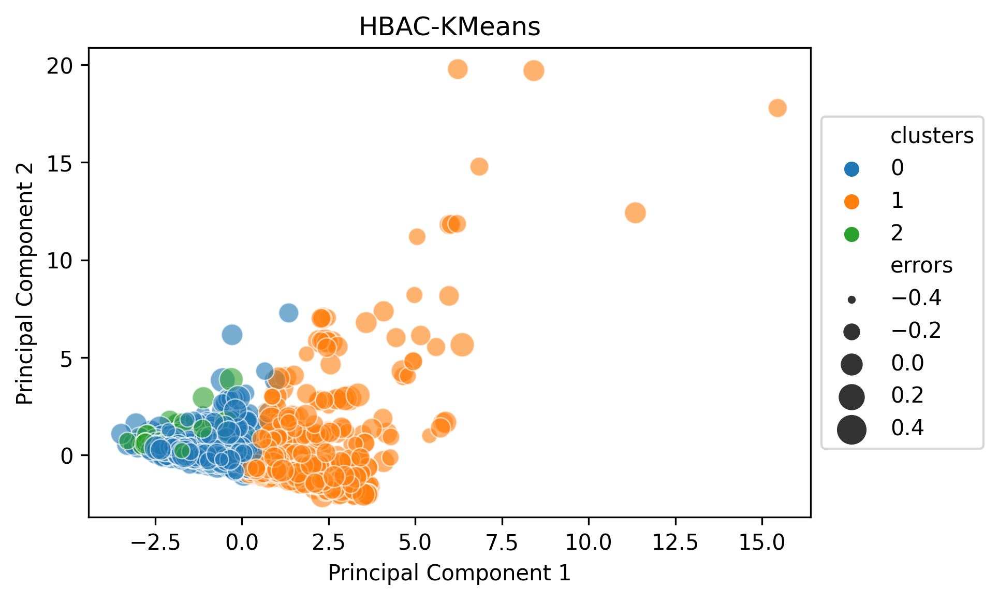

CLUSTER QUALITY
Silhouetter Score: 0.313
DB index: 1.240
CH index: 666.678


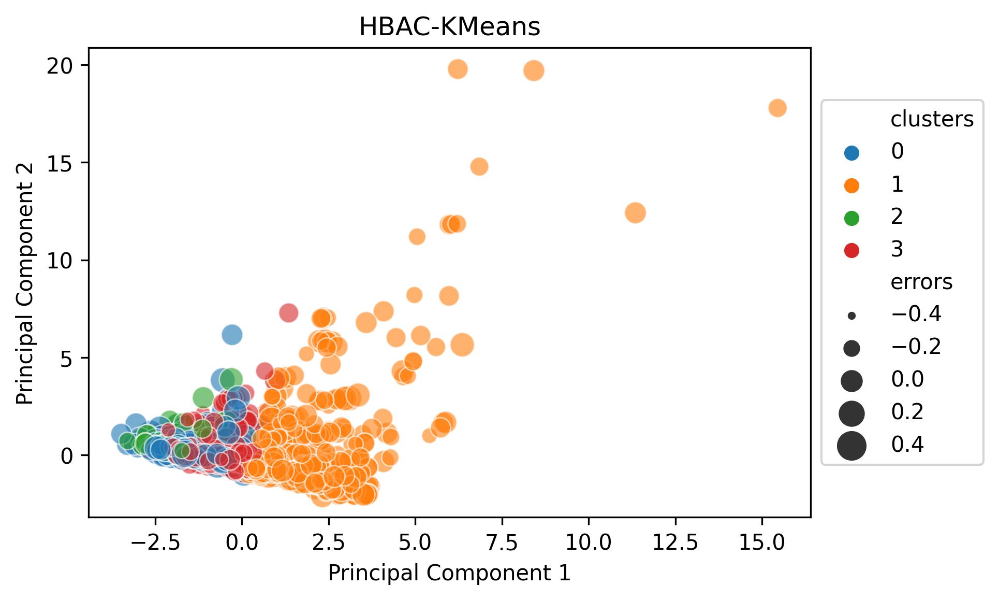

CLUSTER QUALITY
Silhouetter Score: 0.130
DB index: 1.626
CH index: 506.194


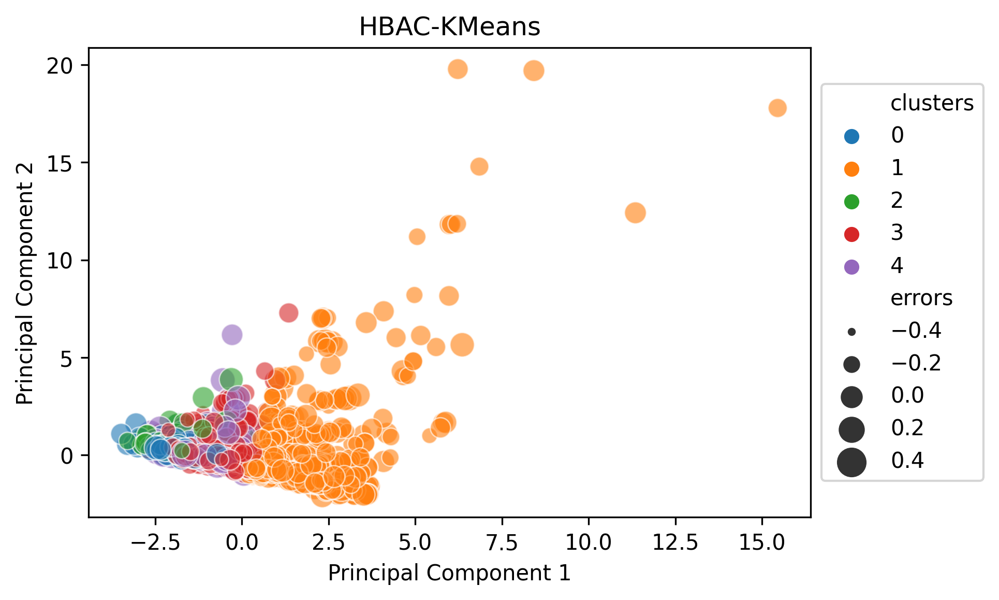

CLUSTER QUALITY
Silhouetter Score: 0.089
DB index: 1.634
CH index: 397.020


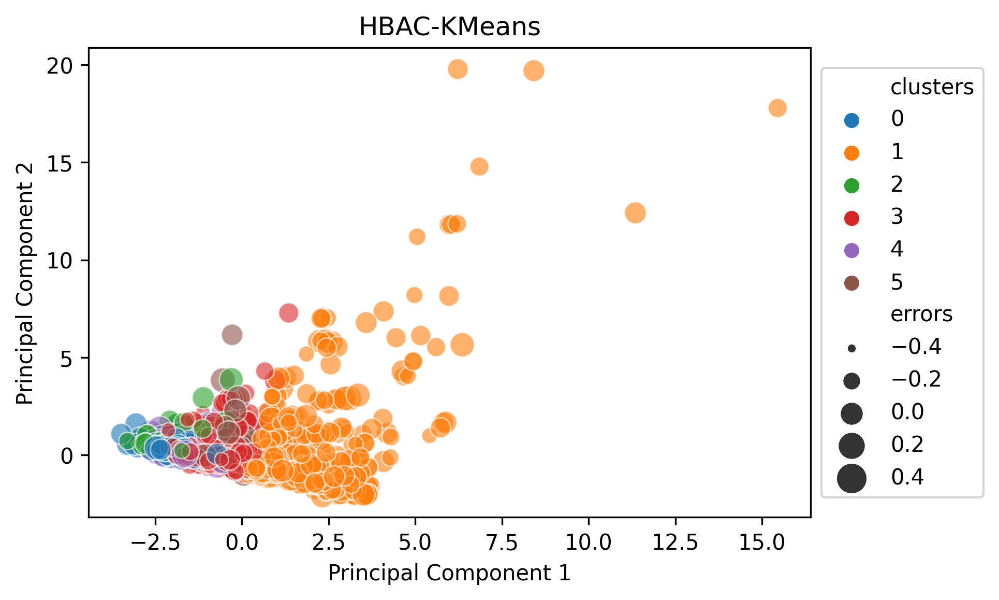

CLUSTER QUALITY
Silhouetter Score: 0.079
DB index: 1.761
CH index: 322.333
1 has bias 0.05835791270089574
3 has bias -0.0578706547164044
0 has bias 0.05783386997075257
2 has bias -0.056089236518595986
5 has bias -0.4120502401126819
4 has bias -3.2994410708735415
cluster with the highest discriminating bias: 4


In [14]:
eight_best_features = ['overgewicht', 'bevolkingsdichtheid', 'bouwjaar_x', 'geweldsenseksuelemisdrijven', 'interior_type_shell', 'score_voorzieningen', 'huishoudenstotaal', 'geweld']
eight_best_features.extend(['predicted_class', 'true_class' ,'errors'])
results = hbac_kmeans.hbac_kmeans(df[eight_best_features], 0.8, show_plot=True)
c, max_neg_bias = hbac_kmeans.get_max_bias_cluster(results, printing=False)
